# CMIP6 Visualizations

Heavily modified from Molly's code; made more efficient with ChatGPT

## Prepare data

After this code is ran, all 4 sections below can be ran independent of one another

In [2]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np
import pandas as pd
import seaborn as sns
import os

In [3]:
# Function to load the dataset
def open_series(fpath_stem, which_date, which_gcm, which_ssp):
    this_fpath = os.path.expanduser(fpath_stem + '{}-gcm_data_{}_{}_compiled_output.nc'.format(which_date, which_gcm, which_ssp))
    return xr.open_dataset(this_fpath)

In [4]:
# Define variables
# I believe that these are the only 12 GCMs that will run all 4 standard SSPs
base = '/Users/ziggygoddard/Documents/summer24/'
gcm_list = ['BCC-CSM2-MR', 'CESM2', 'CESM2-WACCM', 'EC-Earth3', 'FGOALS-f3-L', 'GFDL-ESM4','INM-CM4-8',
            'INM-CM5-0', 'MRI-ESM2-0', 'NorESM2-MM', 'EC-Earth3-Veg', 'MPI-ESM1-2-HR']
date_list = ['2024-07-03', '2024-07-11']
# La Paz date: '2024-06-26', '2024-07-10'
# Quito region date: '2024-07-06', '2024-07-09'
# Quito date: '2024-07-03', '2024-07-11' (this is only two glaciers)
# Santiago date: '2024-07-03', '2024-07-04', '2024-07-10'
ssp_list = ['ssp126', 'ssp245','ssp370', 'ssp585']
n_roll = 3 # This value rolls the data back by 3 months in the seasonal plots to show trends

# 1. Seasonal runoff

## Functions

In [5]:
# Calculate seasonal runoff
def calc_seasonal(this_ds):
    melt1 = this_ds.melt_on_glacier_monthly
    melt2 = this_ds.melt_off_glacier_monthly
    melt3 = this_ds.liq_prcp_off_glacier_monthly
    melt4 = this_ds.liq_prcp_on_glacier_monthly

    # Calculate total liquid precipitation
    total_liq_prcp_m = melt3.sum(dim='rgi_id').dropna(dim='time') + melt4.sum(dim='rgi_id').dropna(dim='time')

    # Calculate total runoff
    this_sum = melt1.sum(dim='rgi_id').dropna(dim='time') + melt2.sum(dim='rgi_id').dropna(dim='time') + total_liq_prcp_m
    nonzero_sum = this_sum.where(this_sum != 0, drop=True)
    nonzero_sum *= 1e-9

    return nonzero_sum

In [6]:
# Select a year and take the mean runoff of all GCMs for this year
def season_sliced(keys, dictionary, time):
    new_df = pd.DataFrame()
    for k in keys:
        new = dictionary[k]
        new = new.isel(time=time)
        new = pd.DataFrame(new)
        new_df[k] = new
    new_df['mean'] = new_df.transpose().mean()
    return new_df

In [7]:
# Calculate monthly runoff for a given runoff value
def rtype_calc_monthly(keys, dictionary, runoff):
    dataframe = pd.DataFrame()
    for k in keys:
        rtype_gcm = dictionary[k]
        if runoff == 'total_liq_prcp_m':
            rtype = rtype_gcm['liq_prcp_off_glacier_m'] + rtype_gcm['liq_prcp_on_glacier_m']
        else:
            if runoff.endswith('_m'):
                rtype = rtype_gcm[runoff]
            else:
                rtype = rtype_gcm[runoff + '_monthly']  # Assuming your data keys end with '_monthly'
        rtype = pd.DataFrame(rtype)
        dataframe[k] = rtype
    dataframe['mean'] = dataframe.transpose().mean()
    return dataframe

In [8]:
# Load datasets and calculate seasonal values
all_monthly_dict = {}
season_unroll = {}

for date in date_list:
    for gcm in gcm_list:
        for ssp in ssp_list:
            filepath = f"{base}{date}-gcm_data_{gcm}_{ssp}_compiled_output.nc"
            if os.path.exists(filepath):
                try:
                    ssp_value = xr.open_dataset(filepath)
                    k = f"{gcm}-{ssp}"
                    all_monthly_dict[k] = ssp_value
                    season_unroll[k] = calc_seasonal(ssp_value)
                    print(f"Loaded and processed: {filepath}")
                except Exception as e:
                    print(f"Failed to process {filepath}: {e}")
                    #pass # un-comment this out if print statements not wanted
            else:
                print(f"File missing: {filepath}") # This checks all possible GCM/date combinations, so if it says files are missing that might be fine
                #pass

# Check the contents of all_monthly_dict; all GCM/SSP combinations should be at the bottom
print(f"Loaded datasets: {list(all_monthly_dict.keys())}")

Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-07-03-gcm_data_BCC-CSM2-MR_ssp126_compiled_output.nc
Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-07-03-gcm_data_BCC-CSM2-MR_ssp245_compiled_output.nc
Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-07-03-gcm_data_BCC-CSM2-MR_ssp370_compiled_output.nc
Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-07-03-gcm_data_BCC-CSM2-MR_ssp585_compiled_output.nc
Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-07-03-gcm_data_CESM2_ssp126_compiled_output.nc
Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-07-03-gcm_data_CESM2_ssp245_compiled_output.nc
Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-07-03-gcm_data_CESM2_ssp370_compiled_output.nc
Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-07-03-gcm_data_CESM2_ssp585_compiled_output.nc
Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-07-03-

In [9]:
# Rolling and summing values
dict_roll = {}
rtype_roll = {}
rtype_calc_s = {}
rtype_calc_e = {}

In [10]:
for k in season_unroll.keys():
    season_roll = season_unroll[k].roll(month_2d=n_roll, roll_coords=False)
    dict_roll[k] = season_roll
    rtype_season = all_monthly_dict[k].roll(month_2d=n_roll, roll_coords=True)
    rtype_sum = rtype_season.sum(dim='rgi_id')
    rtype_roll[k] = rtype_sum

    df_key = rtype_roll[k]
    df_m_s = df_key.isel(time=slice(0, 10)).mean(dim='time').to_dataframe() * 1e-9
    df_m_s.columns = [c.replace('_monthly', '_m') for c in df_m_s.columns]
    df_m_s = df_m_s.clip(0)
    rtype_calc_s[k] = df_m_s

    df_m_e = df_key.isel(time=slice(-11, -1)).mean(dim='time').to_dataframe() * 1e-9
    df_m_e.columns = [c.replace('_monthly', '_m') for c in df_m_e.columns]
    df_m_e = df_m_e.clip(0)
    rtype_calc_e[k] = df_m_e

## Plot runoff

### Plot runoff components

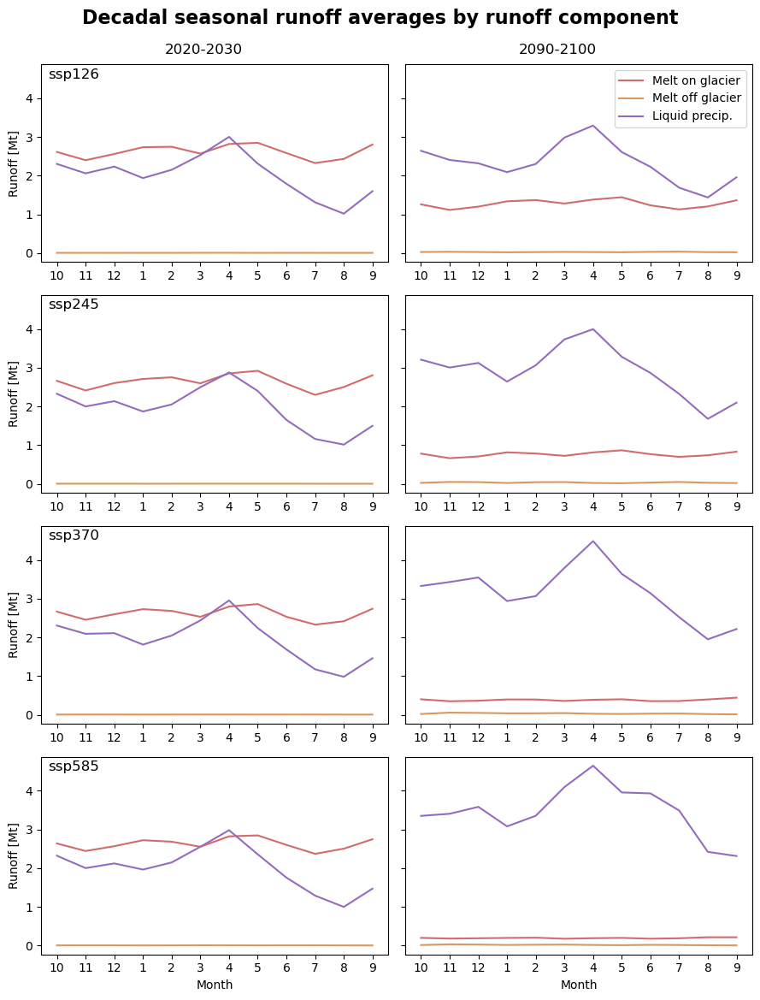

In [16]:
# Function to calculate and visualize runoff
def plot_runoff(axes, rtype_calc_s, rtype_calc_e, index2, season_roll, season_roll2, ssp, row):
    runoff_variables = ['melt_on_glacier_m', 'melt_off_glacier_m', 'total_liq_prcp_m']
    colors = ['#d16b6c', '#d9985f', '#946cbd']
    labels = ['Melt on glacier', 'Melt off glacier', 'Liquid precip.']
    s_keys = rtype_calc_s.keys()

    # Store lines for the legend
    lines = []

    for i, r in enumerate(runoff_variables):
        if r == 'total_liq_prcp_m':
            runoff_s = rtype_calc_monthly(s_keys, rtype_calc_s, 'total_liq_prcp_m')
            runoff_e = rtype_calc_monthly(s_keys, rtype_calc_e, 'total_liq_prcp_m')
        else:
            runoff_s = rtype_calc_monthly(s_keys, rtype_calc_s, r)
            runoff_e = rtype_calc_monthly(s_keys, rtype_calc_e, r)
        
        line1, = axes[row, 0].plot(index2, runoff_s['mean'], label=labels[i], color=colors[i])
        line2, = axes[row, 1].plot(index2, runoff_e['mean'], label=labels[i], color=colors[i])
        
        if row == 0:
            lines.append(line1)

    for col in range(2):
        ax = axes[row, col]
        ax.set(xticks=season_roll['month_2d'].values,
                xticklabels=season_roll2['month_2d'].values)

    # Set x-axis labels only for the bottom row
    for ax in axes[-1, :]:
        ax.set_xlabel('Month')

    axes[row, 0].set(ylabel=f'Runoff [Mt]')

    return lines, labels

# Create a 4x2 grid of subplots
f, axes = plt.subplots(4, 2, figsize=(9, 12), sharey=True)

# Plotting for each SSP
all_lines = []
all_labels = []
for row, ssp in enumerate(ssp_list):
    ssp_keys = [key for key in season_unroll.keys() if ssp in key]
    season_roll2 = season_unroll[ssp_keys[0]].roll(month_2d=n_roll, roll_coords=True)
    index1 = season_unroll[ssp_keys[0]]
    index2 = index1['month_2d']
    
    lines, labels = plot_runoff(axes, 
                                {k: v for k, v in rtype_calc_s.items() if ssp in k}, 
                                {k: v for k, v in rtype_calc_e.items() if ssp in k}, 
                                index2, season_roll, season_roll2, ssp, row)

    # Add SSP label in the upper left corner of each plot on the left
    if row < 4:
        axes[row, 0].text(0.02, 0.98, ssp, transform=axes[row, 0].transAxes,
                          verticalalignment='top', horizontalalignment='left',
                          fontsize=12)
    
    if row == 0:
        all_lines.extend(lines)
        all_labels.extend(labels)

# Add a single overarching title
plt.suptitle('Decadal seasonal runoff averages by runoff component', y=0.97, fontsize=16, fontweight='bold')

# Add titles above each column of plots
f.text(0.27, 0.93, '2020-2030', ha='center', va='center', fontsize=12)
f.text(0.73, 0.93, '2090-2100', ha='center', va='center', fontsize=12)

# Add a single legend
axes[0, 1].legend(all_lines, all_labels, loc='upper right')

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the title and legend
plt.savefig("LaPaz_seasonal.png")
plt.show()


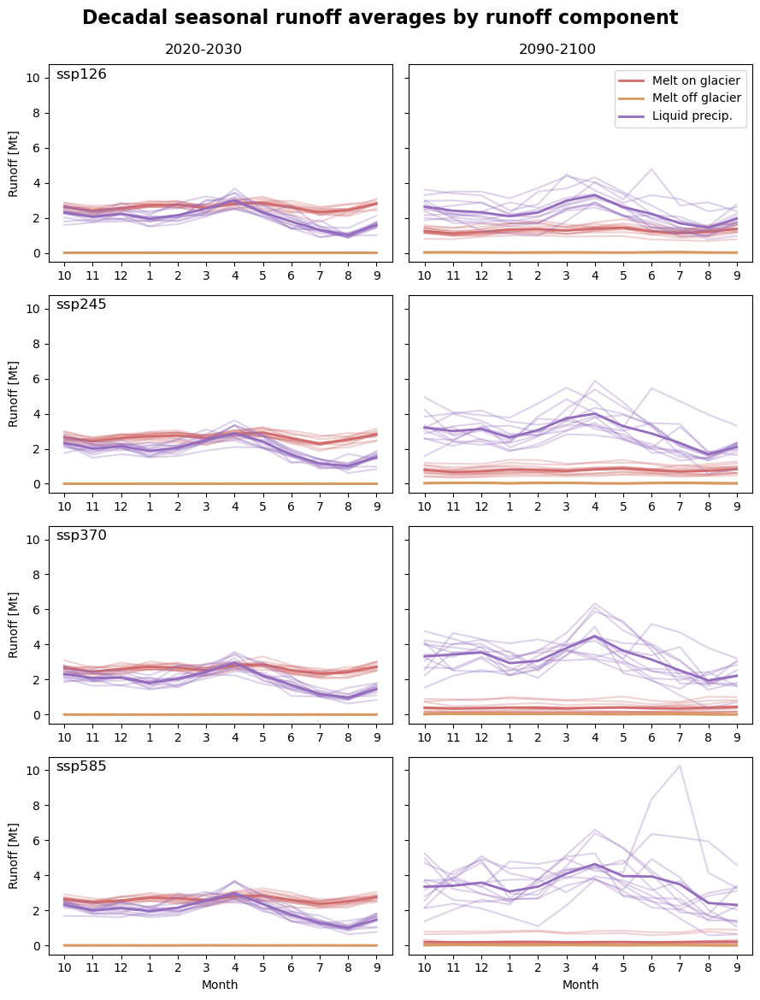

In [18]:
# Function to calculate and visualize runoff
def plot_runoff(axes, rtype_calc_s, rtype_calc_e, index2, season_roll, season_roll2, ssp, row):
    runoff_variables = ['melt_on_glacier_m', 'melt_off_glacier_m', 'total_liq_prcp_m']
    colors = ['#d16b6c', '#d9985f', '#946cbd']
    labels = ['Melt on glacier', 'Melt off glacier', 'Liquid precip.']
    s_keys = list(rtype_calc_s.keys())

    # Store lines for the legend
    lines = []

    for i, r in enumerate(runoff_variables):
        # Plot individual GCMs
        for gcm in s_keys:
            if r == 'total_liq_prcp_m':
                if 'liq_prcp_off_glacier_m' in rtype_calc_s[gcm].columns and 'liq_prcp_on_glacier_m' in rtype_calc_s[gcm].columns:
                    liq_prcp_total_s = rtype_calc_s[gcm]['liq_prcp_off_glacier_m'] + rtype_calc_s[gcm]['liq_prcp_on_glacier_m']
                    liq_prcp_total_e = rtype_calc_e[gcm]['liq_prcp_off_glacier_m'] + rtype_calc_e[gcm]['liq_prcp_on_glacier_m']
                    axes[row, 0].plot(index2, liq_prcp_total_s, color=colors[i], alpha=0.3)
                    axes[row, 1].plot(index2, liq_prcp_total_e, color=colors[i], alpha=0.3)
            else:
                if r in rtype_calc_s[gcm].columns and r in rtype_calc_e[gcm].columns:
                    axes[row, 0].plot(index2, rtype_calc_s[gcm][r], color=colors[i], alpha=0.3)
                    axes[row, 1].plot(index2, rtype_calc_e[gcm][r], color=colors[i], alpha=0.3)
        
        # Calculate and plot the mean
        if r == 'total_liq_prcp_m':
            runoff_s = rtype_calc_monthly(s_keys, rtype_calc_s, 'total_liq_prcp_m')
            runoff_e = rtype_calc_monthly(s_keys, rtype_calc_e, 'total_liq_prcp_m')
        else:
            runoff_s = rtype_calc_monthly(s_keys, rtype_calc_s, r)
            runoff_e = rtype_calc_monthly(s_keys, rtype_calc_e, r)

        line1, = axes[row, 0].plot(index2, runoff_s['mean'], label=labels[i], color=colors[i], linewidth=2)
        line2, = axes[row, 1].plot(index2, runoff_e['mean'], label=labels[i], color=colors[i], linewidth=2)
        
        if row == 0:
            lines.append(line1)

    for col in range(2):
        ax = axes[row, col]
        ax.set(xticks=season_roll['month_2d'].values,
                xticklabels=season_roll2['month_2d'].values)

    # Set x-axis labels only for the bottom row
    for ax in axes[-1, :]:
        ax.set_xlabel('Month')

    axes[row, 0].set(ylabel=f'Runoff [Mt]')

    return lines, labels

# Create a 4x2 grid of subplots
f, axes = plt.subplots(4, 2, figsize=(9, 12), sharey=True)

# Plotting for each SSP
all_lines = []
all_labels = []
for row, ssp in enumerate(ssp_list):
    ssp_keys = [key for key in season_unroll.keys() if ssp in key]
    season_roll2 = season_unroll[ssp_keys[0]].roll(month_2d=n_roll, roll_coords=True)
    index1 = season_unroll[ssp_keys[0]]
    index2 = index1['month_2d']
    
    lines, labels = plot_runoff(axes, 
                                {k: v for k, v in rtype_calc_s.items() if ssp in k}, 
                                {k: v for k, v in rtype_calc_e.items() if ssp in k}, 
                                index2, season_roll, season_roll2, ssp, row)

    # Add SSP label in the upper left corner of each plot on the left
    if row < 4:
        axes[row, 0].text(0.02, 0.98, ssp, transform=axes[row, 0].transAxes,
                          verticalalignment='top', horizontalalignment='left',
                          fontsize=12)
    
    if row == 0:
        all_lines.extend(lines)
        all_labels.extend(labels)

# Add a single overarching title
plt.suptitle('Decadal seasonal runoff averages by runoff component', y=0.97, fontsize=16, fontweight='bold')

# Add titles above each column of plots
f.text(0.27, 0.93, '2020-2030', ha='center', va='center', fontsize=12)
f.text(0.73, 0.93, '2090-2100', ha='center', va='center', fontsize=12)

# Add a single legend
axes[0, 1].legend(all_lines, all_labels, loc='upper right')

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the title and legend
plt.show()


/var/folders/q4/r3b9pkcx6bn5djf1vxnj5xkr0000gn/T/ipykernel_49430/3057990396.py:69: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust rect to make space for the super title and legend


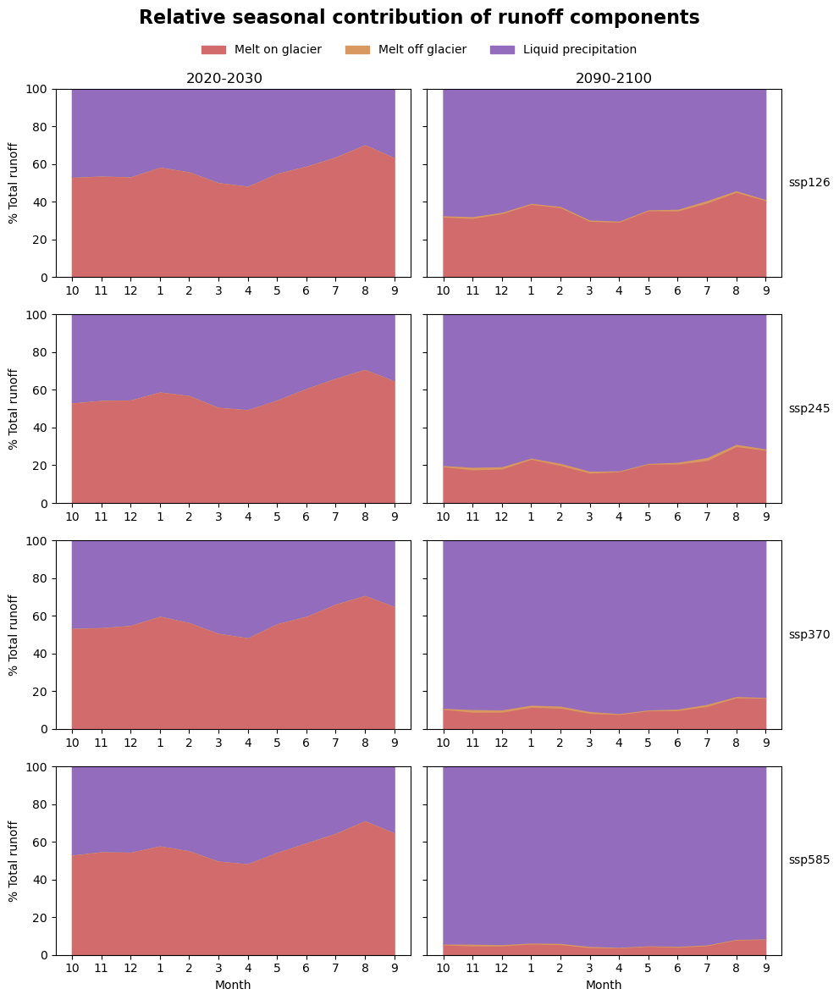

In [19]:
def plot_relative_contribution_filled_monthly(rtype_calc_s, rtype_calc_e, index2, ssp_list, season_roll, season_roll2, y_max=300, legend_loc='upper center'):
    # Define the runoff variables of interest
    runoff_variables = ['melt_on_glacier_m', 'melt_off_glacier_m', 'total_liq_prcp_m']

    f, axes = plt.subplots(4, 2, figsize=(10, 12), sharey=True, constrained_layout=True)

    colors = ['#d16b6c', '#d9985f', '#946cbd']
    labels = ['Melt on glacier', 'Melt off glacier', 'Liquid precipitation']

    for row, ssp in enumerate(ssp_list):
        lower_bounds_s = lower_bounds_e = None  # Initialize lower bounds within the loop for each SSP
        for r, color, label in zip(runoff_variables, colors, labels):
            # Filter data for the current SSP
            ssp_rtype_calc_s = {k: v for k, v in rtype_calc_s.items() if ssp in k}
            ssp_rtype_calc_e = {k: v for k, v in rtype_calc_e.items() if ssp in k}

            # Calculate mean monthly runoff for the specified variable
            runoff_s = rtype_calc_monthly(ssp_rtype_calc_s.keys(), ssp_rtype_calc_s, r)
            runoff_e = rtype_calc_monthly(ssp_rtype_calc_e.keys(), ssp_rtype_calc_e, r)

            # Calculate total monthly runoff
            total_s = sum(rtype_calc_monthly(ssp_rtype_calc_s.keys(), ssp_rtype_calc_s, rv)['mean'] for rv in runoff_variables)
            total_e = sum(rtype_calc_monthly(ssp_rtype_calc_e.keys(), ssp_rtype_calc_e, rv)['mean'] for rv in runoff_variables)

            # Calculate relative contribution as a percentage
            relative_contrib_s = (runoff_s['mean'] / total_s) * 100
            relative_contrib_e = (runoff_e['mean'] / total_e) * 100

            # Initialize arrays to store lower bounds of filled areas
            if lower_bounds_s is None:
                lower_bounds_s = np.zeros_like(relative_contrib_s)
                lower_bounds_e = np.zeros_like(relative_contrib_e)

            # Plot filled area with stacked contributions
            axes[row, 0].fill_between(index2, lower_bounds_s, lower_bounds_s + relative_contrib_s, label=label, color=color, alpha=1)
            axes[row, 1].fill_between(index2, lower_bounds_e, lower_bounds_e + relative_contrib_e, label=label, color=color, alpha=1)

            # Update lower bounds for next component
            lower_bounds_s += relative_contrib_s
            lower_bounds_e += relative_contrib_e

        axes[row, 0].set_ylabel(f'% Total runoff')

        for ax in axes[row, :]:
            ax.legend().set_visible(False)
            ax.set_ylim(0, y_max)

            # Set xticks and xticklabels for all axes
            ax.set(xticks=season_roll['month_2d'].values,
                   xticklabels=season_roll2['month_2d'].values)

        axes[row, 1].annotate(ssp, xy=(1.02, 0.5), xycoords='axes fraction', ha='left', va='center', fontsize=10)

    # Set x-axis labels only for the bottom row
    for ax in axes[-1, :]:
        ax.set_xlabel('Month')

    # Add titles above each column of plots
    f.text(0.27, 0.91, '2020-2030', ha='center', va='center', fontsize=12)
    f.text(0.73, 0.91, '2090-2100', ha='center', va='center', fontsize=12)

    # Create a single legend at the specified location
    handles, labels = axes[0, 0].get_legend_handles_labels()
    f.legend(handles, labels, loc=legend_loc, bbox_to_anchor=(0.5, 0.955), ncol=len(runoff_variables), frameon=False)

    # Set single title at the top of the figure
    f.suptitle('Relative seasonal contribution of runoff components', fontsize=16, fontweight='bold')

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust rect to make space for the super title and legend
    plt.show()

# Example usage for all SSPs
plot_relative_contribution_filled_monthly(
    rtype_calc_s,
    rtype_calc_e, 
    index2, 
    ssp_list, 
    season_roll, 
    season_roll2,
    y_max=100,  # Set the y-axis maximum value
    legend_loc='upper center'  # Control the legend placement
)


### Plot total runoff (decadal)

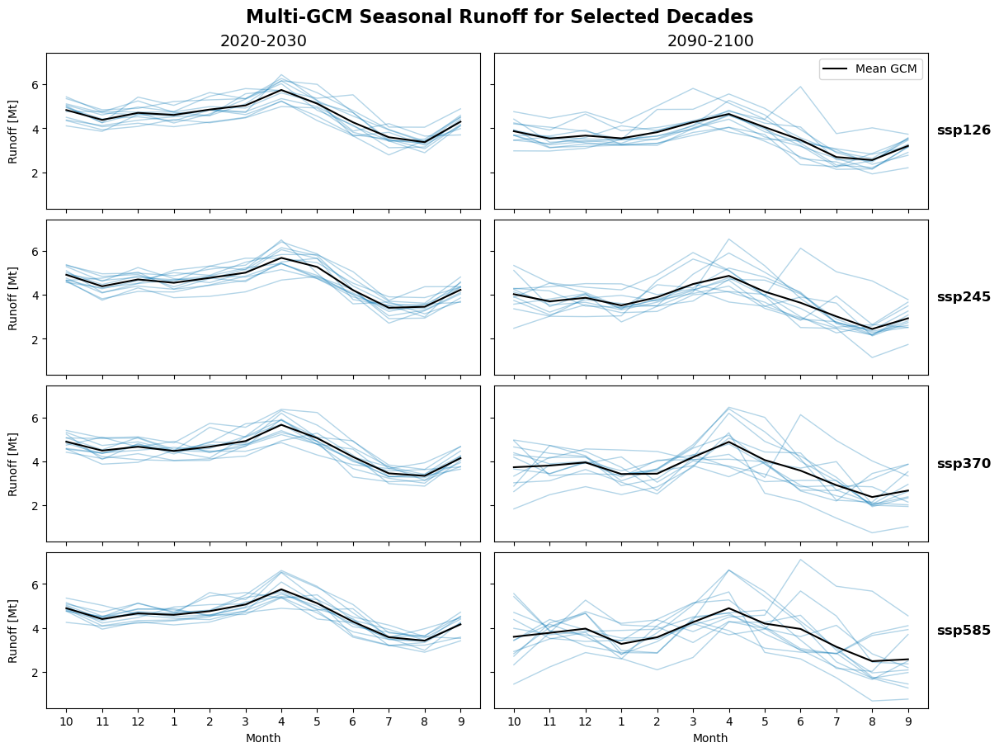

In [20]:
ssps = ssp_list

# Define keys for each SSP
key_dict = {
    'ssp126': [key for key in season_unroll.keys() if 'ssp126' in key],
    'ssp245': [key for key in season_unroll.keys() if 'ssp245' in key],
    'ssp370': [key for key in season_unroll.keys() if 'ssp370' in key],
    'ssp585': [key for key in season_unroll.keys() if 'ssp585' in key]
}

# Function to calculate decadal mean
def calculate_decadal_mean(keys, dictionary, start_year, end_year):
    new_df = pd.DataFrame()
    for k in keys:
        new = dictionary[k].sel(time=slice(start_year, end_year))
        new_mean = new.mean(dim='time')
        new_df[k] = new_mean
    new_df['mean'] = new_df.mean(axis=1)
    return new_df

# Define decades
decades = [(2020, 2030), (2090, 2100)]
decade_labels = ['2020-2030', '2090-2100']

fig, axs = plt.subplots(len(ssps), len(decades), figsize=(12, 9), sharey=True, constrained_layout=True)

light_blue = sns.color_palette("colorblind")[0]  # Choose a light blue color
mean_color = 'black'

for i, ssp in enumerate(ssps):
    for j, (start_year, end_year) in enumerate(decades):
        ssp_keys = key_dict[ssp]
        gcm_data = []

        # Calculate decadal mean
        season_t = calculate_decadal_mean(ssp_keys, dict_roll, start_year, end_year)
        xvals = np.asarray(season_t.index) + 1
        ax = axs[i, j]
        
        for key in ssp_keys:
            ax.plot(xvals, season_t[key], color=light_blue, alpha=0.3, linewidth=1)  # Plot individual GCMs
            gcm_data.append(season_t[key].values)

        # Calculate and plot the mean GCM
        if gcm_data:
            mean_gcm = np.mean(gcm_data, axis=0)
            ax.plot(xvals, mean_gcm, color=mean_color, linewidth=1.5, label='Mean GCM')

        if j == 0:
            ax.set_ylabel(f'Runoff [Mt]', labelpad=10)  # Adjust label padding
        
        if i == len(ssps) - 1:
            ax.set_xlabel('Month')
            ax.set_xticks(season_roll['month_2d'].values)
            ax.set_xticklabels(season_roll2['month_2d'].values)
            ax.xaxis.set_ticks_position('bottom')  # Ensure ticks are shown on the bottom axis
        else:
            ax.set_xticks(season_roll['month_2d'].values)  # Keep x-axis ticks for all rows
            ax.set_xticklabels([])  # Remove x-axis labels for plots not on the bottom row

        # Place SSP label on the far right side
        if j == len(decades) - 1:
            ax.text(1.02, 0.5, ssp, transform=ax.transAxes, ha='left', va='center', fontsize=12, fontweight='bold')
        
        ax.grid(False)  # Remove grid lines

        # Set title for each column
        if i == 0:
            ax.set_title(f'{decade_labels[j]}', fontsize=14)

# Move legend to top right plot
axs[0, -1].legend(loc='upper right')

plt.suptitle('Multi-GCM Seasonal Runoff for Selected Decades', fontweight='bold', fontsize=16)
plt.show()

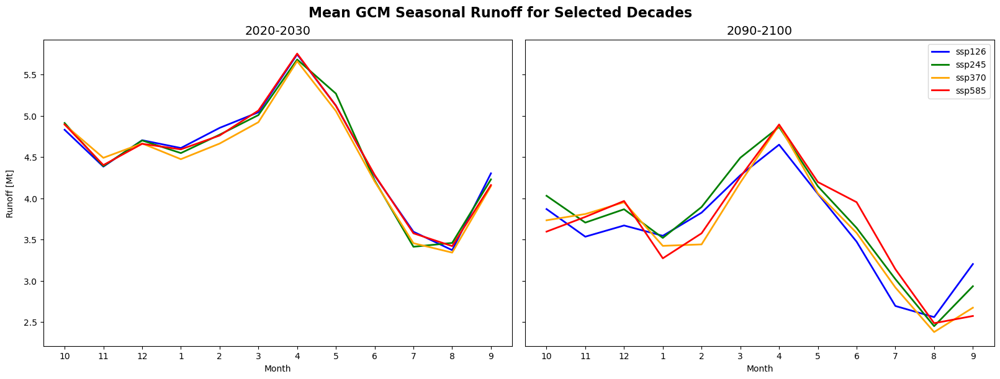

In [21]:
# Define SSP list and keys
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Define keys for each SSP
key_dict = {
    'ssp126': [key for key in season_unroll.keys() if 'ssp126' in key],
    'ssp245': [key for key in season_unroll.keys() if 'ssp245' in key],
    'ssp370': [key for key in season_unroll.keys() if 'ssp370' in key],
    'ssp585': [key for key in season_unroll.keys() if 'ssp585' in key]
}

# Function to calculate decadal mean
def calculate_decadal_mean(keys, dictionary, start_year, end_year):
    new_df = pd.DataFrame()
    for k in keys:
        new = dictionary[k].sel(time=slice(start_year, end_year))
        new_mean = new.mean(dim='time')
        new_df[k] = new_mean
    new_df['mean'] = new_df.mean(axis=1)
    return new_df

# Define decades
decades = [(2020, 2030), (2090, 2100)]
decade_labels = ['2020-2030', '2090-2100']

# Colors for each SSP
colors = {
    'ssp126': 'blue',
    'ssp245': 'green',
    'ssp370': 'orange',
    'ssp585': 'red'
}

fig, axs = plt.subplots(1, 2, figsize=(16, 6), sharey=True, constrained_layout=True)

for j, (start_year, end_year) in enumerate(decades):
    ax = axs[j]
    for i, ssp in enumerate(ssps):
        ssp_keys = key_dict[ssp]
        gcm_data = []

        # Calculate decadal mean
        season_t = calculate_decadal_mean(ssp_keys, dict_roll, start_year, end_year)
        xvals = np.asarray(season_t.index) + 1
        
        for key in ssp_keys:
            gcm_data.append(season_t[key].values)

        # Calculate and plot the mean GCM
        if gcm_data:
            mean_gcm = np.mean(gcm_data, axis=0)
            ax.plot(xvals, mean_gcm, color=colors[ssp], linewidth=2, label=f'{ssp}')

    if j == 0:
        ax.set_ylabel('Runoff [Mt]', labelpad=10)  # Adjust label padding
    
    ax.set_xlabel('Month')
    ax.set_xticks(season_roll['month_2d'].values)
    ax.set_xticklabels(season_roll2['month_2d'].values)
    ax.xaxis.set_ticks_position('bottom')  # Ensure ticks are shown on the bottom axis

    ax.grid(False)  # Remove grid lines
    ax.set_title(f'{decade_labels[j]}', fontsize=14)

# Move legend to the right plot
axs[1].legend(loc='upper right')

plt.suptitle('Mean GCM Seasonal Runoff for Selected Decades', fontweight='bold', fontsize=16)
plt.show()


In [13]:
# Temporal shift in peak runoff
# Function to calculate decadal mean
def calculate_decadal_mean(keys, dictionary, start_year, end_year):
    decadal_means = {}
    for k in keys:
        # Select time slice for the decade and calculate mean
        decadal_mean = dictionary[k].sel(time=slice(start_year, end_year)).mean(dim='time')
        decadal_means[k] = decadal_mean
    return decadal_means 

# Function to find peak runoff month for a given decadal mean
def find_peak_month(decadal_means):
    peak_months = {}
    for k, data in decadal_means.items():
        # Find the month with the maximum runoff
        peak_month = data.idxmax(dim='month_2d').values
        peak_months[k] = peak_month
    return peak_months

# Calculate peak runoff difference between two decades
def calculate_peak_runoff_difference(ssp_keys, dict_roll, decade1, decade2):
    peak_diffs = {}

    for ssp in ssp_keys.keys():
        keys = ssp_keys[ssp]

        # Calculate decadal mean for both decades
        season_t1_means = calculate_decadal_mean(keys, dict_roll, decade1[0], decade1[1])
        season_t2_means = calculate_decadal_mean(keys, dict_roll, decade2[0], decade2[1])

        # Find peak runoff month for each decade
        peak_months1 = find_peak_month(season_t1_means)
        peak_months2 = find_peak_month(season_t2_means)

        # Calculate the temporal difference for each GCM and take the average
        diffs = [(peak_months2[k] - peak_months1[k]) % 12 for k in keys]
        peak_diff = np.mean(diffs)
        peak_diffs[ssp] = peak_diff

    return peak_diffs

# Define decades
decade1 = (2020, 2030)
decade2 = (2090, 2100)

# Calculate peak runoff difference for each SSP
peak_runoff_differences = calculate_peak_runoff_difference(key_dict, dict_roll, decade1, decade2)

# Print the peak runoff differences
print("Peak runoff differences (in months) between 2020-2030 and 2090-2100 for each SSP:")
for ssp, diff in peak_runoff_differences.items():
    print(f"{ssp}: {diff}")


Peak runoff differences (in months) between 2020-2030 and 2090-2100 for each SSP:
ssp126: 8.0
ssp245: 10.583333333333334
ssp370: 10.0
ssp585: 9.75


### Plot total runoff for four years

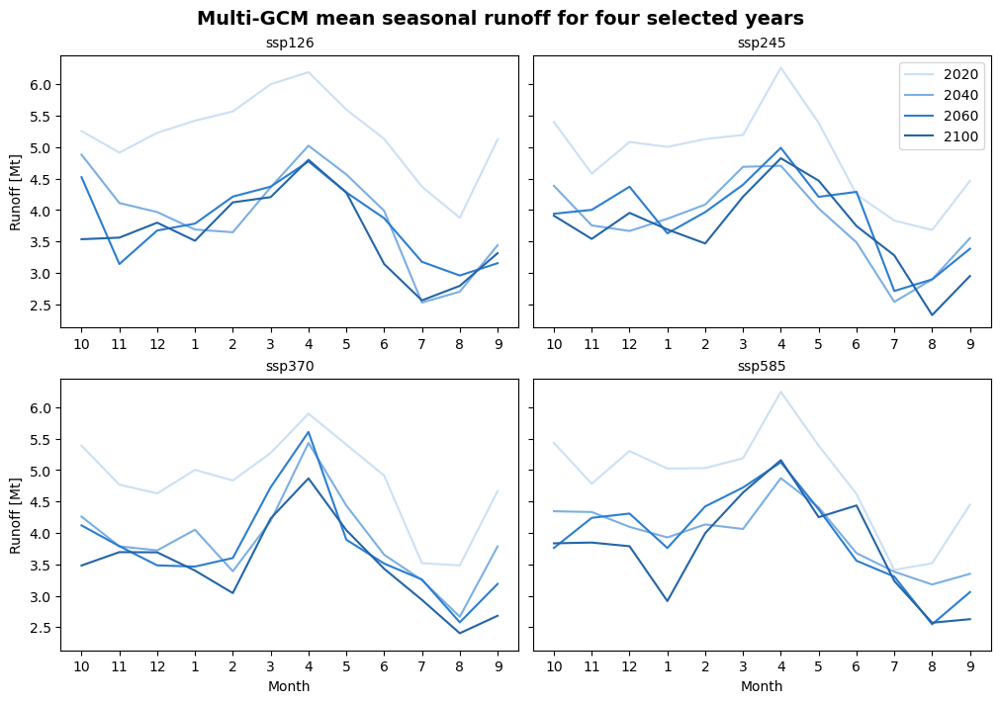

In [34]:
import matplotlib.pyplot as plt
import numpy as np

# Define keys for each SSP
key_dict = {
    'ssp126': [key for key in season_unroll.keys() if 'ssp126' in key],
    'ssp245': [key for key in season_unroll.keys() if 'ssp245' in key],
    'ssp370': [key for key in season_unroll.keys() if 'ssp370' in key],
    'ssp585': [key for key in season_unroll.keys() if 'ssp585' in key]
}

# Plot mean-GCM time slices
time = [0, 20, 40, 80]
color_ts = ['#cce0f4', '#7bafe3', '#2b7ed1', '#2365a8']

fig, axes = plt.subplots(2, 2, figsize=(10, 7), sharey=True, constrained_layout=True)
ssp_list = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

for i, ax in enumerate(axes.flat):
    ssp = ssp_list[i]
    t_idx = 0
    for t in time:
        season_t = season_sliced(key_dict[ssp], dict_roll, t)
        xvals = np.asarray(season_t.index) + 1
        ax.plot(xvals, season_t['mean'], label=t+2020, color=color_ts[t_idx])
        t_idx += 1
    ax.set_xticks(season_roll['month_2d'].values)
    ax.set_xticklabels(season_roll2['month_2d'].values)
    ax.set_title(f'{ssp}', fontsize=10)
    if i in [0, 2]:  # Leftmost plots
        ax.set_ylabel('Runoff [Mt]')
    if i in [2, 3]:  # Bottom plots
        ax.set_xlabel('Month')

axes[0, 1].legend()
plt.suptitle('Multi-GCM mean seasonal runoff for four selected years', fontweight='bold', fontsize=14)
plt.show()


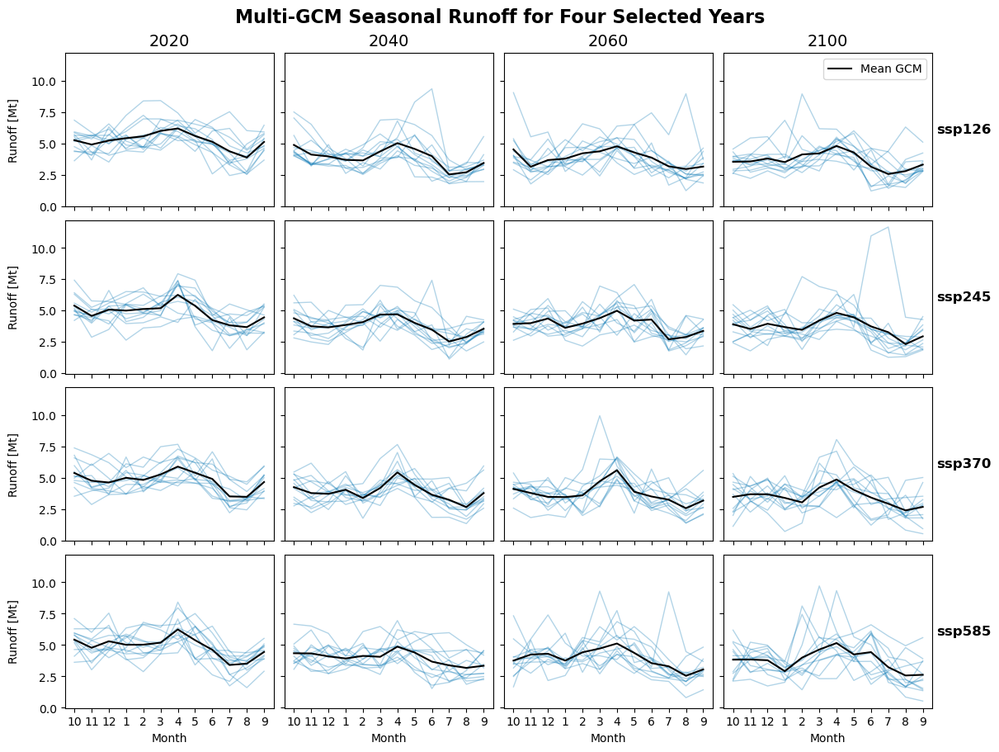

In [35]:
# Define keys for each SSP
key_dict = {
    'ssp126': [key for key in season_unroll.keys() if 'ssp126' in key],
    'ssp245': [key for key in season_unroll.keys() if 'ssp245' in key],
    'ssp370': [key for key in season_unroll.keys() if 'ssp370' in key],
    'ssp585': [key for key in season_unroll.keys() if 'ssp585' in key]
}

# Plot individual GCM time slices and their mean
time = [0, 20, 40, 80]
years = [2020, 2040, 2060, 2100]
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

fig, axs = plt.subplots(len(ssps), len(time), figsize=(12, 9), sharey=True, constrained_layout=True)

light_blue = sns.color_palette("colorblind")[0]  # Choose a light blue color

for i, ssp in enumerate(ssps):
    for j, (t, year) in enumerate(zip(time, years)):
        ssp_keys = key_dict[ssp]
        gcm_data = []

        for key in ssp_keys:
            season_t = season_sliced([key], dict_roll, t)  # Extract data for the current GCM
            xvals = np.asarray(season_t.index) + 1
            ax = axs[i, j]
            ax.plot(xvals, season_t['mean'], color=light_blue, alpha=0.3, linewidth=1)  # Plot individual GCMs
            gcm_data.append(season_t['mean'].values)

        # Calculate and plot the mean GCM
        if gcm_data:
            gcm_data = np.array(gcm_data)
            mean_gcm = np.nanmean(gcm_data, axis=0)  # Use nanmean to handle NaN values
            ax.plot(xvals, mean_gcm, color='black', linewidth=1.5, label='Mean GCM')

        if j == 0:
            ax.set_ylabel(f'Runoff [Mt]', labelpad=10)  # Adjust label padding
        
        if i == len(ssps) - 1:
            ax.set_xlabel('Month')
            ax.set_xticks(season_roll['month_2d'].values)
            ax.set_xticklabels(season_roll2['month_2d'].values)
            ax.xaxis.set_ticks_position('bottom')  # Ensure ticks are shown on the bottom axis
        else:
            ax.set_xticks(season_roll['month_2d'].values)  # Keep x-axis ticks for all rows
            ax.set_xticklabels([])  # Remove x-axis labels for plots not on the bottom row

        # Place SSP label on the far right side
        if j == len(time) - 1:
            ax.text(1.02, 0.5, ssp, transform=ax.transAxes, ha='left', va='center', fontsize=12, fontweight='bold')
        
        ax.grid(False)  # Remove grid lines

        axs[0, 0].set_title('2020', fontsize=14)
        axs[0, 1].set_title('2040', fontsize=14)
        axs[0, 2].set_title('2060', fontsize=14)
        axs[0, 3].set_title('2100', fontsize=14)

# Move legend to top right plot
axs[0, -1].legend(loc='upper right')

plt.suptitle('Multi-GCM Seasonal Runoff for Four Selected Years', fontweight='bold', fontsize=16)
plt.show()

In [36]:
# Statistical summary for above plot

percent_diff_gcm = []
percent_diff_ssp = []

# Calculate percent difference between highest and lowest GCM for each year and SSP
for i, ssp in enumerate(ssps):
    for j, year in enumerate(years):
        ssp_keys = key_dict[ssp]
        gcm_data = []
        
        for key in ssp_keys:
            season_t = season_sliced([key], dict_roll, time[j])  # Extract data for the current GCM and year
            gcm_data.append(season_t['mean'].values.sum())  # Sum of mean values
        
        max_gcm = np.max(gcm_data)
        min_gcm = np.min(gcm_data)
        percent_diff = (max_gcm - min_gcm) / min_gcm * 100
        
        percent_diff_gcm.append((year, ssp, percent_diff))

# Calculate percent difference between SSPs for each year
for j, year in enumerate(years):
    ssp_data = []
    for ssp in ssps:
        ssp_keys = key_dict[ssp]
        ssp_total = 0
        for key in ssp_keys:
            season_t = season_sliced([key], dict_roll, time[j])  # Extract data for the current SSP and year
            ssp_total += season_t['mean'].values.sum()  # Sum of mean values
        ssp_data.append(ssp_total)
    
    max_ssp = np.max(ssp_data)
    min_ssp = np.min(ssp_data)
    percent_diff = (max_ssp - min_ssp) / min_ssp * 100
    percent_diff_ssp.append((year, percent_diff))

# Print statistical summary
print("Statistical Summary based on Total Runoff (sum of mean monthly values):")
for year, ssp, percent_diff in percent_diff_gcm:
    print(f"Year: {year}, SSP: {ssp}")
    print(f"  Percent Difference Between Highest and Lowest GCM: {percent_diff:.2f}%")
    print()

print("Percent Difference Between SSPs for Each Year:")
for year, percent_diff in percent_diff_ssp:
    print(f"Year: {year}")
    print(f"  Percent Difference Between SSPs: {percent_diff:.2f}%")
    print()


Statistical Summary based on Total Runoff (sum of mean monthly values):
Year: 2020, SSP: ssp126
  Percent Difference Between Highest and Lowest GCM: 56.29%

Year: 2040, SSP: ssp126
  Percent Difference Between Highest and Lowest GCM: 54.31%

Year: 2060, SSP: ssp126
  Percent Difference Between Highest and Lowest GCM: 67.22%

Year: 2100, SSP: ssp126
  Percent Difference Between Highest and Lowest GCM: 84.13%

Year: 2020, SSP: ssp245
  Percent Difference Between Highest and Lowest GCM: 54.71%

Year: 2040, SSP: ssp245
  Percent Difference Between Highest and Lowest GCM: 47.29%

Year: 2060, SSP: ssp245
  Percent Difference Between Highest and Lowest GCM: 36.71%

Year: 2100, SSP: ssp245
  Percent Difference Between Highest and Lowest GCM: 109.30%

Year: 2020, SSP: ssp370
  Percent Difference Between Highest and Lowest GCM: 52.55%

Year: 2040, SSP: ssp370
  Percent Difference Between Highest and Lowest GCM: 59.46%

Year: 2060, SSP: ssp370
  Percent Difference Between Highest and Lowest GCM: 

In [5]:
## see this code if you don't want to sum precip components

# import matplotlib.pyplot as plt
# import xarray as xr
# import numpy as np
# import pandas as pd
# import os

# # Function to load the dataset
# def open_series(fpath_stem, which_date, which_gcm, which_ssp):
#     this_fpath = os.path.expanduser(fpath_stem + '{}-gcm_data_{}_{}_compiled_output.nc'.format(which_date, which_gcm, which_ssp))
#     return xr.open_dataset(this_fpath)

# # Calculate seasonal runoff
# def calc_seasonal(this_ds):
#     melt1 = this_ds.melt_on_glacier_monthly
#     melt2 = this_ds.melt_off_glacier_monthly
#     melt3 = this_ds.liq_prcp_off_glacier_monthly
#     melt4 = this_ds.liq_prcp_on_glacier_monthly

#     this_sum = melt1.sum(dim='rgi_id').dropna(dim='time') + melt2.sum(dim='rgi_id').dropna(dim='time') + melt3.sum(dim='rgi_id').dropna(dim='time') + melt4.sum(dim='rgi_id').dropna(dim='time')
#     nonzero_sum = this_sum.where(this_sum != 0, drop=True)
#     nonzero_sum *= 1e-9

#     return nonzero_sum

# # Select a year and take the mean runoff of all GCMs for this year
# def season_sliced(keys, dictionary, time):
#     new_df = pd.DataFrame()
#     for k in keys:
#         new = dictionary[k]
#         new = new.isel(time=time)
#         new = pd.DataFrame(new)
#         new_df[k] = new
#     new_df['mean'] = new_df.transpose().mean()
#     return new_df

# # Calculate monthly runoff for a given runoff value
# def rtype_calc_monthly(keys, dictionary, runoff):
#     dataframe = pd.DataFrame()
#     for k in keys:
#         rtype_gcm = dictionary[k]
#         rtype = rtype_gcm[runoff]
#         rtype = pd.DataFrame(rtype)
#         dataframe[k] = rtype
#         dataframe['mean'] = dataframe.transpose().mean()
#     return dataframe

# # Function to calculate and visualize runoff
# def plot_runoff(rtype_calc_s, rtype_calc_e, index2, ssp, season_roll, season_roll2):
#     runoff_variables = ['melt_off_glacier_m', 'melt_on_glacier_m', 'liq_prcp_off_glacier_m', 'liq_prcp_on_glacier_m']
#     s_keys = rtype_calc_s.keys()

#     f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7), sharey=True)

#     for r in runoff_variables:
#         runoff_s = rtype_calc_monthly(s_keys, rtype_calc_s, r)
#         runoff_e = rtype_calc_monthly(s_keys, rtype_calc_e, r)
#         ax1.plot(index2, runoff_s['mean'], label=r)
#         ax2.plot(index2, runoff_e['mean'], label=r)

#     ax1.set(ylabel='Runoff [Mt]', title='2020-2030')
#     ax2.set(title='2090-2100')

#     for ax in (ax1, ax2):
#         ax.set(xticks=season_roll['month_2d'].values,
#                xticklabels=season_roll2['month_2d'].values,
#                xlabel='Calendar Month')
#         ax.legend()

#     plt.ylim([-0.5, 15])
#     plt.suptitle(f'Runoff Comparison for {ssp}')
#     plt.show()
    
# # 'gfdl-esm4_r1i1p1f1', 
# # Define variables
# base = '/Users/ziggygoddard/Documents/summer24/'
# gcm_list = ['mpi-esm1-2-hr_r1i1p1f1', 'mri-esm2-0_r1i1p1f1',
#                'ipsl-cm6a-lr_r1i1p1f1', 'ukesm1-0-ll_r1i1p1f2']
# date_list = ['2024-06-12', '2024-06-17', '2024-06-19']
# ssp_list = ['ssp126', 'ssp370', 'ssp585']
# n_roll = 3

# # Load datasets and calculate seasonal values
# all_monthly_dict = {}
# season_unroll = {}
# for gcm in gcm_list:
#     for date in date_list:
#         for ssp in ssp_list:
#             filepath = base + '{}-gcm_data_{}_{}_compiled_output.nc'.format(date, gcm, ssp)
#             if os.path.exists(filepath):
#                 ssp_value = open_series(fpath_stem=base, which_date=date, which_gcm=gcm, which_ssp=ssp)
#                 k = '{}-{}'.format(gcm, ssp)
#                 all_monthly_dict[k] = ssp_value
#                 season_unroll[k] = calc_seasonal(ssp_value)

# # Rolling and summing values
# dict_roll = {}
# rtype_roll = {}
# rtype_calc_s = {}
# rtype_calc_e = {}

# for k in season_unroll.keys():
#     season_roll = season_unroll[k].roll(month_2d=n_roll, roll_coords=False)
#     dict_roll[k] = season_roll
#     rtype_season = all_monthly_dict[k].roll(month_2d=n_roll, roll_coords=True)
#     rtype_sum = rtype_season.sum(dim='rgi_id')
#     rtype_roll[k] = rtype_sum

#     df_key = rtype_roll[k]
#     df_m_s = df_key.isel(time=slice(0, 10)).mean(dim='time').to_dataframe() * 1e-9
#     df_m_s.columns = [c.replace('_monthly', '_m') for c in df_m_s.columns]
#     df_m_s = df_m_s.clip(0)
#     rtype_calc_s[k] = df_m_s

#     df_m_e = df_key.isel(time=slice(-11, -1)).mean(dim='time').to_dataframe() * 1e-9
#     df_m_e.columns = [c.replace('_monthly', '_m') for c in df_m_e.columns]
#     df_m_e = df_m_e.clip(0)
#     rtype_calc_e[k] = df_m_e

# # Plotting for each SSP
# for ssp in ssp_list:
#     ssp_keys = [key for key in season_unroll.keys() if ssp in key]
#     season_roll2 = season_unroll[ssp_keys[0]].roll(month_2d=n_roll, roll_coords=True)
#     index1 = season_unroll[ssp_keys[0]]
#     index2 = index1['month_2d']

#     plot_runoff({k: v for k, v in rtype_calc_s.items() if ssp in k},
#                 {k: v for k, v in rtype_calc_e.items() if ssp in k},
#                 index2, ssp, season_roll, season_roll2)

In [6]:
# # This is code to check missing and loaded files
# base = '/Users/ziggygoddard/Documents/summer24/'
 
# gcm_list = ['mpi-esm1-2-hr_r1i1p1f1', 'mri-esm2-0_r1i1p1f1', 
#             'ipsl-cm6a-lr_r1i1p1f1', 'ukesm1-0-ll_r1i1p1f2', 'gfdl-esm4_r1i1p1f1']
# date_list = ['2024-06-19', '2024-06-20']
# ssp_list = ['ssp126', 'ssp370', 'ssp585']

# missing_files = []
# all_monthly_dict = {}
# season_unroll = {}

# for date in date_list:
#     for gcm in gcm_list:
#         for ssp in ssp_list:
#             filepath = f"{base}{date}-gcm_data_{gcm}_{ssp}_compiled_output.nc"
#             if os.path.exists(filepath):
#                 try:
#                     ssp_value = xr.open_dataset(filepath)
#                     k = f"{gcm}-{ssp}"
#                     all_monthly_dict[k] = ssp_value
#                     season_unroll[k] = calc_seasonal(ssp_value)
#                     print(f"Loaded and processed: {filepath}")
#                 except Exception as e:
#                     pass
#             else:
#                 pass

# if missing_files:
#     print("Missing files:")
#     for file in missing_files:
#         print(file)

# 2. Annual runoff

## Functions

In [5]:
# Function to calculate annual runoff components
def calc_annual_runoff_components(this_ds):
    melt_on_glacier = this_ds.melt_on_glacier_monthly.sum(dim='month_2d').sum(dim='rgi_id').dropna(dim='time').sel(time=slice(None, '2101'))
    melt_off_glacier = this_ds.melt_off_glacier_monthly.sum(dim='month_2d').sum(dim='rgi_id').dropna(dim='time').sel(time=slice(None, '2101'))
    liq_prcp_off_glacier = this_ds.liq_prcp_off_glacier_monthly.sum(dim='month_2d').sum(dim='rgi_id').dropna(dim='time').sel(time=slice(None, '2101'))
    liq_prcp_on_glacier = this_ds.liq_prcp_on_glacier_monthly.sum(dim='month_2d').sum(dim='rgi_id').dropna(dim='time').sel(time=slice(None, '2101'))

    annual_liq_prcp = liq_prcp_off_glacier + liq_prcp_on_glacier

    melt_on_glacier *= 1e-9
    melt_off_glacier *= 1e-9
    annual_liq_prcp *= 1e-9

    return {
        'melt_on_glacier': melt_on_glacier,
        'melt_off_glacier': melt_off_glacier,
        'annual_liq_prcp': annual_liq_prcp
    }

In [6]:
# Dictionary to store annual runoff for each GCM and SSP scenario
annual_runoff_dict = {}

for date in date_list:
    for gcm in gcm_list:
        for ssp in ssp_list:
            filepath = f"{base}{date}-gcm_data_{gcm}_{ssp}_compiled_output.nc"
            if os.path.exists(filepath):
                try:
                    ssp_value = xr.open_dataset(filepath)
                    k = f"{gcm}-{ssp}"
                    annual_runoff_dict[k] = calc_annual_runoff_components(ssp_value)
                    #print(f"Loaded and processed annual runoff for: {filepath}")
                except Exception as e:
                    #print(f"Failed to process {filepath}: {e}")
                    pass
            else:
                #print(f"File missing: {filepath}")
                pass

# Check the contents of annual_runoff_dict
#print(f"Loaded annual runoff datasets: {list(annual_runoff_dict.keys())}")

In [7]:
# Function to calculate the mean annual runoff across GCMs for each ssp scenario
def calculate_mean_annual_runoff(annual_runoff_dict, ssps):
    mean_annual_runoff = {}
    for ssp in ssps:
        ssp_data = [annual_runoff for scenario, annual_runoff in annual_runoff_dict.items() if ssp in scenario]
        if ssp_data:
            combined = {component: xr.concat([data[component] for data in ssp_data], dim='gcm').mean(dim='gcm') for component in ssp_data[0]}
            mean_annual_runoff[ssp] = combined
    return mean_annual_runoff

In [8]:
# Function to calculate total annual runoff
def calc_total_annual_runoff(annual_runoff_components):
    total_runoff = (annual_runoff_components['melt_on_glacier'] + 
                    annual_runoff_components['melt_off_glacier'] + 
                    annual_runoff_components['annual_liq_prcp'])
    return total_runoff

In [9]:
# Calculate total annual runoff for each scenario
total_annual_runoff_dict = {}
for key, components in annual_runoff_dict.items():
    total_annual_runoff_dict[key] = calc_total_annual_runoff(components)

## Plot total runoff + variance

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


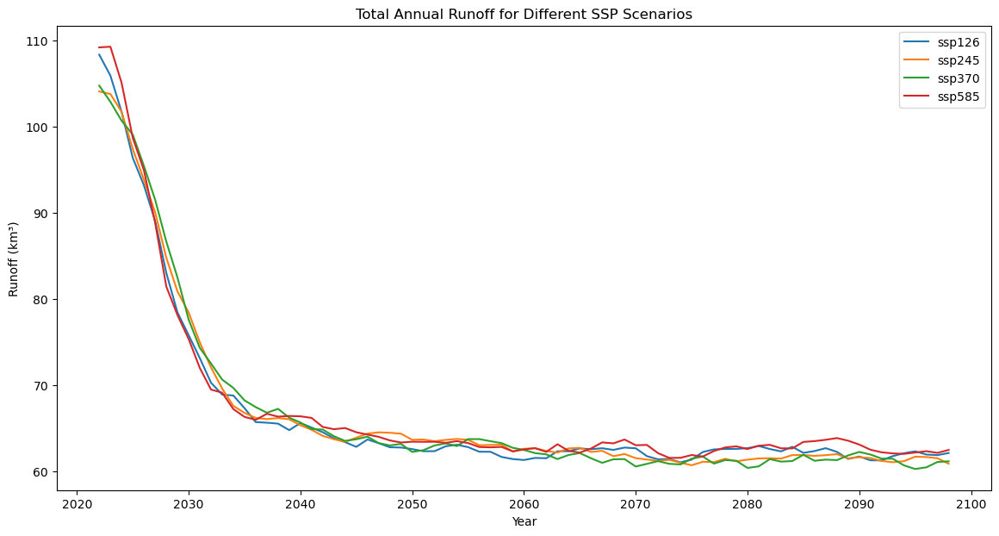

In [10]:
# Function to plot total annual runoff with rolling average
def plot_total_annual_runoff(total_annual_runoff_dict, ssps):
    plt.figure(figsize=(14, 7))
    
    for ssp in ssps:
        ssp_data = [runoff.sel(time=slice(None, '2101')) for scenario, runoff in total_annual_runoff_dict.items() if ssp in scenario]
        if ssp_data:
            combined_runoff = xr.concat(ssp_data, dim='gcm').mean(dim='gcm')
            # Apply 5-year rolling average
            combined_runoff_smooth = combined_runoff.rolling(time=5, center=True).mean()
            combined_runoff_smooth.plot(label=ssp)
    
    plt.title('Total Annual Runoff for Different SSP Scenarios')
    plt.xlabel('Year')
    plt.ylabel('Runoff (km³)')
    plt.legend()
    plt.show()

# Example usage
plot_total_annual_runoff(total_annual_runoff_dict, ssp_list)

In [11]:
import numpy as np
import xarray as xr

# Function to calculate percentage change in total annual runoff using averages from the first and last 5 years
def calculate_pct_change_in_runoff(total_annual_runoff_dict, ssps):
    pct_changes = {}
    
    for ssp in ssps:
        ssp_data = [runoff.sel(time=slice(None, '2101')) for scenario, runoff in total_annual_runoff_dict.items() if ssp in scenario]
        if ssp_data:
            combined_runoff = xr.concat(ssp_data, dim='gcm').mean(dim='gcm')
            
            # Calculate average for first 5 years and last 5 years
            first_5_years = slice(0, 5)
            last_5_years = slice(-5, None)
            
            runoff_start = combined_runoff.isel(time=first_5_years).mean(dim='time').values
            runoff_end = combined_runoff.isel(time=last_5_years).mean(dim='time').values

            # Calculate percentage change
            if np.isnan(runoff_start) or runoff_start == 0:
                pct_change = np.nan
            else:
                pct_change = ((runoff_end - runoff_start) / runoff_start) * 100

            pct_changes[ssp] = pct_change
    
    return pct_changes

# Example usage
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']
pct_changes = calculate_pct_change_in_runoff(total_annual_runoff_dict, ssps)

print("Pct change in total runoff (first 5 years vs. last 5 years):")
for ssp, pct_change in pct_changes.items():
    print(f"{ssp}: {pct_change:.2f}%")


Pct change in total runoff (first 5 years vs. last 5 years):
ssp126: -42.71%
ssp245: -41.55%
ssp370: -41.67%
ssp585: -42.82%


Summary for all cities:

La Paz:
    Pct change in total runoff (first 5 years vs. last 5 years):
    ssp126: -42.71%
    ssp245: -41.55%
    ssp370: -41.67%
    ssp585: -42.82%

Quito region:
    Pct change in total runoff (2020-2100):
    ssp126: -17.27%
    ssp245: -13.22%
    ssp370: -14.28%
    ssp585: -14.25%

Quito city:
    Pct change in total runoff (first 5 years vs. last 5 years):
    ssp126: -26.70%
    ssp245: -23.77%
    ssp370: -25.99%
    ssp585: -26.69%

Santiago subset:
    Pct change in total runoff (2020-2100):
    ssp126: -34.16%
    ssp245: -33.28%
    ssp370: -42.16%
    ssp585: -47.84%

In [25]:
# # This plots values for both GCMs rather than mean. Bad visual, but useful to see how to do it.

# def plot_total_annual_runoff(total_annual_runoff_dict, ssps, plot_individual_gcms=False):
#     plt.figure(figsize=(14, 7))
    
#     for ssp in ssps:
#         if plot_individual_gcms:
#             for scenario, runoff in total_annual_runoff_dict.items():
#                 if ssp in scenario:
#                     runoff.sel(time=slice(None, '2101')).plot(label=f'{scenario}')
#         else:
#             ssp_data = [runoff.sel(time=slice(None, '2101')) for scenario, runoff in total_annual_runoff_dict.items() if ssp in scenario]
#             if ssp_data:
#                 combined_runoff = xr.concat(ssp_data, dim='gcm').mean(dim='gcm')
#                 combined_runoff.plot(label=ssp)

#     plt.title('Total Annual Runoff for Different ssp Scenarios')
#     plt.xlabel('Year')
#     plt.ylabel('Runoff (km³)')
#     plt.legend()
#     plt.show()

# plot_total_annual_runoff(total_annual_runoff_dict, ssp_list, plot_individual_gcms=True)

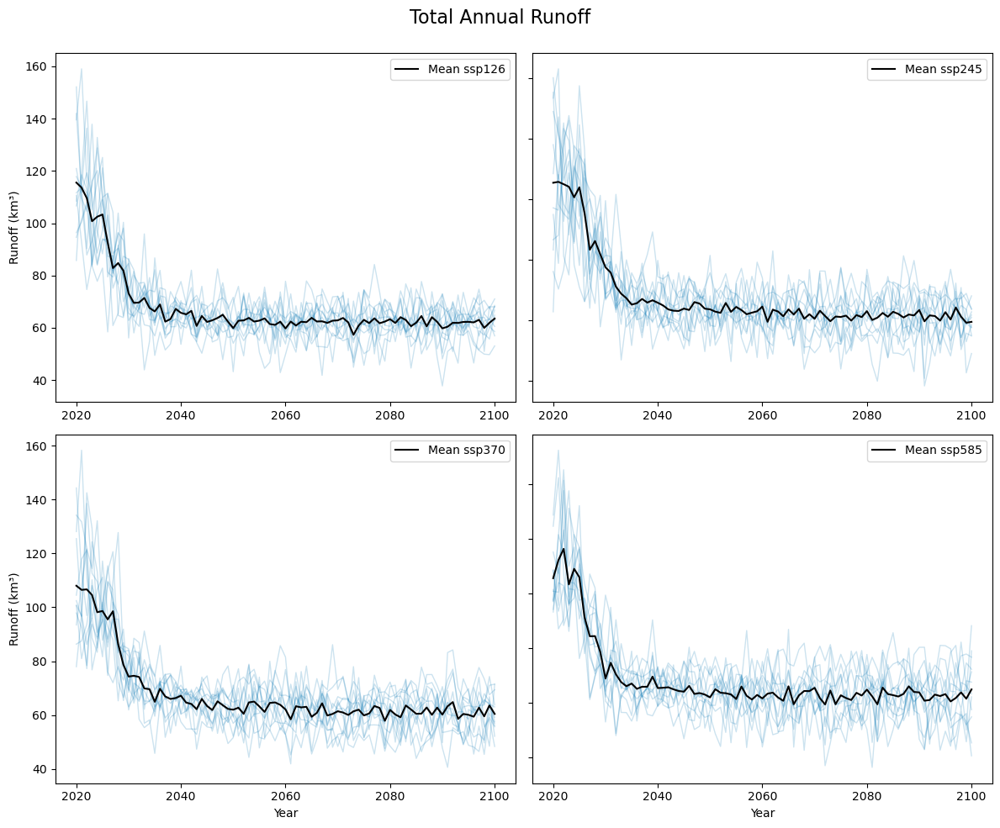

In [12]:
# Function to plot total annual runoff
def plot_total_annual_runoff(total_annual_runoff_dict, ssps, window=1):  # Control smoothing here
    light_blue = sns.color_palette("colorblind")[0]  # Choose a light blue color
    mean_color = 'black'

    plt.figure(figsize=(12, 10))  # Adjusting figure size to accommodate the 2x2 grid

    for idx, ssp in enumerate(ssps):
        ax = plt.subplot(2, 2, idx + 1)
        
        ssp_data = [runoff.sel(time=slice(None, '2101')) for scenario, runoff in total_annual_runoff_dict.items() if ssp in scenario]
        
        if ssp_data:
            smoothed_data = [runoff.rolling(time=window, center=True).mean() for runoff in ssp_data]

            for runoff in smoothed_data:
                runoff.plot(ax=ax, color=light_blue, alpha=0.2, linewidth=1)  # Plot individual GCMs in light blue
                
            combined_runoff = xr.concat(smoothed_data, dim='gcm').mean(dim='gcm')
            combined_runoff.plot(ax=ax, color=mean_color, linewidth=1.5, label=f'Mean {ssp}')  # Plot mean in black
            
        if idx % 2 == 0:
            ax.set_ylabel('Runoff (km³)')
        else:
            ax.set_yticklabels([])
        
        ax.legend()
        
        # Set x-axis ticks to show years in increments of 20
        years = ssp_data[0]['time'].values  # Assuming the time coordinate is consistent across datasets
        ax.set_xticks(np.arange(years[0], years[-1] + 1, 20))

        # Only set x-axis label for the bottom subplots
        if idx >= 2:
            ax.set_xlabel('Year')
        else:
            ax.set_xlabel('')  # Remove x-axis labels for top subplots

    plt.suptitle('Total Annual Runoff', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()

# Example usage
# Assuming total_annual_runoff_dict and ssp_list are already defined
plot_total_annual_runoff(total_annual_runoff_dict, ssp_list)


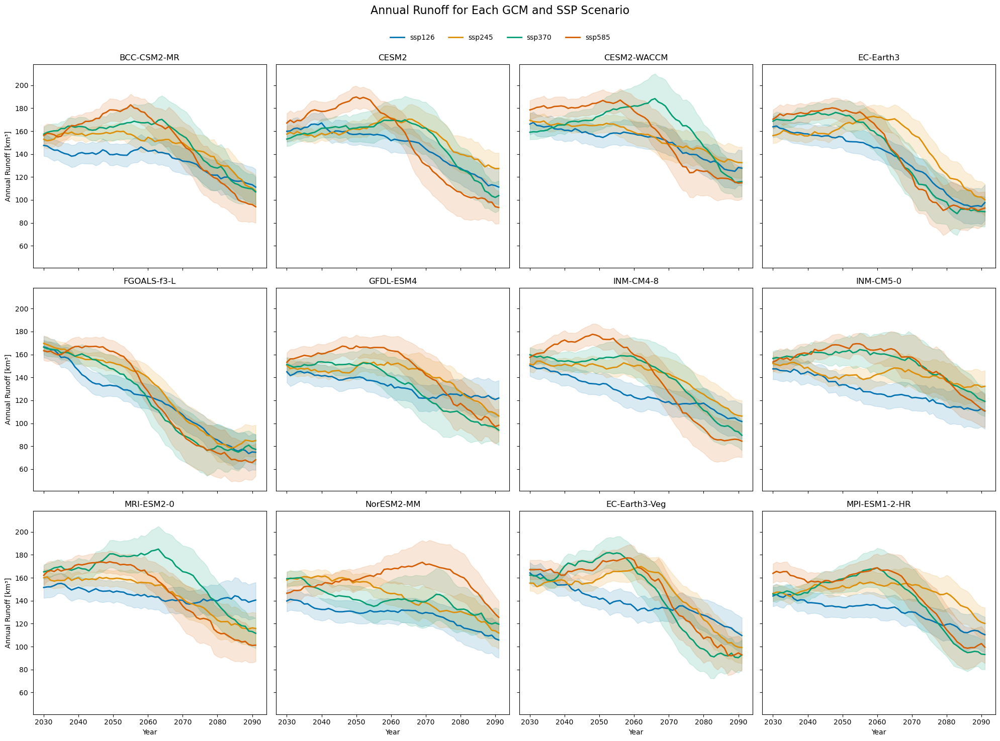

In [24]:
# Function to plot total annual runoff for each GCM and SSP scenario
def plot_total_annual_runoff_per_gcm(total_annual_runoff_dict, gcm_list, ssps, window=20):
    # Define color palette for SSPs
    ssp_colors = sns.color_palette("colorblind", len(ssps))
    ssp_color_dict = dict(zip(ssps, ssp_colors))

    # Create a 3x4 grid for plotting
    fig, axes = plt.subplots(3, 4, figsize=(20, 15), sharex=True, sharey=True)
    axes = axes.flatten()

    for idx, gcm in enumerate(gcm_list):
        ax = axes[idx]

        for ssp in ssps:
            gcm_key = f'{gcm}-{ssp}'
            if gcm_key in total_annual_runoff_dict:
                gcm_data = total_annual_runoff_dict[gcm_key].rolling(time=window, center=True).mean()
                years = gcm_data['time'].values
                runoff_values = gcm_data.values
                ax.plot(years, runoff_values, label=f'{ssp}', color=ssp_color_dict[ssp], linewidth=2)

                # Calculate and plot standard deviation as a shaded area
                ssp_data = [total_annual_runoff_dict[f'{gcm}-{ssp}'].rolling(time=window, center=True).mean() for gcm in gcm_list if f'{gcm}-{ssp}' in total_annual_runoff_dict]
                stacked_data = np.stack([data.values for data in ssp_data], axis=0)
                std_dev = np.std(stacked_data, axis=0)
                ax.fill_between(years, runoff_values - std_dev, runoff_values + std_dev, color=ssp_color_dict[ssp], alpha=0.15)

        # Set the title for the current subplot
        ax.set_title(gcm)
            
        # Set y-axis labels for the leftmost plots
        if idx % 4 == 0:
            ax.set_ylabel('Annual Runoff [km³]')
            
        # Set x-axis labels for the bottom plots
        if idx >= 8:
            ax.set_xlabel('Year')
                
        ax.grid(False)

    # Set legend and layout
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=len(ssps), bbox_to_anchor=(0.5, 0.95), frameon=False)
    plt.suptitle('Annual Runoff for Each GCM and SSP Scenario', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Example usage
plot_total_annual_runoff_per_gcm(total_annual_runoff_dict, gcm_list, ssp_list)


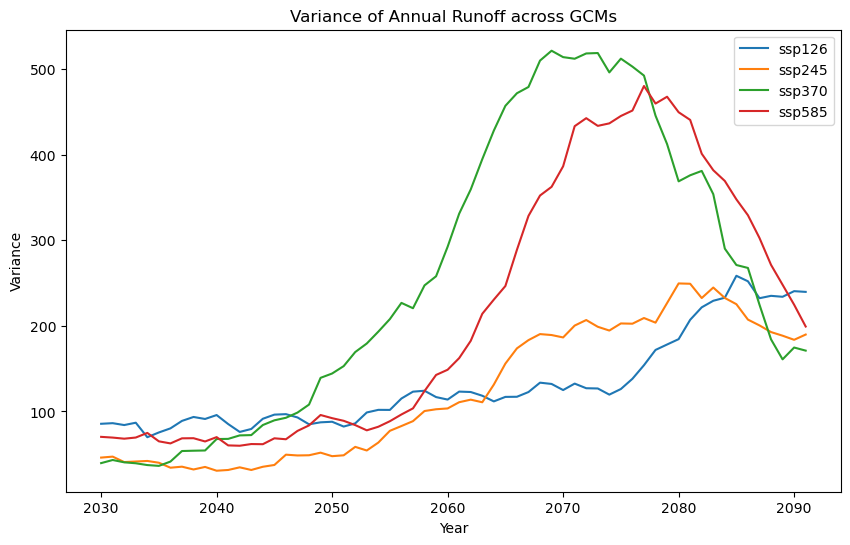

In [114]:
def calculate_variance(total_annual_runoff_dict, ssps, window=20): # smooth with window value
    variance_dict = {}

    for ssp in ssps:
        ssp_data = [runoff.sel(time=slice(None, '2101')) for scenario, runoff in total_annual_runoff_dict.items() if ssp in scenario]
        
        if ssp_data:
            smoothed_data = [runoff.rolling(time=window, center=True).mean() for runoff in ssp_data]
            variance = xr.concat(smoothed_data, dim='gcm').var(dim='gcm')
            variance_dict[ssp] = variance
    
    return variance_dict

# Example usage
variance_dict = calculate_variance(total_annual_runoff_dict, ssp_list)

# Example of extracting variance data for each SSP
ssp126_variance = variance_dict['ssp126']
ssp245_variance = variance_dict['ssp245']
ssp370_variance = variance_dict['ssp370']
ssp585_variance = variance_dict['ssp585']

# Time values (assuming time is a coordinate in the DataArray)
time_values = ssp126_variance['time'].values

# Plotting the variances
plt.figure(figsize=(10, 6))

plt.plot(time_values, ssp126_variance, label='ssp126')
plt.plot(time_values, ssp245_variance, label='ssp245')
plt.plot(time_values, ssp370_variance, label='ssp370')
plt.plot(time_values, ssp585_variance, label='ssp585')

plt.xlabel('Year')
plt.ylabel('Variance')
plt.title('Variance of Annual Runoff across GCMs')
plt.legend()
plt.grid(False)

plt.show()


## Plot annual runoff components

### ssp comparison (one plot for each component)

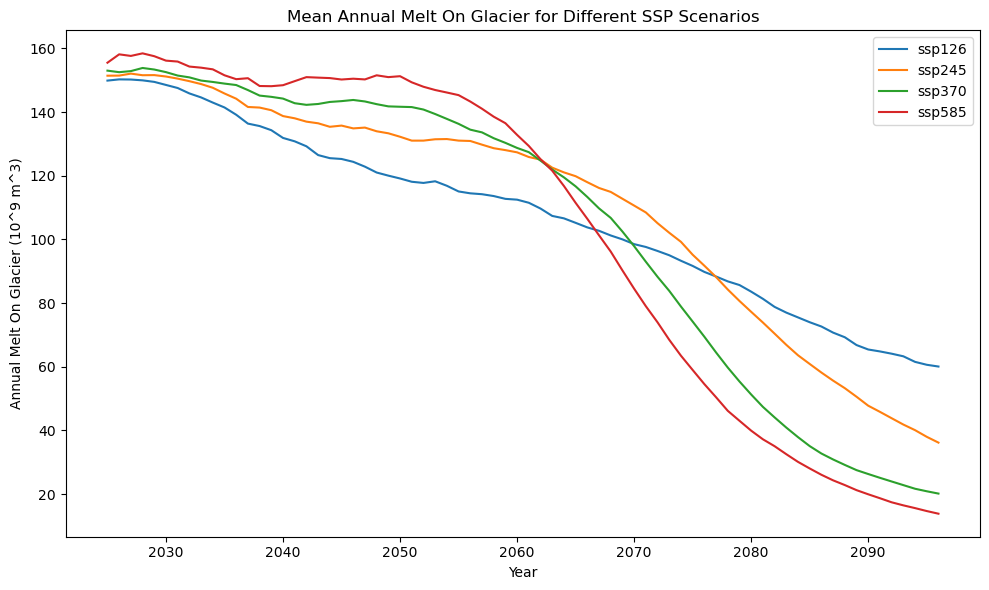

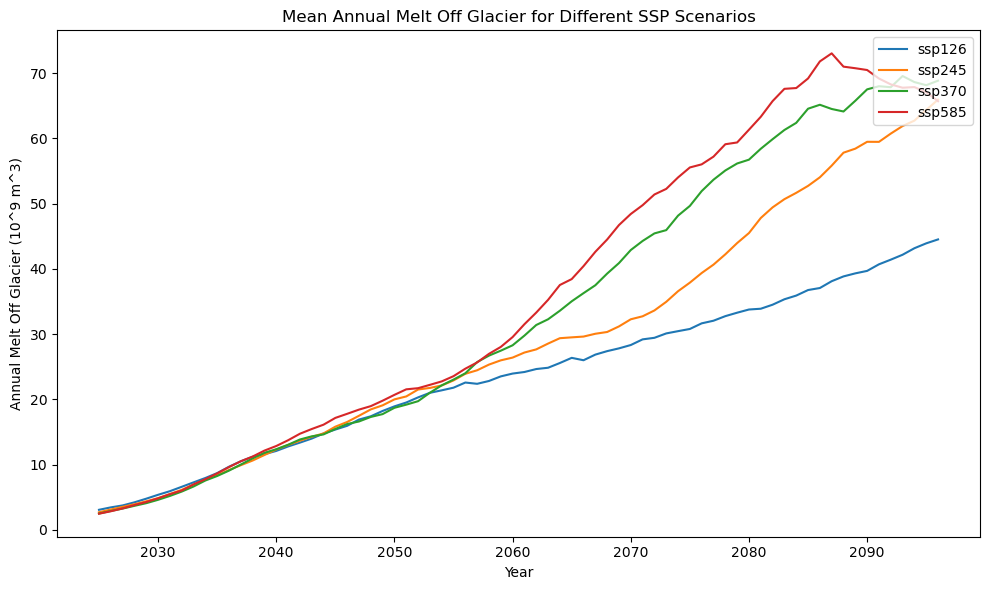

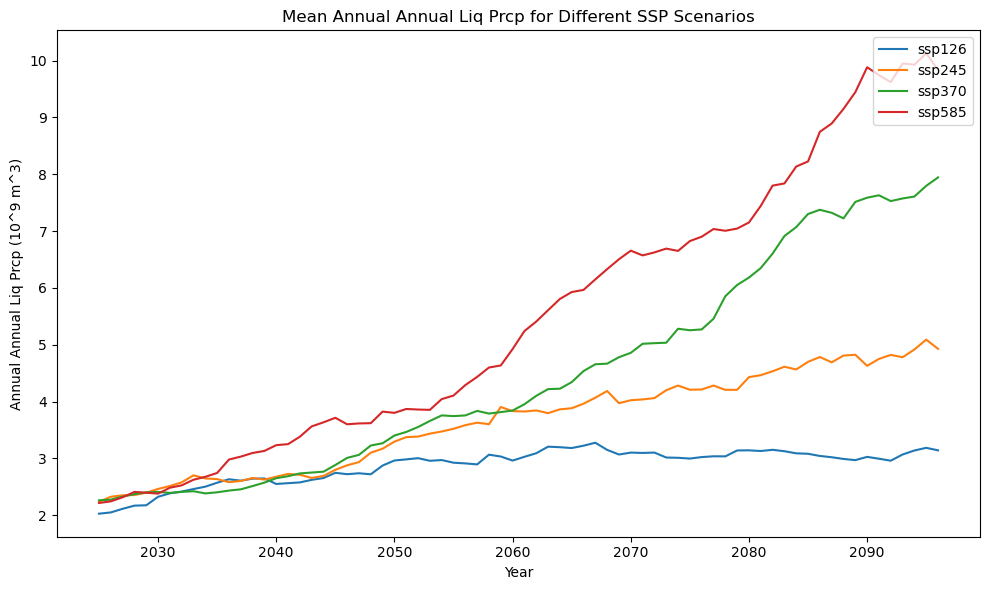

In [25]:
# Function to plot the mean annual runoff for each ssp scenario on one plot with smoothing
def plot_mean_annual_runoff(mean_annual_runoff, window=10): # smooth data
    components = list(mean_annual_runoff[next(iter(mean_annual_runoff))].keys())
    
    for component in components:
        plt.figure(figsize=(10, 6))

        for ssp, annual_runoff in mean_annual_runoff.items():
            # Apply rolling average
            smoothed_data = annual_runoff[component].rolling(time=window, center=True).mean()
            years = smoothed_data['time'].values
            runoff_values = smoothed_data.values
            plt.plot(years, runoff_values, label=f'{ssp}')
        
        plt.xlabel('Year')
        plt.ylabel(f'Annual {component.replace("_", " ").title()} (10^9 m^3)')
        plt.title(f'Mean Annual {component.replace("_", " ").title()} for Different SSP Scenarios')
        plt.legend(loc='upper right')
        plt.grid(False)
        plt.tight_layout()
        plt.show()import matplotlib.pyplot as plt
import xarray as xr
import seaborn as sns

# Function to calculate the mean annual runoff for each SSP scenario
def calculate_mean_annual_runoff(annual_runoff_dict, ssps):
    mean_annual_runoff = {}
    for ssp in ssps:
        ssp_data = {gcm: annual_runoff_dict[gcm] for gcm in annual_runoff_dict if ssp in gcm}
        if ssp_data:
            combined_runoff = {component: xr.concat([runoff[component].sel(time=slice('2020', '2100')) for runoff in ssp_data.values()], dim='gcm').mean(dim='gcm') for component in ssp_data[next(iter(ssp_data))].keys()}
            mean_annual_runoff[ssp] = combined_runoff
    return mean_annual_runoff

# Function to plot total annual runoff and melt on glacier
def plot_total_runoff_and_melt(mean_annual_runoff, window=10):
    plt.figure(figsize=(14, 7))
    
    # Define color palette for SSPs
    ssp_colors = sns.color_palette("colorblind", len(mean_annual_runoff))
    ssp_color_dict = dict(zip(mean_annual_runoff.keys(), ssp_colors))
    
    for ssp, annual_runoff in mean_annual_runoff.items():
        # Apply rolling average for total runoff
        total_runoff_smooth = annual_runoff['total_runoff'].rolling(time=window, center=True).mean()
        # Apply rolling average for melt on glacier
        melt_on_glacier_smooth = annual_runoff['melt_on_glacier'].rolling(time=window, center=True).mean()
        
        # Plot total runoff
        plt.plot(total_runoff_smooth['time'], total_runoff_smooth, label=f'{ssp} Total Runoff', color=ssp_color_dict[ssp])
        # Plot melt on glacier with dashed lines
        plt.plot(melt_on_glacier_smooth['time'], melt_on_glacier_smooth, label=f'{ssp} Melt on Glacier', linestyle='--', color=ssp_color_dict[ssp])
    
    plt.title('Total Annual Runoff and Melt on Glacier for Different SSP Scenarios')
    plt.xlabel('Year')
    plt.ylabel('Runoff (10^9 m³)')
    plt.legend()
    plt.grid(False)
    plt.tight_layout()
    plt.show()

# Example usage with dummy data structure
# Assuming annual_runoff_dict has been defined previously and contains the necessary data
annual_runoff_dict = {
    'ssp126_gcm1': {'total_runoff': xr.DataArray(...), 'melt_on_glacier': xr.DataArray(...)},
    'ssp245_gcm2': {'total_runoff': xr.DataArray(...), 'melt_on_glacier': xr.DataArray(...)},
    # Add other SSPs and GCMs data here
}

# List of SSP scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Calculate the mean annual runoff for each SSP scenario
mean_annual_runoff = calculate_mean_annual_runoff(annual_runoff_dict, ssps)

# Plot total runoff and melt on glacier
plot_total_runoff_and_melt(mean_annual_runoff)


# List of ssp scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Calculate the mean annual runoff for each ssp scenario
mean_annual_runoff = calculate_mean_annual_runoff(annual_runoff_dict, ssps)

# Call the plotting function
plot_mean_annual_runoff(mean_annual_runoff)

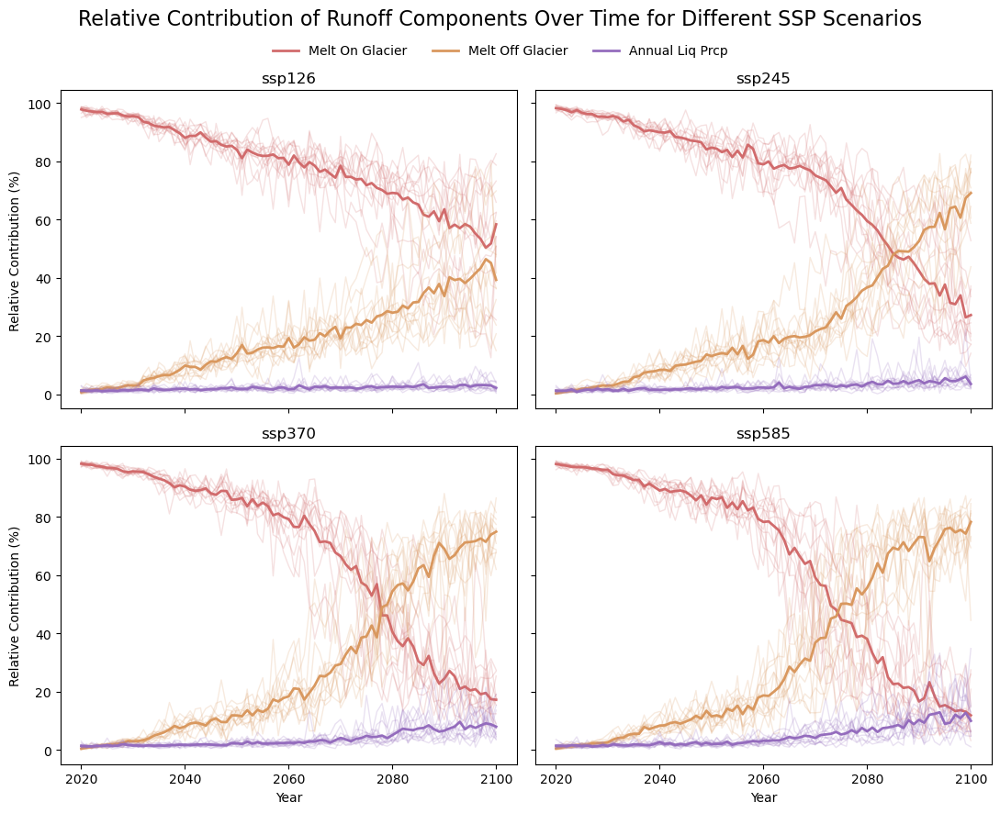

In [116]:
# Function to plot the relative contribution of each runoff component over time
def plot_relative_contribution(mean_annual_runoff, individual_gcm_runoff, gcm_list):
    fig, axs = plt.subplots(2, 2, figsize=(11, 9), sharex=True, sharey=True)
    axs = axs.flatten()  # Flatten the 2x2 array of axes for easier indexing

    colors = ['#d16b6c', '#d9985f', '#946cbd']  # Define colors for the components

    for idx, (ssp, annual_runoff) in enumerate(mean_annual_runoff.items()):
        total_runoff = sum(annual_runoff[component].rolling(time=1, center=True).mean() for component in annual_runoff)
        
        for component, data in annual_runoff.items():
            years = data['time'].values
            runoff_values = data.rolling(time=1, center=True).mean().values  # set rolling avg
            relative_contribution = (runoff_values / total_runoff.values) * 100
            
            color = colors.pop(0)  # Get the color for the component
            colors.append(color)  # Rotate the color list

            # Plot individual GCMs relative contribution
            for gcm in gcm_list:
                if f'{gcm}-{ssp}' in individual_gcm_runoff:
                    gcm_data = individual_gcm_runoff[f'{gcm}-{ssp}'][component].rolling(time=1, center=True).mean()
                    total_gcm_runoff = sum(individual_gcm_runoff[f'{gcm}-{ssp}'][comp].rolling(time=1, center=True).mean() for comp in annual_runoff)
                    relative_gcm_contribution = (gcm_data.values / total_gcm_runoff.values) * 100
                    axs[idx].plot(years, relative_gcm_contribution, color=color, linestyle='-', alpha=0.2, linewidth=1)

            # Plot mean relative contribution
            axs[idx].plot(years, relative_contribution, color=color, label=f'{component.replace("_", " ").title()}', linewidth=2)

        axs[idx].set_title(f'{ssp}')
        axs[0].set_xticks(np.arange(years[0], years[-1] + 1, 20))  # Set x ticks to increments of 20 years
        axs[1].set_xticks(np.arange(years[0], years[-1] + 1, 20))
        axs[2].set_xticks(np.arange(years[0], years[-1] + 1, 20))
        axs[3].set_xticks(np.arange(years[0], years[-1] + 1, 20))
        axs[idx].tick_params(axis='x') 
        if idx % 2 == 0:  # Only set y labels for the leftmost plots
            axs[idx].set_ylabel('Relative Contribution (%)')
        axs[idx].grid(False)
    
    # Add x label ('Year') beneath the bottom two plots
    for idx in [2, 3]:
        axs[idx].set_xlabel('Year')
        
    # Create a horizontal legend beneath the title
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.95), ncol=len(handles), frameon=False)
    
    # Adjust layout
    plt.tight_layout(rect=[0, 0, 1, 0.92])  # Adjust rect to make space for the suptitle and legend
    plt.suptitle('Relative Contribution of Runoff Components Over Time for Different SSP Scenarios', fontsize=16)
    plt.show()

# Assuming mean_annual_runoff, annual_runoff_dict, and gcm_list are already defined
plot_relative_contribution(mean_annual_runoff, annual_runoff_dict, gcm_list)


### Relative contribution of each component (areas)

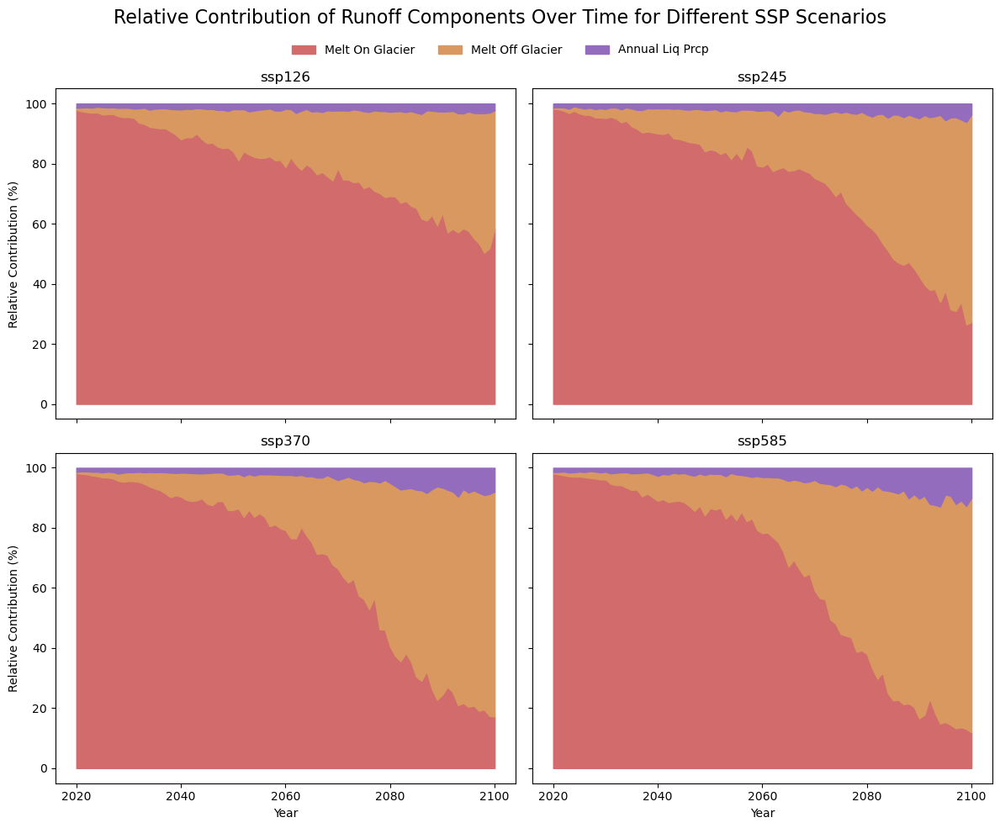

In [117]:
# Define the color scheme
colors = ['#d16b6c', '#d9985f', '#946cbd']

# Function to plot the relative contribution of each runoff component over time as filled areas
def plot_relative_contribution_filled(mean_annual_runoff):
    fig, axs = plt.subplots(2, 2, figsize=(12, 10), sharex=True, sharey=True)
    axs = axs.flatten()  # Flatten the 2x2 array of axes for easier indexing

    for idx, (ssp, annual_runoff) in enumerate(mean_annual_runoff.items()):
        total_runoff = sum(annual_runoff[component] for component in annual_runoff)
        
        # Initialize arrays to store lower bounds of filled areas
        lower_bounds = np.zeros_like(total_runoff.values)

        for color, (component, data) in zip(colors, annual_runoff.items()):
            years = data['time'].values
            runoff_values = data.rolling(time=1, center=True).mean().values  # Smooth
            # Calculate the relative contribution as a percentage
            relative_contribution = (runoff_values / total_runoff.rolling(time=1, center=True).mean().values) * 100
            # Plot filled area
            axs[idx].fill_between(years, lower_bounds, lower_bounds + relative_contribution, label=f'{component.replace("_", " ").title()}', color=color)
            # Update lower bounds for next component
            lower_bounds += relative_contribution

        axs[idx].set_title(f'{ssp}')
        axs[idx].set_xticks(np.arange(years[0], years[-1] + 1, 20))  # Set x ticks to increments of 20 years
        if idx % 2 == 0:  # Only set y labels for the leftmost plots
            axs[idx].set_ylabel('Relative Contribution (%)')
        axs[idx].grid(False)

    # Add x label ('Year') beneath the bottom two plots
    for idx in [2, 3]:
        axs[idx].set_xlabel('Year')
    
    # Create a horizontal legend beneath the title
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.95), ncol=len(handles), frameon=False)
    
    # Adjust layout
    plt.tight_layout(rect=[0, 0, 1, 0.92])  # Adjust rect to make space for the suptitle and legend
    plt.suptitle('Relative Contribution of Runoff Components Over Time for Different SSP Scenarios', fontsize=16)
    plt.show()

# Calculate the mean annual runoff for each ssp scenario
mean_annual_runoff = calculate_mean_annual_runoff(annual_runoff_dict, ssps)

# Call the plotting function
plot_relative_contribution_filled(mean_annual_runoff)


## Liquid precip (I probably don't need this anymore)

IndexError: index 10 is out of bounds for axis 0 with size 10

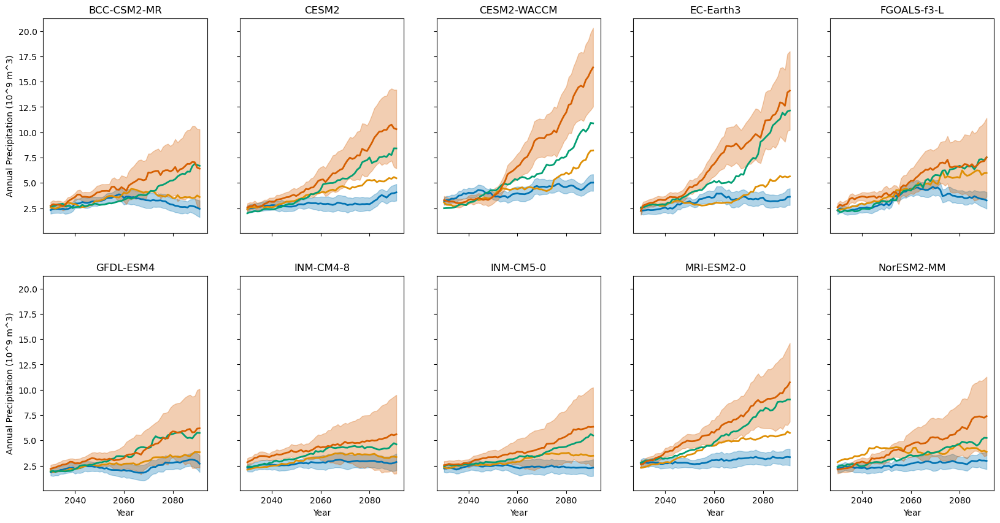

In [118]:
# Function to plot annual precipitation for each GCM and SSP scenario with smoothing and standard deviation
def plot_annual_precipitation_per_gcm(annual_runoff_dict, gcm_list, ssps, window=20):
    component = 'annual_liq_prcp'  # Only plot precipitation
    
    # Define color palette for SSPs
    ssp_colors = sns.color_palette("colorblind", len(ssps))
    ssp_color_dict = dict(zip(ssps, ssp_colors))

    # Create a 2x5 grid for plotting
    fig, axes = plt.subplots(2, 5, figsize=(20, 10), sharex=True, sharey=True)
    axes = axes.flatten()

    for idx, gcm in enumerate(gcm_list):
        ax = axes[idx]

        for ssp in ssps:
            gcm_key = f'{gcm}-{ssp}'
            if gcm_key in annual_runoff_dict:
                gcm_data = annual_runoff_dict[gcm_key][component].rolling(time=window, center=True).mean()
                years = gcm_data['time'].values
                runoff_values = gcm_data.values
                ax.plot(years, runoff_values, label=f'{ssp}', color=ssp_color_dict[ssp], linewidth=2)

                # Calculate and plot standard deviation as a shaded area
                if ssp in ['ssp126', 'ssp585']:
                    ssp_data = [annual_runoff_dict[f'{gcm}-{ssp}'][component].rolling(time=window, center=True).mean() for gcm in gcm_list if f'{gcm}-{ssp}' in annual_runoff_dict]
                    stacked_data = np.stack([data.values for data in ssp_data], axis=0)
                    std_dev = np.std(stacked_data, axis=0)
                    ax.fill_between(years, runoff_values - std_dev, runoff_values + std_dev, color=ssp_color_dict[ssp], alpha=0.3)

        ax.set_title(gcm)
        if idx % 5 == 0:
            ax.set_ylabel('Annual Precipitation (10^9 m^3)')
        if idx >= 5:
            ax.set_xlabel('Year')
        ax.grid(False)

    # Set legend and layout
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=len(ssps))
    plt.suptitle('Annual Precipitation for Each GCM and SSP Scenario', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# List of SSP scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Calculate the mean annual runoff for each SSP scenario
mean_annual_runoff = calculate_mean_annual_runoff(annual_runoff_dict, ssps)

# Call the plotting function
plot_annual_precipitation_per_gcm(annual_runoff_dict, gcm_list, ssps)



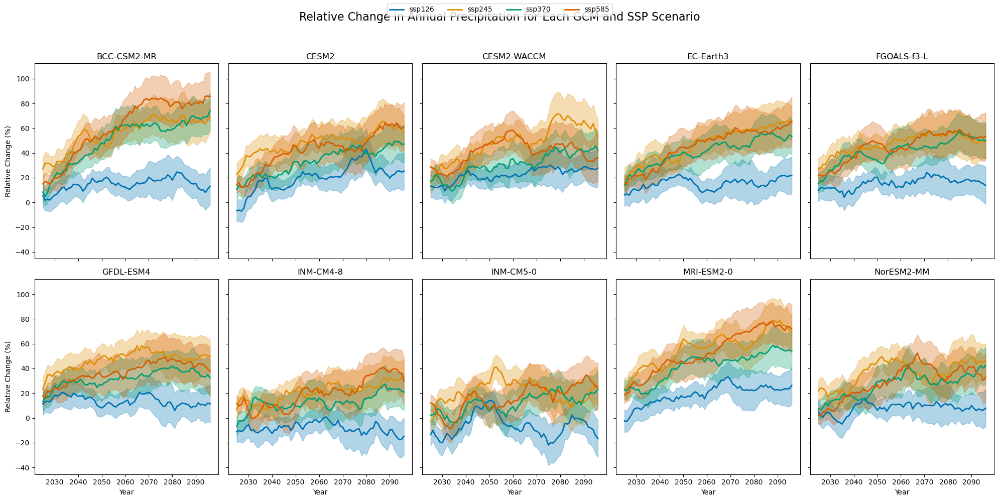

In [58]:
# Function to calculate the relative change in precipitation
def calculate_relative_change(annual_runoff_dict, ssps, component):
    relative_change_dict = {}
    
    for ssp in ssps:
        ssp_data = [annual_runoff_dict[f'{gcm}-{ssp}'] for gcm in gcm_list if f'{gcm}-{ssp}' in annual_runoff_dict]
        
        if ssp_data:
            initial_values = np.array([data[component].isel(time=0).values for data in ssp_data])
            initial_mean = np.mean(initial_values)
            
            relative_changes = {
                gcm: ((data[component] - initial_mean) / initial_mean * 100).rolling(time=10, center=True).mean()
                for gcm, data in zip(gcm_list, ssp_data)
            }
            relative_change_dict[ssp] = relative_changes

    return relative_change_dict

# Function to plot the relative change in precipitation for each GCM
def plot_relative_precipitation(relative_change_dict, ssps, component):
    # Define color palette for SSPs
    ssp_colors = sns.color_palette("colorblind", len(ssps))
    ssp_color_dict = dict(zip(ssps, ssp_colors))

    # Create a 2x5 grid for plotting
    fig, axes = plt.subplots(2, 5, figsize=(20, 10), sharex=True, sharey=True)
    axes = axes.flatten()

    for idx, gcm in enumerate(gcm_list):
        ax = axes[idx]

        for ssp in ssps:
            if ssp in relative_change_dict and gcm in relative_change_dict[ssp]:
                gcm_data = relative_change_dict[ssp][gcm]
                years = gcm_data['time'].values
                relative_values = gcm_data.values
                ax.plot(years, relative_values, label=f'{ssp}', color=ssp_color_dict[ssp], linewidth=2)

                # Calculate and plot standard deviation as a shaded area
                ssp_data = [relative_change_dict[ssp][gcm] for gcm in gcm_list if gcm in relative_change_dict[ssp]]
                stacked_data = np.stack([data.values for data in ssp_data], axis=0)
                std_dev = np.std(stacked_data, axis=0)
                ax.fill_between(years, relative_values - std_dev, relative_values + std_dev, color=ssp_color_dict[ssp], alpha=0.3)

        ax.set_title(gcm)
        if idx % 5 == 0:
            ax.set_ylabel('Relative Change (%)')
        if idx >= 5:
            ax.set_xlabel('Year')
        ax.grid(False)

    # Set legend and layout
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=len(ssps))
    plt.suptitle('Relative Change in Annual Precipitation for Each GCM and SSP Scenario', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# List of SSP scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Calculate the relative change in annual precipitation for each SSP scenario
relative_change_dict = calculate_relative_change(annual_runoff_dict, ssps, 'annual_liq_prcp')

# Call the plotting function
plot_relative_precipitation(relative_change_dict, ssps, 'annual_liq_prcp')


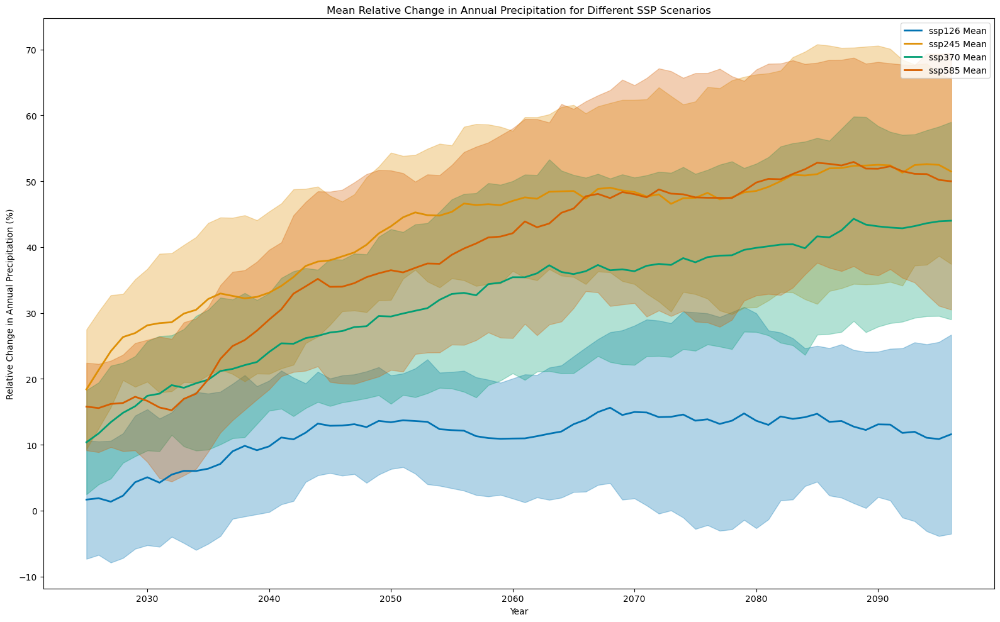

In [59]:
# Function to calculate the mean relative change in precipitation
def calculate_mean_relative_change(annual_runoff_dict, ssps, component):
    mean_relative_change_dict = {}
    
    for ssp in ssps:
        ssp_data = [annual_runoff_dict[f'{gcm}-{ssp}'] for gcm in gcm_list if f'{gcm}-{ssp}' in annual_runoff_dict]
        
        if ssp_data:
            initial_values = np.array([data[component].isel(time=0).values for data in ssp_data])
            initial_mean = np.mean(initial_values)
            
            relative_changes = np.array([
                ((data[component] - initial_mean) / initial_mean * 100).rolling(time=10, center=True).mean().values
                for data in ssp_data
            ])
            
            mean_relative_change = np.mean(relative_changes, axis=0)
            std_dev_relative_change = np.std(relative_changes, axis=0)
            years = ssp_data[0][component]['time'].values
            
            mean_relative_change_dict[ssp] = {
                'years': years,
                'mean': mean_relative_change,
                'std_dev': std_dev_relative_change
            }

    return mean_relative_change_dict

# Function to plot the mean relative change in precipitation
def plot_mean_relative_precipitation(mean_relative_change_dict, ssps):
    # Define color palette for SSPs
    ssp_colors = sns.color_palette("colorblind", len(ssps))
    ssp_color_dict = dict(zip(ssps, ssp_colors))

    plt.figure(figsize=(16, 10))

    for ssp in ssps:
        if ssp in mean_relative_change_dict:
            years = mean_relative_change_dict[ssp]['years']
            mean_relative_values = mean_relative_change_dict[ssp]['mean']
            std_dev = mean_relative_change_dict[ssp]['std_dev']
            
            plt.plot(years, mean_relative_values, label=f'{ssp} Mean', color=ssp_color_dict[ssp], linewidth=2)
            plt.fill_between(years, mean_relative_values - std_dev, mean_relative_values + std_dev, color=ssp_color_dict[ssp], alpha=0.3)

    plt.xlabel('Year')
    plt.ylabel('Relative Change in Annual Precipitation (%)')
    plt.title('Mean Relative Change in Annual Precipitation for Different SSP Scenarios')
    plt.legend(loc='upper right')
    plt.grid(False)
    plt.tight_layout()
    plt.show()

# List of SSP scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Calculate the mean relative change in annual precipitation for each SSP scenario
mean_relative_change_dict = calculate_mean_relative_change(annual_runoff_dict, ssps, 'annual_liq_prcp')

# Call the plotting function
plot_mean_relative_precipitation(mean_relative_change_dict, ssps)


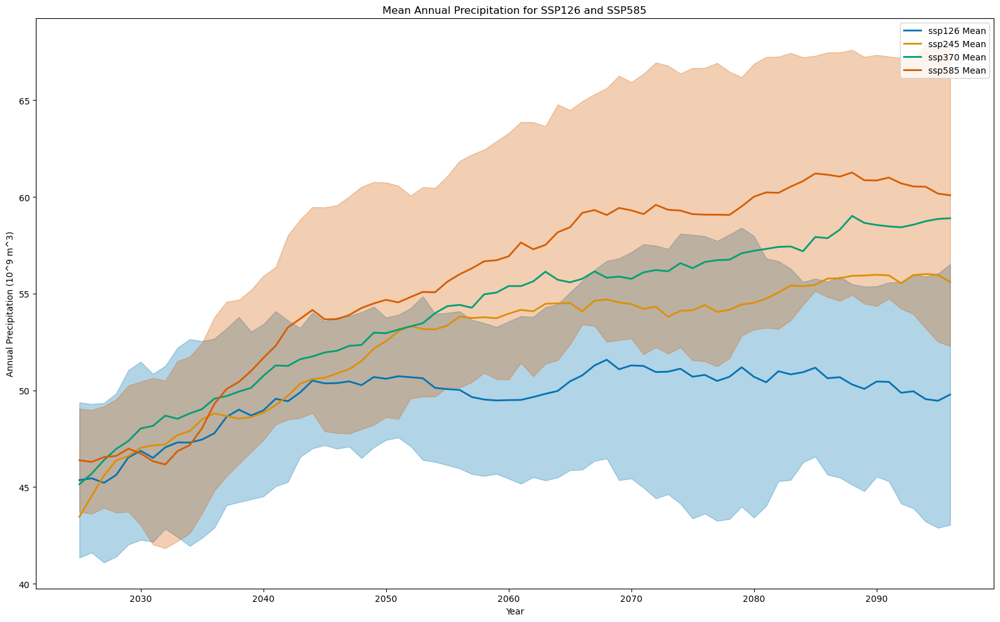

In [60]:
# Function to plot the mean annual precipitation for each SSP scenario on one plot with smoothing
def plot_mean_annual_precipitation(mean_annual_runoff, annual_runoff_dict, window=10): 
    component = 'annual_liq_prcp'  # Only plot precipitation
    
    # Define color palette for SSPs
    ssp_colors = sns.color_palette("colorblind", len(mean_annual_runoff))
    ssp_color_dict = dict(zip(mean_annual_runoff.keys(), ssp_colors))

    plt.figure(figsize=(16, 10))

    for ssp, annual_runoff in mean_annual_runoff.items():
        # Apply rolling average
        smoothed_data = annual_runoff[component].rolling(time=window, center=True).mean()
        years = smoothed_data['time'].values
        runoff_values = smoothed_data.values
        plt.plot(years, runoff_values, label=f'{ssp} Mean', color=ssp_color_dict[ssp], linewidth=2)

        # Plot standard deviation as a shaded area for SSP126 and SSP585
        if ssp in ['ssp126', 'ssp585']:
            ssp_data = [annual_runoff_dict[f'{gcm}-{ssp}'][component].rolling(time=window, center=True).mean() for gcm in gcm_list]
            stacked_data = np.stack([data.values for data in ssp_data], axis=0)
            std_dev = np.std(stacked_data, axis=0)
            plt.fill_between(years, runoff_values - std_dev, runoff_values + std_dev, color=ssp_color_dict[ssp], alpha=0.3)

    plt.xlabel('Year')
    plt.ylabel('Annual Precipitation (10^9 m^3)')
    plt.title('Mean Annual Precipitation for SSP126 and SSP585')
    plt.legend(loc='upper right')
    plt.grid(False)
    plt.tight_layout()
    plt.show()

# List of SSP scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Calculate the mean annual runoff for each SSP scenario
mean_annual_runoff = calculate_mean_annual_runoff(annual_runoff_dict, ssps)

# Call the plotting function
plot_mean_annual_precipitation(mean_annual_runoff, annual_runoff_dict)


In [ ]:
# # this makes the same plot as above but for all runoff components
# # Function to plot the mean annual runoff for each ssp scenario on one plot with smoothing
# def plot_mean_annual_runoff(mean_annual_runoff, annual_runoff_dict, window=10): 
#     components = list(mean_annual_runoff[next(iter(mean_annual_runoff))].keys())
    
#     # Define color palette for SSPs
#     ssp_colors = sns.color_palette("colorblind", len(mean_annual_runoff))
#     ssp_color_dict = dict(zip(mean_annual_runoff.keys(), ssp_colors))

#     for component in components:
#         plt.figure(figsize=(10, 6))

#         for ssp, annual_runoff in mean_annual_runoff.items():
#             # Apply rolling average
#             smoothed_data = annual_runoff[component].rolling(time=window, center=True).mean()
#             years = smoothed_data['time'].values
#             runoff_values = smoothed_data.values
#             plt.plot(years, runoff_values, label=f'{ssp} Mean', color=ssp_color_dict[ssp], linewidth=2)
        
#             # Plot standard deviation as a shaded area for SSP126 and SSP585
#             if ssp in ['ssp126', 'ssp585']:
#                 ssp_data = [annual_runoff_dict[f'{gcm}-{ssp}'][component].rolling(time=window, center=True).mean() for gcm in gcm_list]
#                 stacked_data = np.stack([data.values for data in ssp_data], axis=0)
#                 std_dev = np.std(stacked_data, axis=0)
#                 plt.fill_between(years, runoff_values - std_dev, runoff_values + std_dev, color=ssp_color_dict[ssp], alpha=0.3)

#         plt.xlabel('Year')
#         plt.ylabel(f'Annual {component.replace("_", " ").title()} (10^9 m^3)')
#         plt.title(f'Mean Annual {component.replace("_", " ").title()} for Different SSP Scenarios')
#         plt.legend(loc='upper right')
#         plt.grid(False)
#         plt.tight_layout()
#         plt.show()

# # List of ssp scenarios
# ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# # Calculate the mean annual runoff for each ssp scenario
# mean_annual_runoff = calculate_mean_annual_runoff(annual_runoff_dict, ssps)

# # Call the plotting function
# plot_mean_annual_runoff(mean_annual_runoff, annual_runoff_dict)

# 3. Glacier volume

In [34]:
# Dictionary to store volume data for each GCM and SSP scenario
volume_data_dict = {}

for date in date_list:
    for gcm in gcm_list:
        for ssp in ssp_list:
            filepath = f"{base}{date}-gcm_data_{gcm}_{ssp}_compiled_output.nc"
            if os.path.exists(filepath):
                try:
                    dataset = xr.open_dataset(filepath)
                    k = f"{gcm}-{ssp}"
                    volume_data_dict[k] = dataset['volume']
                    #print(f"Loaded volume data for: {gcm} - {ssp}")
                except Exception as e:
                    pass
            else:
                pass

In [35]:
# Calculate the mean volume over the GCMs for each SSP
def calculate_mean_volume(volume_data_dict, ssps):
    mean_volume = {}
    for ssp in ssps:
        ssp_data = [volume for key, volume in volume_data_dict.items() if ssp in key]
        if ssp_data:
            combined_volume = xr.concat(ssp_data, dim='gcm').mean(dim='gcm')
            mean_volume[ssp] = combined_volume
    return mean_volume

mean_volume = calculate_mean_volume(volume_data_dict, ssp_list)

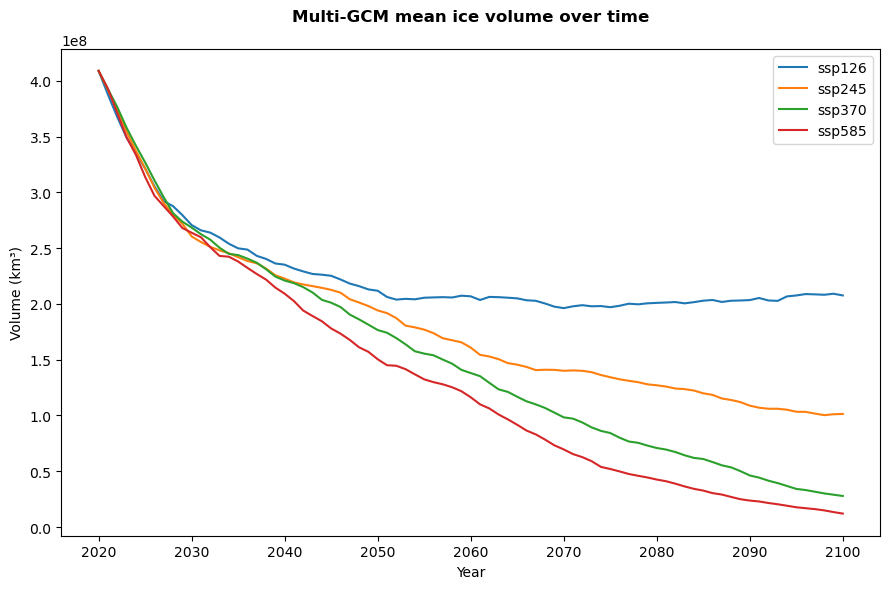

In [36]:
# Plotting the mean volume over time for each SSP
plt.figure(figsize=(9, 6))

for ssp, volume in mean_volume.items():
    years = volume['time'].values
    mean_values = volume.sum(dim='rgi_id').values  # Summing over 'rgi_id' to get total volume
    
    # Slice the data to stop at 2100
    mask = years <= 2100
    years = years[mask]
    mean_values = mean_values[mask]
    
    plt.plot(years, mean_values, label=f'{ssp}', linewidth=1.5)

plt.title('Multi-GCM mean ice volume over time', pad=20, fontweight='bold')  # Adjust title position with 'pad'
plt.xlabel('Year')
plt.ylabel('Volume (km³)')
plt.legend()
plt.tight_layout()
plt.show()


In [16]:
# # This code calculates pct change as well as initial value, probably not worth keeping
# import numpy as np

# # Calculate percentage change in volume for each SSP scenario
# def calculate_pct_change_in_volume(mean_volume):
#     pct_changes = {}
    
#     # Print the initial volume value from one of the SSP scenarios
#     initial_volume = next(iter(mean_volume.values())).isel(time=0).sum(dim='rgi_id').values  # First data point of the first SSP
#     print(f"Initial volume: {initial_volume:.2e} km³")
    
#     # Calculate percentage change for each SSP scenario
#     for ssp, volume in mean_volume.items():
#         initial_value = volume.isel(time=0).sum(dim='rgi_id').values  # First data point
#         final_value = volume.isel(time=-1).sum(dim='rgi_id').values  # Last data point
        
#         if initial_value == 0:
#             pct_change = np.nan
#         else:
#             pct_change = ((final_value - initial_value) / initial_value) * 100
        
#         pct_changes[ssp] = pct_change
    
#     return pct_changes

# # Example usage assuming mean_volume is defined correctly
# mean_volume = {
#     "ssp126": volume_data_dict['BCC-CSM2-MR-ssp126'],
#     "ssp245": volume_data_dict['BCC-CSM2-MR-ssp245'],
#     "ssp370": volume_data_dict['BCC-CSM2-MR-ssp370'],
#     "ssp585": volume_data_dict['BCC-CSM2-MR-ssp585']
# }

# # Calculate percentage changes
# pct_changes = calculate_pct_change_in_volume(mean_volume)

# # Print percentage changes for each SSP scenario
# print("Percentage change in volume for each SSP scenario:")
# for ssp, pct_change in pct_changes.items():
#     print(f"{ssp}: {pct_change:.2e}%")

In [17]:
# Calculate percentage change in volume for each SSP scenario
def calculate_pct_change_in_volume(mean_volume):
    pct_changes = {}
    for ssp, volume in mean_volume.items():
        initial_value = volume.isel(time=0).sum(dim='rgi_id').values  # First data point
        final_value = volume.isel(time=-1).sum(dim='rgi_id').values  # Last data point
        
        if initial_value == 0:
            pct_change = np.nan
        else:
            pct_change = ((final_value - initial_value) / initial_value) * 100
        
        pct_changes[ssp] = pct_change
    
    return pct_changes

# Example usage assuming mean_volume is defined
mean_volume = {
    "ssp126": volume_data_dict['BCC-CSM2-MR-ssp126'],
    "ssp245": volume_data_dict['BCC-CSM2-MR-ssp245'],
    "ssp370": volume_data_dict['BCC-CSM2-MR-ssp370'],
    "ssp585": volume_data_dict['BCC-CSM2-MR-ssp585']
}

pct_changes = calculate_pct_change_in_volume(mean_volume)
print("Percentage change in volume for each SSP scenario:")
for ssp, pct_change in pct_changes.items():
    print(f"{ssp}: {pct_change:.2f}%")

Percentage change in volume for each SSP scenario:
ssp126: -90.06%
ssp245: -97.07%
ssp370: -99.44%
ssp585: -99.78%


Summary for all cities:

La Paz:
    Percentage change in volume for each SSP scenario:
    ssp126: -90.06%
    ssp245: -97.07%
    ssp370: -99.44%
    ssp585: -99.78%

Quito region:
    Percentage change in volume for each SSP scenario:
    ssp126: -39.16%
    ssp245: -68.26%
    ssp370: -89.89%
    ssp585: -91.26%

Quito city:
    Percentage change in volume for each SSP scenario:
    ssp126: -44.56%
    ssp245: -73.76%
    ssp370: -97.05%
    ssp585: -99.03%

Santiago:
    Percentage change in volume for each SSP scenario:
    ssp126: -65.53%
    ssp245: -85.46%
    ssp370: -97.38%
    ssp585: -98.58%

Analysis: This is a stark contrast, and I wonder how much avg glacier size has to do with the results. I would guess that La Paz has the largest glaciers, Also, Quito probably has the most straigthforward climate change, being at the equator and having very little seasonal variation in temp or precip. Ideally, I could find a comprehensive relationship between temp, precip, and glacier change as predicted by individual GCMs, and then compare this to historical data.

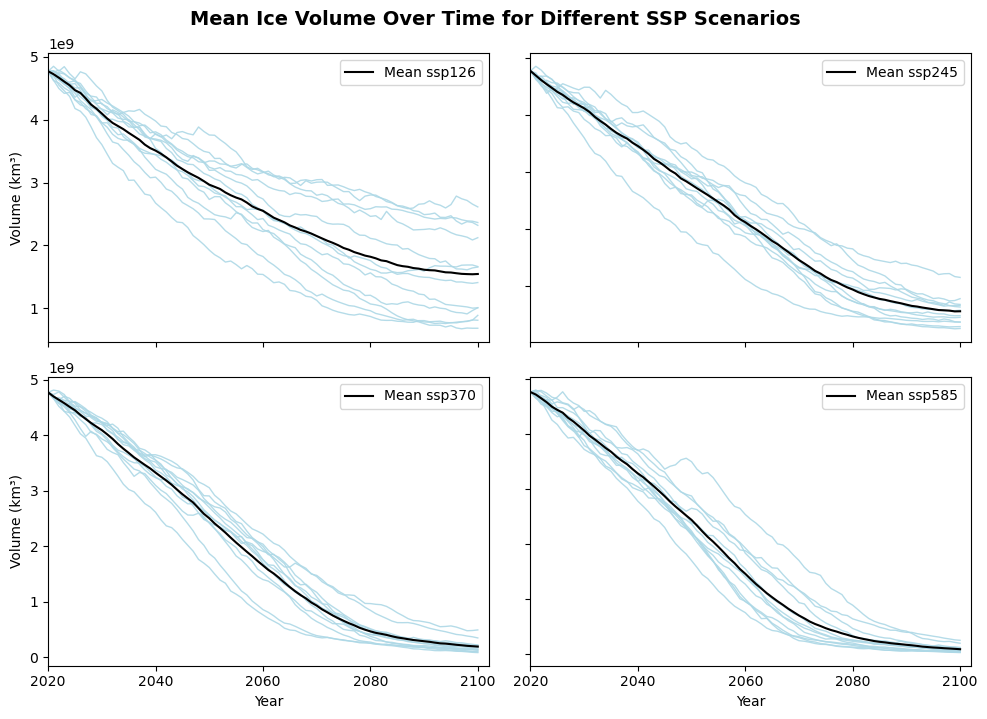

In [124]:
# Function to plot the mean volume over time for each SSP
def plot_mean_volume(mean_volume, ssps):
    plt.figure(figsize=(10, 7))  # Adjusting figure size to accommodate the 2x2 grid

    for idx, ssp in enumerate(ssps):
        ax = plt.subplot(2, 2, idx + 1)
        
        # Show y-axis offset text only for the left plots
        if idx % 2 == 0:
            ax.yaxis.get_offset_text().set_visible(True)
        else:
            ax.yaxis.get_offset_text().set_visible(False)
            ax.set_yticklabels([])  # Remove y-axis tick values

        # Remove x-axis tick values for the top plots
        if idx < 2:
            ax.set_xticklabels([])  # Remove x-axis tick values
    
        ssp_data = [volume.sel(time=slice(None, '2101')) for key, volume in mean_volume.items() if ssp in key]
            
        if ssp_data:
            for volume in ssp_data:
                years = volume['time'].values
                values = volume.sum(dim='rgi_id').values  # Summing over 'rgi_id' to get total volume
                ax.plot(years, values, color='lightblue', alpha=0.9, linewidth=1)  # Plot individual GCMs in light blue
                
            combined_volume = xr.concat(ssp_data, dim='gcm').mean(dim='gcm')
            mean_years = combined_volume['time'].values
            mean_values = combined_volume.sum(dim='rgi_id').values  # Summing over 'rgi_id' to get total volume
            ax.plot(mean_years, mean_values, color='black', linewidth=1.5, label=f'Mean {ssp}')  # Plot mean in black
            
        #ax.set_ylabel('Volume (km³)')
        ax.legend()
        ax.set_xticks(np.arange(years[0], 2101, 20)) 
        ax.set_xlim(years [0], 2102)

        if idx in [0, 2]:
            ax.set_ylabel('Volume (km³)')
        else: 
            ax.set_ylabel('')
        
        if idx >= 2:  # Bottom row subplots
            ax.set_xlabel('Year')
        else:
            ax.set_xlabel('')  # Remove x-axis label for top subplots

    plt.suptitle('Mean Ice Volume Over Time for Different SSP Scenarios', fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout(rect=[0, 0, 1, 1.05])  # Adjust layout to accommodate the suptitle
    plt.show()

# List of ssp scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Example usage assuming mean_volume and ssp_list are defined
plot_mean_volume(volume_data_dict, ssps)


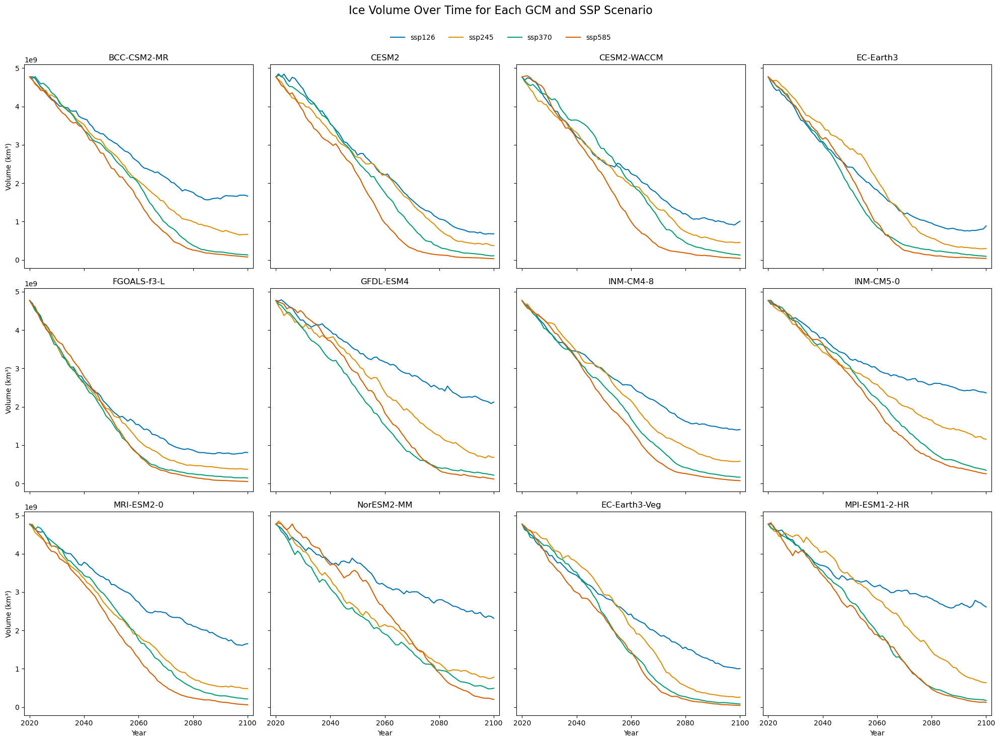

In [125]:
# Function to plot the volume over time for each GCM
def plot_volume_per_gcm(volume_data_dict, gcms, ssps):
    # Define color palette for SSPs
    ssp_colors = sns.color_palette("colorblind", len(ssps))
    ssp_color_dict = dict(zip(ssps, ssp_colors))

    # Create a 3x4 grid for plotting
    fig, axes = plt.subplots(3, 4, figsize=(20, 15), sharex=True, sharey=True)
    axes = axes.flatten()

    for idx, gcm in enumerate(gcms):
        ax = axes[idx]

        for ssp in ssps:
            key = f"{gcm}-{ssp}"
            if key in volume_data_dict:
                volume = volume_data_dict[key].sel(time=slice(None, '2101'))
                years = volume['time'].values
                values = volume.sum(dim='rgi_id').values  # Summing over 'rgi_id' to get total volume
                ax.plot(years, values, label=f'{ssp}', color=ssp_color_dict[ssp], linewidth=1.5)

        ax.set_title(gcm)
        #ax.set_ylabel('Volume (km³)')
        
        if idx % 4 == 0:
            ax.set_ylabel('Volume (km³)')
        if idx >= 8:
            ax.set_xlabel('Year')
        
        # Set x-axis limits with a buffer
        ax.set_xlim(years[0] - 2, years[-1] + 2)
        ax.set_xticks(np.arange(years[0], 2101, 20))
        ax.grid(False)

    # Set legend and layout
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=len(ssps), bbox_to_anchor=(0.5, 0.95), frameon=False)
    plt.suptitle('Ice Volume Over Time for Each GCM and SSP Scenario', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Example usage assuming volume_data_dict, gcm_list, and ssp_list are defined
plot_volume_per_gcm(volume_data_dict, gcm_list, ssp_list)



# 4. Total precip

## Functions

In [18]:
# Function to calculate annual precipitation
def calc_annual_prcp(this_ds):
    liq_prcp_off_glacier = this_ds.liq_prcp_off_glacier_monthly.sum(dim='month_2d').sum(dim='rgi_id').dropna(dim='time').sel(time=slice(None, '2101'))
    liq_prcp_on_glacier = this_ds.liq_prcp_on_glacier_monthly.sum(dim='month_2d').sum(dim='rgi_id').dropna(dim='time').sel(time=slice(None, '2101'))
    snowfall_on_glacier = this_ds.snowfall_on_glacier_monthly.sum(dim='month_2d').sum(dim='rgi_id').dropna(dim='time').sel(time=slice(None, '2101'))
    snowfall_off_glacier = this_ds.snowfall_off_glacier_monthly.sum(dim='month_2d').sum(dim='rgi_id').dropna(dim='time').sel(time=slice(None, '2101'))

    annual_tot_prcp = liq_prcp_off_glacier + liq_prcp_on_glacier + snowfall_on_glacier + snowfall_off_glacier
    annual_liq_prcp = liq_prcp_off_glacier + liq_prcp_on_glacier
    annual_snowfall = snowfall_on_glacier + snowfall_off_glacier

    annual_tot_prcp *= 1e-9  # Convert to cubic kilometers
    annual_liq_prcp *= 1e-9  # Convert to cubic kilometers
    annual_snowfall *= 1e-9  # Convert to cubic kilometers

    return annual_tot_prcp, annual_liq_prcp, annual_snowfall

In [19]:
# Dictionary to store annual precipitation for each GCM and SSP scenario
annual_prcp_dict = {}
annual_liq_prcp_dict = {}
annual_snowfall_dict = {}

for date in date_list:
    for gcm in gcm_list:
        for ssp in ssp_list:
            filepath = f"{base}{date}-gcm_data_{gcm}_{ssp}_compiled_output.nc"
            if os.path.exists(filepath):
                try:
                    this_ds = xr.open_dataset(filepath)
                    k = f"{gcm}-{ssp}"
                    annual_tot_prcp, annual_liq_prcp, annual_snowfall = calc_annual_prcp(this_ds)
                    annual_prcp_dict[k] = annual_tot_prcp
                    annual_liq_prcp_dict[k] = annual_liq_prcp
                    annual_snowfall_dict[k] = annual_snowfall
                    #print(f"Loaded and processed annual precipitation for: {filepath}")
                except Exception as e:
                    pass
                    # print(f"Failed to process {filepath}: {e}")
            else:
                pass
                # print(f"File missing: {filepath}")

In [20]:
# Function to calculate the mean annual precipitation across GCMs for each SSP scenario
def calculate_mean_annual_prcp(annual_prcp_dict, ssps):
    mean_annual_prcp = {}
    for ssp in ssps:
        ssp_data = [annual_prcp for scenario, annual_prcp in annual_prcp_dict.items() if ssp in scenario]
        if ssp_data:
            combined = xr.concat(ssp_data, dim='gcm').mean(dim='gcm')
            mean_annual_prcp[ssp] = combined
    return mean_annual_prcp

## Plot total precip

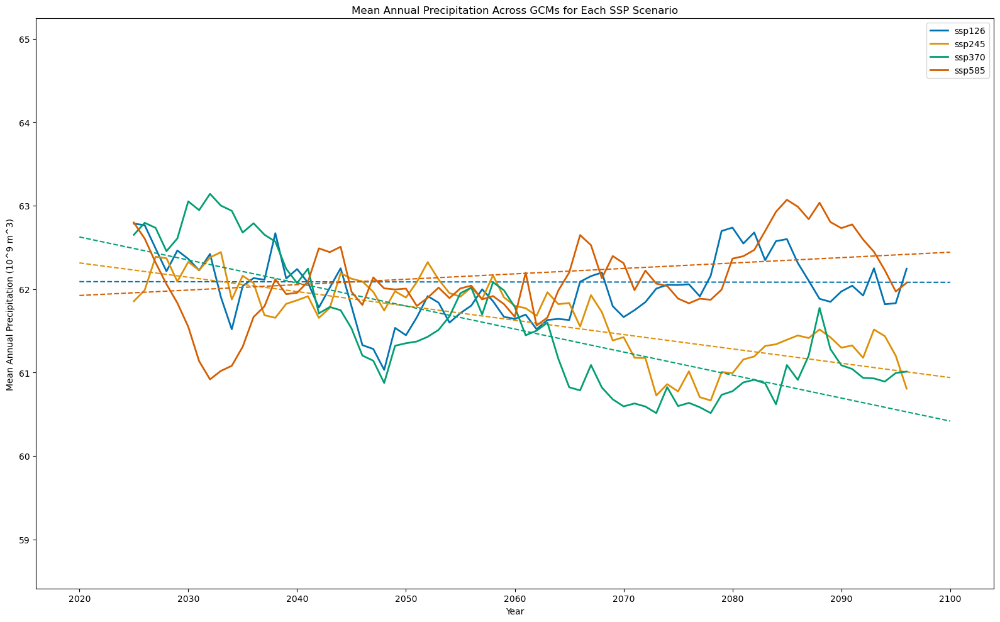

In [21]:
# Function to plot mean annual precipitation change with best fit lines
def plot_mean_annual_prcp(mean_annual_prcp, ssps, window=10):
    # Define color palette for SSPs
    ssp_colors = sns.color_palette("colorblind", len(ssps))
    ssp_color_dict = dict(zip(ssps, ssp_colors))

    # Create figure and axis
    plt.figure(figsize=(16, 10))

    all_values = []

    for ssp in ssps:
        # Get original data
        prcp_data = mean_annual_prcp[ssp]
        years = prcp_data['time'].values
        prcp_values = prcp_data.values

        # Calculate best fit line using original data
        if len(years) > 1 and len(prcp_values) > 1:  # Ensure there is enough data
            fit = np.polyfit(years, prcp_values, 1)
            fit_fn = np.poly1d(fit)
            plt.plot(years, fit_fn(years), linestyle='--', color=ssp_color_dict[ssp], linewidth=1.5)

        # Smooth data for visualization
        prcp_data_smoothed = prcp_data.rolling(time=window, center=True).mean()
        smoothed_years = prcp_data_smoothed['time'].values
        smoothed_values = prcp_data_smoothed.values

        plt.plot(smoothed_years, smoothed_values, label=ssp, color=ssp_color_dict[ssp], linewidth=2)
        all_values.extend(smoothed_values)

    # Calculate y-axis limits with buffer
    min_value = np.nanmin(all_values)
    max_value = np.nanmax(all_values)
    y_buffer = (max_value - min_value) * 0.8
    plt.ylim(min_value - y_buffer, max_value + y_buffer)

    # Plot formatting
    plt.xlabel('Year')
    plt.ylabel('Mean Annual Precipitation (10^9 m^3)')
    plt.title('Mean Annual Precipitation Across GCMs for Each SSP Scenario')
    plt.legend(loc='upper right')
    plt.grid(False)
    plt.tight_layout()
    plt.show()

# Calculate the mean annual precipitation for each SSP scenario
mean_annual_prcp = calculate_mean_annual_prcp(annual_prcp_dict, ssp_list)

# Call the plotting function
plot_mean_annual_prcp(mean_annual_prcp, ssp_list)


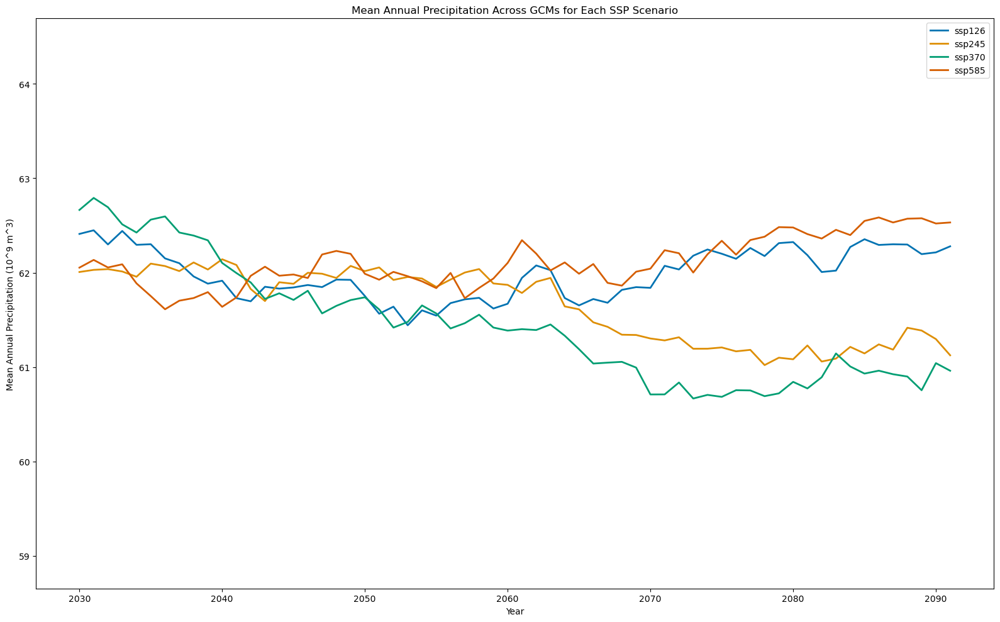

In [22]:
# Function to plot mean annual precipitation change with standard deviation
def plot_mean_annual_prcp(mean_annual_prcp, ssps, window=20):
    # Define color palette for SSPs
    ssp_colors = sns.color_palette("colorblind", len(ssps))
    ssp_color_dict = dict(zip(ssps, ssp_colors))

    # Create figure and axis
    plt.figure(figsize=(16, 10))

    for ssp in ssps:
        prcp_data_smoothed = mean_annual_prcp[ssp].rolling(time=window, center=True).mean()
        std_dev = mean_annual_prcp[ssp].rolling(time=window, center=True).std()
        years = prcp_data_smoothed['time'].values
        prcp_values = prcp_data_smoothed.values

        # plt.plot(years, prcp_values, label=ssp, color=ssp_color_dict[ssp], linewidth=2)
        # plt.fill_between(years, prcp_values - std_dev.values, prcp_values + std_dev.values,
        #                  color=ssp_color_dict[ssp], alpha=0.15)

    # Plot formatting
    plt.xlabel('Year')
    plt.ylabel('Mean Annual Precipitation (10^9 m^3)')
    plt.title('Mean Annual Precipitation Across GCMs for Each SSP Scenario')
    plt.legend(loc='upper right')
    plt.grid(False)
    plt.tight_layout()
    plt.show()

# Calculate the mean annual precipitation for each SSP scenario
mean_annual_prcp = calculate_mean_annual_prcp(annual_prcp_dict, ssp_list)

# Call the plotting function with 1 standard deviation
plot_mean_annual_prcp(mean_annual_prcp, ssp_list)


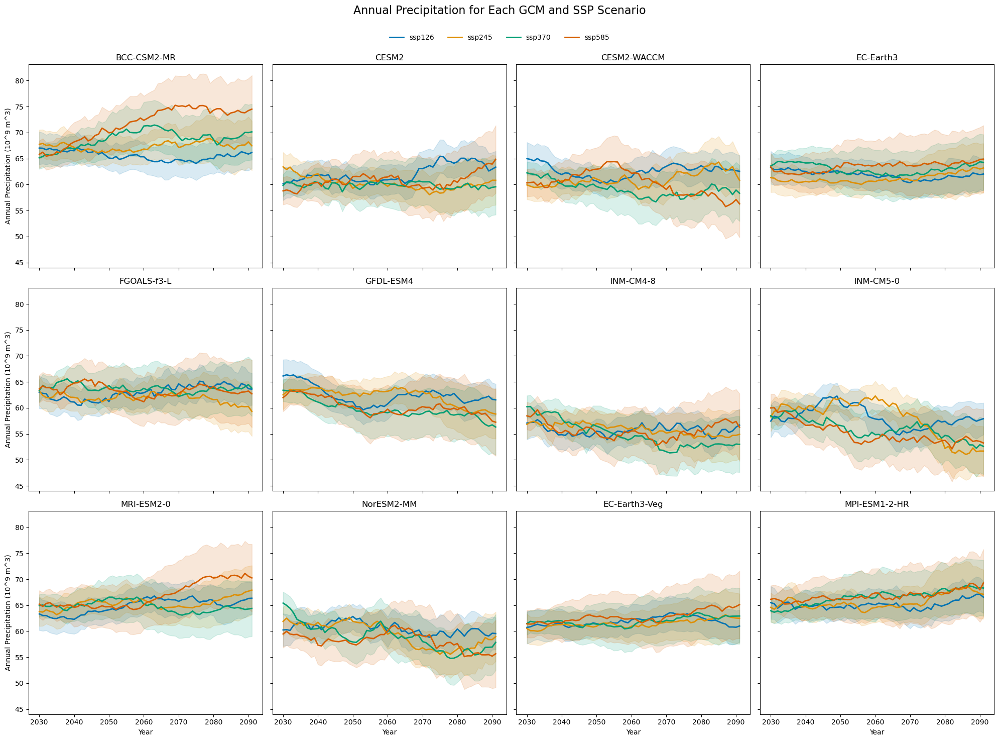

In [23]:
# Function to calculate mean annual precipitation for each SSP scenario
def calculate_mean_annual_prcp(annual_prcp_dict, ssps):
    mean_annual_prcp_dict = {}
    for ssp in ssps:
        ssp_prcp_data = [annual_prcp_dict[gcm_key] for gcm_key in annual_prcp_dict if ssp in gcm_key]
        mean_annual_prcp_dict[ssp] = xr.concat(ssp_prcp_data, dim='gcm').mean(dim='gcm')
    return mean_annual_prcp_dict

# Function to plot annual precipitation for each GCM and SSP scenario
def plot_total_prcp_per_gcm(annual_prcp_dict, gcm_list, ssps, window=20):
    # Define color palette for SSPs
    ssp_colors = sns.color_palette("colorblind", len(ssps))
    ssp_color_dict = dict(zip(ssps, ssp_colors))

    # Create a 3x4 grid for plotting
    fig, axes = plt.subplots(3, 4, figsize=(20, 15), sharex=True, sharey=True)
    axes = axes.flatten()

    for idx, gcm in enumerate(gcm_list):
        ax = axes[idx]
        for ssp in ssps:
            gcm_key = f'{gcm}-{ssp}'
            if gcm_key in annual_prcp_dict:
                gcm_data = annual_prcp_dict[gcm_key].rolling(time=window, center=True).mean()
                years = gcm_data['time'].values
                prcp_values = gcm_data.values
                ax.plot(years, prcp_values, label=f'{ssp}', color=ssp_color_dict[ssp], linewidth=2)

                # Calculate and plot standard deviation as a shaded area
                ssp_data = [annual_prcp_dict[f'{gcm}-{ssp}'].rolling(time=window, center=True).mean() for gcm in gcm_list if f'{gcm}-{ssp}' in annual_prcp_dict]
                stacked_data = np.stack([data.values for data in ssp_data], axis=0)
                std_dev = np.std(stacked_data, axis=0)
                ax.fill_between(years, prcp_values - std_dev, prcp_values + std_dev, color=ssp_color_dict[ssp], alpha=0.15)

        ax.set_title(gcm)
        if idx % 4 == 0:
            ax.set_ylabel('Annual Precipitation (10^9 m^3)')
        if idx >= 8:
            ax.set_xlabel('Year')
        ax.grid(False)

    # Set legend and layout
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=len(ssps), bbox_to_anchor=(0.5, 0.95), frameon=False)
    plt.suptitle('Annual Precipitation for Each GCM and SSP Scenario', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# List of SSP scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Calculate the mean annual precipitation for each SSP scenario
mean_annual_prcp = calculate_mean_annual_prcp(annual_prcp_dict, ssps)

# Call the plotting function
plot_total_prcp_per_gcm(annual_prcp_dict, gcm_list, ssps)



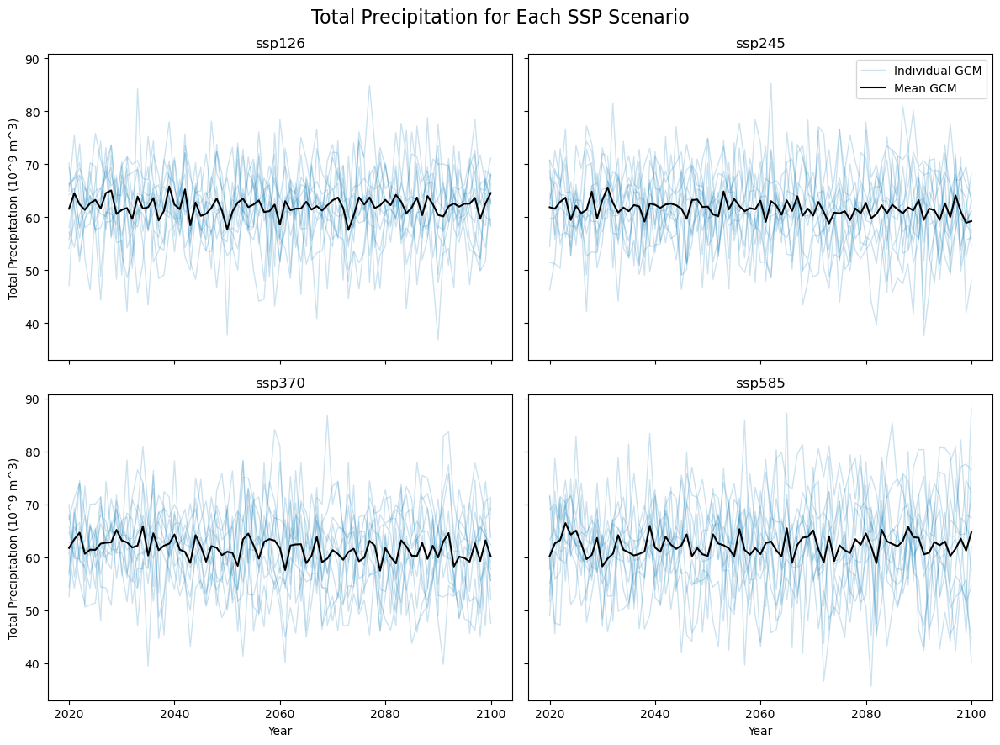

In [24]:
# Function to plot total precipitation for each SSP scenario
def plot_total_prcp_per_ssp(annual_prcp_dict, gcm_list, ssps, window=1): # Control smoothing here
    light_blue = sns.color_palette("colorblind")[0]  # Choose a light blue color
    mean_color = 'black'

    # Create a 2x2 grid for plotting
    fig, axes = plt.subplots(2, 2, figsize=(12, 9), sharex=True, sharey=True)
    axes = axes.flatten()

    for idx, ssp in enumerate(ssps):
        ax = axes[idx]

        for gcm in gcm_list:
            gcm_key = f'{gcm}-{ssp}'
            if gcm_key in annual_prcp_dict:
                gcm_data = annual_prcp_dict[gcm_key].rolling(time=window, center=True).mean()
                years = gcm_data['time'].values
                prcp_values = gcm_data.values
                ax.plot(years, prcp_values, color=light_blue, linewidth=1, alpha=0.2, label='Individual GCM')

        # Calculate and plot the mean of GCMs
        ssp_data = [annual_prcp_dict[f'{gcm}-{ssp}'].rolling(time=window, center=True).mean() for gcm in gcm_list if f'{gcm}-{ssp}' in annual_prcp_dict]
        if ssp_data:
            stacked_data = np.stack([data.values for data in ssp_data], axis=0)
            mean_prcp = np.mean(stacked_data, axis=0)
            ax.plot(years, mean_prcp, label='Mean GCM', color=mean_color, linewidth=1.5)

        ax.set_title(ssp)
        if idx % 2 == 0:
            ax.set_ylabel('Total Precipitation (10^9 m^3)')
        if idx >= 2:
            ax.set_xlabel('Year')
        ax.grid(False)

        # Set x-axis ticks to show years in increments of 20
        ax.set_xticks(np.arange(years[0], years[-1] + 1, 20))

    # Set legend in the upper right corner of the upper right plot
    handles, labels = ax.get_legend_handles_labels()
    axes[1].legend(handles[-2:], labels[-2:], loc='upper right', frameon=True)  # Show the last two legend items

    plt.suptitle('Total Precipitation for Each SSP Scenario', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 1])
    plt.show()

# Call the plotting function
plot_total_prcp_per_ssp(annual_prcp_dict, gcm_list, ssps)


In [25]:
# Function to calculate percentage differences
def calculate_pct_differences(annual_prcp_dict, gcm_list, ssps):
    ssp_diff_summary = {}

    for ssp in ssps:
        ssp_data = [annual_prcp_dict[f'{gcm}-{ssp}'] for gcm in gcm_list if f'{gcm}-{ssp}' in annual_prcp_dict]
        
        if ssp_data:
            mean_values = np.array([data.mean().values for data in ssp_data])
            max_value = mean_values.max()
            min_value = mean_values.min()
            pct_diff_gcms = ((max_value - min_value) / min_value) * 100

            ssp_diff_summary[ssp] = {
                'max_value': max_value,
                'min_value': min_value,
                'pct_diff_gcms': pct_diff_gcms
            }

    ssp_comparison_summary = {}
    for i, ssp1 in enumerate(ssps):
        for ssp2 in ssps[i+1:]:
            mean_ssp1 = np.mean([annual_prcp_dict[f'{gcm}-{ssp1}'].mean().values for gcm in gcm_list if f'{gcm}-{ssp1}' in annual_prcp_dict])
            mean_ssp2 = np.mean([annual_prcp_dict[f'{gcm}-{ssp2}'].mean().values for gcm in gcm_list if f'{gcm}-{ssp2}' in annual_prcp_dict])
            pct_diff_ssps = ((mean_ssp2 - mean_ssp1) / mean_ssp1) * 100

            ssp_comparison_summary[f'{ssp1} vs {ssp2}'] = {
                'mean_ssp1': mean_ssp1,
                'mean_ssp2': mean_ssp2,
                'pct_diff_ssps': pct_diff_ssps
            }

    return ssp_diff_summary, ssp_comparison_summary

# Calculate the percentage differences
ssp_diff_summary, ssp_comparison_summary = calculate_pct_differences(annual_prcp_dict, gcm_list, ssps)

# Print the summaries
print("Percentage Difference Between Highest and Lowest GCM for Each SSP:")
for ssp, summary in ssp_diff_summary.items():
    print(f"SSP: {ssp}")
    print(f"  Max Value: {summary['max_value']:.2f} x10^9 m^3")
    print(f"  Min Value: {summary['min_value']:.2f} x10^9 m^3")
    print(f"  Percentage Difference: {summary['pct_diff_gcms']:.2f}%")
    print()

print("Percentage Difference Between SSPs:")
for comparison, summary in ssp_comparison_summary.items():
    print(f"Comparison: {comparison}")
    print(f"  Mean Value {comparison.split(' vs ')[0]}: {summary['mean_ssp1']:.2f} x10^9 m^3")
    print(f"  Mean Value {comparison.split(' vs ')[1]}: {summary['mean_ssp2']:.2f} x10^9 m^3")
    print(f"  Percentage Difference: {summary['pct_diff_ssps']:.2f}%")
    print()


Percentage Difference Between Highest and Lowest GCM for Each SSP:
SSP: ssp126
  Max Value: 65.73 x10^9 m^3
  Min Value: 56.23 x10^9 m^3
  Percentage Difference: 16.89%

SSP: ssp245
  Max Value: 67.32 x10^9 m^3
  Min Value: 55.96 x10^9 m^3
  Percentage Difference: 20.31%

SSP: ssp370
  Max Value: 68.43 x10^9 m^3
  Min Value: 55.23 x10^9 m^3
  Percentage Difference: 23.89%

SSP: ssp585
  Max Value: 71.33 x10^9 m^3
  Min Value: 55.67 x10^9 m^3
  Percentage Difference: 28.12%

Percentage Difference Between SSPs:
Comparison: ssp126 vs ssp245
  Mean Value ssp126: 62.09 x10^9 m^3
  Mean Value ssp245: 61.63 x10^9 m^3
  Percentage Difference: -0.74%

Comparison: ssp126 vs ssp370
  Mean Value ssp126: 62.09 x10^9 m^3
  Mean Value ssp370: 61.52 x10^9 m^3
  Percentage Difference: -0.91%

Comparison: ssp126 vs ssp585
  Mean Value ssp126: 62.09 x10^9 m^3
  Mean Value ssp585: 62.18 x10^9 m^3
  Percentage Difference: 0.16%

Comparison: ssp245 vs ssp370
  Mean Value ssp245: 61.63 x10^9 m^3
  Mean Value

## Precip components

In [26]:
# Function to calculate the mean and standard deviation of annual precipitation components across GCMs for each SSP scenario
def calculate_mean_std_annual_components(annual_liq_prcp_dict, annual_snowfall_dict, gcm_list, ssps):
    mean_annual_liq_prcp_dict = {}
    std_annual_liq_prcp_dict = {}
    mean_annual_snowfall_dict = {}
    std_annual_snowfall_dict = {}
    
    for ssp in ssps:
        liq_prcp_data = [annual_liq_prcp_dict[f'{gcm}-{ssp}'] for gcm in gcm_list if f'{gcm}-{ssp}' in annual_liq_prcp_dict]
        snowfall_data = [annual_snowfall_dict[f'{gcm}-{ssp}'] for gcm in gcm_list if f'{gcm}-{ssp}' in annual_snowfall_dict]
        
        if liq_prcp_data and snowfall_data:
            concatenated_liq_prcp = xr.concat(liq_prcp_data, dim='gcm')
            concatenated_snowfall = xr.concat(snowfall_data, dim='gcm')
            
            mean_liq_prcp = concatenated_liq_prcp.mean(dim='gcm')
            std_liq_prcp = concatenated_liq_prcp.std(dim='gcm')
            
            mean_snowfall = concatenated_snowfall.mean(dim='gcm')
            std_snowfall = concatenated_snowfall.std(dim='gcm')
            
            mean_annual_liq_prcp_dict[ssp] = mean_liq_prcp
            std_annual_liq_prcp_dict[ssp] = std_liq_prcp
            mean_annual_snowfall_dict[ssp] = mean_snowfall
            std_annual_snowfall_dict[ssp] = std_snowfall
    
    return mean_annual_liq_prcp_dict, std_annual_liq_prcp_dict, mean_annual_snowfall_dict, std_annual_snowfall_dict

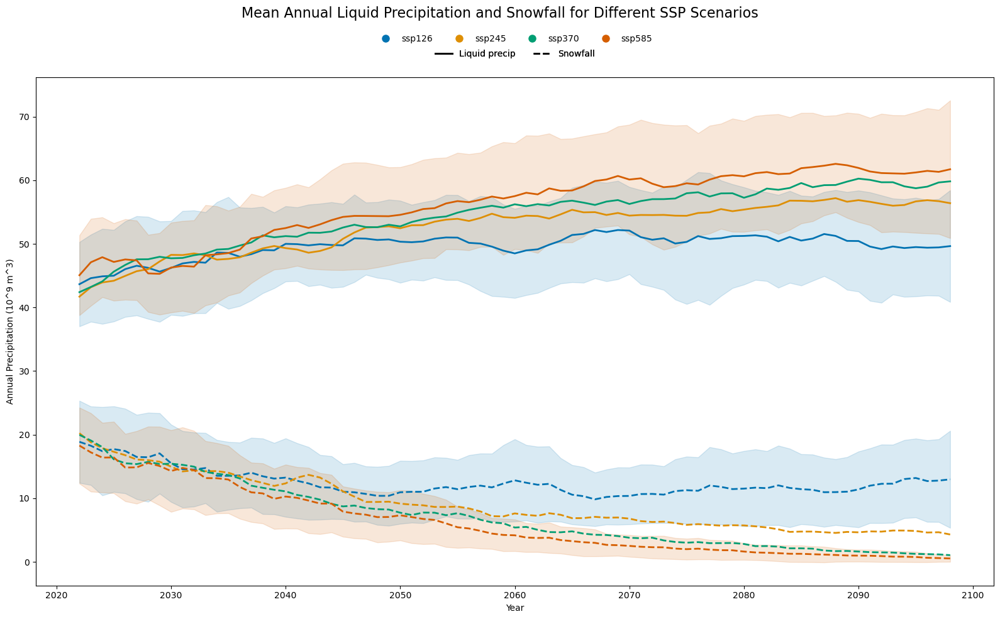

In [27]:
# Function to plot the mean annual precipitation components with standard deviation for each SSP scenario
def plot_mean_annual_prcp_components(mean_annual_liq_prcp_dict, std_annual_liq_prcp_dict, mean_annual_snowfall_dict, std_annual_snowfall_dict, ssps, window=5):
    # Define color palette for SSPs
    ssp_colors = sns.color_palette("colorblind", len(ssps))
    ssp_color_dict = dict(zip(ssps, ssp_colors))

    plt.figure(figsize=(16, 10))

    for ssp in ssps:
        if ssp in mean_annual_liq_prcp_dict and ssp in mean_annual_snowfall_dict:
            mean_liq_prcp = mean_annual_liq_prcp_dict[ssp].rolling(time=window, center=True).mean()
            std_liq_prcp = std_annual_liq_prcp_dict[ssp].rolling(time=window, center=True).mean()
            mean_snowfall = mean_annual_snowfall_dict[ssp].rolling(time=window, center=True).mean()
            std_snowfall = std_annual_snowfall_dict[ssp].rolling(time=window, center=True).mean()
            
            years = mean_liq_prcp['time'].values
            liq_prcp_values = mean_liq_prcp.values
            snowfall_values = mean_snowfall.values

            plt.plot(years, liq_prcp_values, label=f'{ssp} Liquid precip', color=ssp_color_dict[ssp], linewidth=2)
            plt.plot(years, snowfall_values, label=f'{ssp} Snowfall', color=ssp_color_dict[ssp], linestyle='--', linewidth=2)
            
            # Calculate and plot standard deviation as a shaded area
            if ssp in ['ssp126', 'ssp585']:
                plt.fill_between(years, liq_prcp_values - std_liq_prcp, liq_prcp_values + std_liq_prcp, color=ssp_color_dict[ssp], alpha=0.15)
                plt.fill_between(years, snowfall_values - std_snowfall, snowfall_values + std_snowfall, color=ssp_color_dict[ssp], alpha=0.15)

    plt.xlabel('Year')
    plt.ylabel('Annual Precipitation (10^9 m^3)')
    
    # Create a combined legend for components and SSPs
    handles_components = [plt.Line2D([0], [0], color='k', linewidth=2, linestyle='-'),
                          plt.Line2D([0], [0], color='k', linewidth=2, linestyle='--')]
    labels_components = ['Liquid precip', 'Snowfall']
    handles_ssps = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=ssp_color_dict[ssp], markersize=10) for ssp in ssps]
    labels_ssps = ssps

    # Position the legend as a combined whole
    legend1 = plt.legend(handles=handles_ssps, labels=labels_ssps, loc='upper center', ncol=len(ssps), bbox_to_anchor=(0.5, 1.1), frameon=False)
    legend2 = plt.legend(handles=handles_components, labels=labels_components, loc='upper center', ncol=2, bbox_to_anchor=(0.5, 1.07), frameon=False)

    # Add both legends to the plot
    plt.gca().add_artist(legend1)
    plt.gca().add_artist(legend2)

    plt.grid(False)
    plt.suptitle('Mean Annual Liquid Precipitation and Snowfall for Different SSP Scenarios', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

# List of SSP scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Calculate the mean and standard deviation of annual precipitation components across GCMs for each SSP scenario
mean_annual_liq_prcp_dict, std_annual_liq_prcp_dict, mean_annual_snowfall_dict, std_annual_snowfall_dict = calculate_mean_std_annual_components(annual_liq_prcp_dict, annual_snowfall_dict, gcm_list, ssps)

# Plot the mean annual precipitation components with standard deviation for each SSP scenario
plot_mean_annual_prcp_components(mean_annual_liq_prcp_dict, std_annual_liq_prcp_dict, mean_annual_snowfall_dict, std_annual_snowfall_dict, ssps)


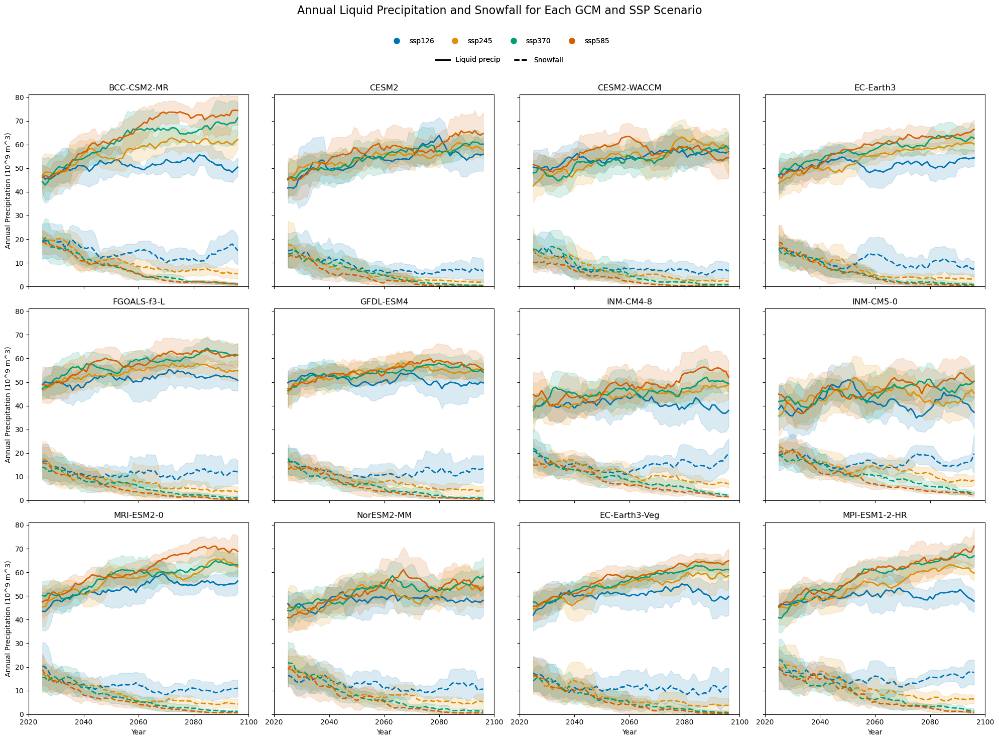

In [28]:
# Function to plot annual precipitation components for each GCM and SSP scenario
def plot_annual_prcp_components(annual_liq_prcp_dict, annual_snowfall_dict, gcm_list, ssps, window=10):
    # Define color palette for SSPs
    ssp_colors = sns.color_palette("colorblind", len(ssps))
    ssp_color_dict = dict(zip(ssps, ssp_colors))

    # Create a 2x5 grid for plotting
    fig, axes = plt.subplots(3, 4, figsize=(20, 15), sharex=True, sharey=True)
    axes = axes.flatten()

    max_y_value = 0  # Initialize a variable to find the max y value

    for idx, gcm in enumerate(gcm_list):
        ax = axes[idx]

        for ssp in ssps:
            gcm_key = f'{gcm}-{ssp}'
            if gcm_key in annual_liq_prcp_dict and gcm_key in annual_snowfall_dict:
                liq_prcp_data = annual_liq_prcp_dict[gcm_key]
                snowfall_data = annual_snowfall_dict[gcm_key]

                # Apply smoothing
                liq_prcp_smoothed = liq_prcp_data.rolling(time=window, center=True).mean()
                snowfall_smoothed = snowfall_data.rolling(time=window, center=True).mean()

                years = liq_prcp_smoothed['time'].values
                liq_prcp_values = liq_prcp_smoothed.values
                snowfall_values = snowfall_smoothed.values

                # Plot liquid precipitation and snowfall
                ax.plot(years, liq_prcp_values, label='Liquid precip', color=ssp_color_dict[ssp], linewidth=2)
                ax.plot(years, snowfall_values, label='Snowfall', color=ssp_color_dict[ssp], linewidth=2, linestyle='--')

                # Calculate standard deviation
                liq_prcp_std = liq_prcp_data.rolling(time=window, center=True).std().values
                snowfall_std = snowfall_data.rolling(time=window, center=True).std().values

                # Plot standard deviation shading
                ax.fill_between(years, liq_prcp_values - liq_prcp_std, liq_prcp_values + liq_prcp_std,
                                color=ssp_color_dict[ssp], alpha=0.15)
                ax.fill_between(years, snowfall_values - snowfall_std, snowfall_values + snowfall_std,
                                color=ssp_color_dict[ssp], alpha=0.15)

                # Update max_y_value if necessary
                max_y_value = max(max_y_value, np.nanmax(liq_prcp_values + liq_prcp_std), np.nanmax(snowfall_values + snowfall_std))
                
        ax.set_title(gcm)
        if idx % 4 == 0:
            ax.set_ylabel('Annual Precipitation (10^9 m^3)')
        if idx >= 8:
            ax.set_xlabel('Year')
        ax.grid(False)
        
        # Set limits to the x-axis (2020-2100)
        ax.set_xlim(2020, 2100)

        # Set x-axis tick labels for every 20 years
        ax.set_xticks(np.arange(2020, 2101, 20))

    # Set uniform y-axis limits based on the max_y_value
    for ax in axes:
        ax.set_ylim(0, max_y_value)

    # Create a combined legend for components and SSPs
    handles_components = [plt.Line2D([0], [0], color='k', linewidth=2, linestyle='-'),
                          plt.Line2D([0], [0], color='k', linewidth=2, linestyle='--')]
    labels_components = ['Liquid precip', 'Snowfall']
    handles_ssps = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=ssp_color_dict[ssp], markersize=10) for ssp in ssps]
    labels_ssps = ssps

    # Position the legend as a combined whole
    legend1 = fig.legend(handles=handles_ssps, labels=labels_ssps, loc='upper center', ncol=len(ssps), bbox_to_anchor=(0.5, 0.945), frameon=False)
    legend2 = fig.legend(handles=handles_components, labels=labels_components, loc='upper center', ncol=2, bbox_to_anchor=(0.5, 0.92), frameon=False)

    # Add space between legends
    plt.subplots_adjust(top=0.87)  # Adjust the top padding as needed

    # Add both legends to the plot
    plt.gca().add_artist(legend1)
    plt.gca().add_artist(legend2)

    plt.suptitle('Annual Liquid Precipitation and Snowfall for Each GCM and SSP Scenario', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.91])
    plt.show()

# List of SSP scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Call the plotting function
plot_annual_prcp_components(annual_liq_prcp_dict, annual_snowfall_dict, gcm_list, ssps)


## Statistical analysis

In [29]:
from IPython.display import display, HTML
from scipy.stats import linregress

# Define the function to calculate mean annual precipitation for each SSP scenario
def calculate_mean_annual_prcp(annual_prcp_dict, ssps):
    mean_annual_prcp_dict = {}

    for ssp in ssps:
        ssp_prcp_data = [annual_prcp_dict[gcm_key] for gcm_key in annual_prcp_dict if ssp in gcm_key]
        mean_annual_prcp_dict[ssp] = xr.concat(ssp_prcp_data, dim='gcm').mean(dim='gcm')

    return mean_annual_prcp_dict

# Define the function to calculate the percentage change in precipitation components and total precipitation using trends
def calculate_pct_change_precip(mean_annual_liq_prcp_dict, mean_annual_snowfall_dict, mean_annual_prcp_dict, ssps):
    pct_changes = {}

    for ssp in ssps:
        if ssp in mean_annual_liq_prcp_dict and ssp in mean_annual_snowfall_dict and ssp in mean_annual_prcp_dict:
            liq_prcp_data = mean_annual_liq_prcp_dict[ssp]
            snowfall_data = mean_annual_snowfall_dict[ssp]
            prcp_data = mean_annual_prcp_dict[ssp]

            # Extract time and values for linear regression
            years = liq_prcp_data['time'].values.astype(float)
            liq_prcp_values = liq_prcp_data.values
            snowfall_values = snowfall_data.values
            prcp_values = prcp_data.values

            # Calculate trends using linear regression
            liq_slope, liq_intercept, _, _, _ = linregress(years, liq_prcp_values)
            snow_slope, snow_intercept, _, _, _ = linregress(years, snowfall_values)
            prcp_slope, prcp_intercept, _, _, _ = linregress(years, prcp_values)

            # Calculate start and end values based on the trend
            liq_prcp_start = liq_intercept + liq_slope * years[0]
            liq_prcp_end = liq_intercept + liq_slope * years[-1]
            snow_start = snow_intercept + snow_slope * years[0]
            snow_end = snow_intercept + snow_slope * years[-1]
            prcp_start = prcp_intercept + prcp_slope * years[0]
            prcp_end = prcp_intercept + prcp_slope * years[-1]

            # Calculate percentage changes
            pct_change_liq_prcp = ((liq_prcp_end - liq_prcp_start) / liq_prcp_start) * 100
            pct_change_snowfall = ((snow_end - snow_start) / snow_start) * 100
            pct_change_prcp = ((prcp_end - prcp_start) / prcp_start) * 100

            avg_annual_change_prcp = pct_change_prcp / (years[-1] - years[0])

            pct_changes[ssp] = {
                'pct_change_liq_prcp': np.round(pct_change_liq_prcp, 3),
                'pct_change_snowfall': np.round(pct_change_snowfall, 3),
                'pct_change_prcp': np.round(pct_change_prcp, 3),
                'avg_annual_change_prcp': np.round(avg_annual_change_prcp, 3)
            }

    return pct_changes

# Define the function to calculate the ratio of liquid precipitation to snowfall for 2020 and 2100
def calculate_liq_to_snow_ratio(mean_annual_liq_prcp_dict, mean_annual_snowfall_dict, ssps):
    ratios = []

    for ssp in ssps:
        if ssp in mean_annual_liq_prcp_dict and ssp in mean_annual_snowfall_dict:
            liq_prcp_data = mean_annual_liq_prcp_dict[ssp]
            snowfall_data = mean_annual_snowfall_dict[ssp]

            # Extract time and values for linear regression
            years = liq_prcp_data['time'].values.astype(float)
            liq_prcp_values = liq_prcp_data.values
            snowfall_values = snowfall_data.values

            # Calculate trends using linear regression
            liq_slope, liq_intercept, _, _, _ = linregress(years, liq_prcp_values)
            snow_slope, snow_intercept, _, _, _ = linregress(years, snowfall_values)

            # Calculate values for 2020 and 2100 based on the trend
            liq_prcp_2020 = liq_intercept + liq_slope * 2020
            liq_prcp_2100 = liq_intercept + liq_slope * 2100
            snow_2020 = snow_intercept + snow_slope * 2020
            snow_2100 = snow_intercept + snow_slope * 2100

            ratio_2020 = liq_prcp_2020 / snow_2020
            ratio_2100 = liq_prcp_2100 / snow_2100

            ratios.append({
                'SSP': ssp,
                'Liq: Snowfall Ratio 2020': np.round(ratio_2020.astype(float), 3),
                'Liq: Snowfall Ratio 2100': np.round(ratio_2100.astype(float), 3)
            })

    return pd.DataFrame(ratios)

# List of SSP scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Calculate the mean annual precipitation for each SSP scenario
mean_annual_prcp_dict = calculate_mean_annual_prcp(annual_prcp_dict, ssps)

# Calculate the percentage change in precipitation components and total precipitation
pct_changes_precip = calculate_pct_change_precip(mean_annual_liq_prcp_dict, mean_annual_snowfall_dict, mean_annual_prcp_dict, ssps)

# Display the percentage changes
for ssp, changes in pct_changes_precip.items():
    print(f"{ssp}: Liquid Precipitation Change: {changes['pct_change_liq_prcp']}%, Snowfall Change: {changes['pct_change_snowfall']}%, Total Precipitation Change: {changes['pct_change_prcp']}%, Avg Annual Change Prcp: {changes['avg_annual_change_prcp']}%")

# Calculate the ratio of liquid precipitation to snowfall for 2020 and 2100
liq_to_snow_ratios = calculate_liq_to_snow_ratio(mean_annual_liq_prcp_dict, mean_annual_snowfall_dict, ssps)

# Display the results in a well-organized table
print(liq_to_snow_ratios.to_string(index=False))


ssp126: Liquid Precipitation Change: 10.024%, Snowfall Change: -31.484%, Total Precipitation Change: -0.012%, Avg Annual Change Prcp: -0.0%
ssp245: Liquid Precipitation Change: 29.315%, Snowfall Change: -88.727%, Total Precipitation Change: -2.205%, Avg Annual Change Prcp: -0.028%
ssp370: Liquid Precipitation Change: 34.473%, Snowfall Change: -110.767%, Total Precipitation Change: -3.524%, Avg Annual Change Prcp: -0.044%
ssp585: Liquid Precipitation Change: 39.499%, Snowfall Change: -117.311%, Total Precipitation Change: 0.837%, Avg Annual Change Prcp: 0.01%
   SSP  Liq: Snowfall Ratio 2020  Liq: Snowfall Ratio 2100
ssp126                     3.136                     5.035
ssp245                     2.745                    31.488
ssp370                     2.822                   -35.250
ssp585                     3.056                   -24.626


In [32]:
from IPython.display import display, HTML
import numpy as np
import pandas as pd
import xarray as xr

# Define the function to calculate mean annual precipitation for each SSP scenario
def calculate_mean_annual_prcp(annual_prcp_dict, ssps):
    mean_annual_prcp_dict = {}

    for ssp in ssps:
        ssp_prcp_data = [annual_prcp_dict[gcm_key] for gcm_key in annual_prcp_dict if ssp in gcm_key]
        mean_annual_prcp_dict[ssp] = xr.concat(ssp_prcp_data, dim='gcm').mean(dim='gcm')

    return mean_annual_prcp_dict

# Define the function to calculate the percentage change in precipitation components and total precipitation using averages
def calculate_pct_change_precip(mean_annual_liq_prcp_dict, mean_annual_snowfall_dict, mean_annual_prcp_dict, ssps):
    pct_changes = {}

    for ssp in ssps:
        if ssp in mean_annual_liq_prcp_dict and ssp in mean_annual_snowfall_dict and ssp in mean_annual_prcp_dict:
            liq_prcp_data = mean_annual_liq_prcp_dict[ssp]
            snowfall_data = mean_annual_snowfall_dict[ssp]
            prcp_data = mean_annual_prcp_dict[ssp]

            # Calculate average for first 10 years and last 10 years
            first_10_years = slice(0, 10)
            last_10_years = slice(-10, None)

            liq_prcp_start = liq_prcp_data.isel(time=first_10_years).mean(dim='time').values
            liq_prcp_end = liq_prcp_data.isel(time=last_10_years).mean(dim='time').values
            snow_start = snowfall_data.isel(time=first_10_years).mean(dim='time').values
            snow_end = snowfall_data.isel(time=last_10_years).mean(dim='time').values
            prcp_start = prcp_data.isel(time=first_10_years).mean(dim='time').values
            prcp_end = prcp_data.isel(time=last_10_years).mean(dim='time').values

            # Calculate percentage changes
            pct_change_liq_prcp = ((liq_prcp_end - liq_prcp_start) / liq_prcp_start) * 100
            pct_change_snowfall = ((snow_end - snow_start) / snow_start) * 100
            pct_change_prcp = ((prcp_end - prcp_start) / prcp_start) * 100

            pct_changes[ssp] = {
                'pct_change_liq_prcp': np.round(pct_change_liq_prcp, 3),
                'pct_change_snowfall': np.round(pct_change_snowfall, 3),
                'pct_change_prcp': np.round(pct_change_prcp, 3)
            }

    return pct_changes

# Define the function to calculate the ratio of liquid precipitation to snowfall for the first and last decade
def calculate_liq_to_snow_ratio(mean_annual_liq_prcp_dict, mean_annual_snowfall_dict, ssps):
    ratios = []

    for ssp in ssps:
        if ssp in mean_annual_liq_prcp_dict and ssp in mean_annual_snowfall_dict:
            liq_prcp_data = mean_annual_liq_prcp_dict[ssp]
            snowfall_data = mean_annual_snowfall_dict[ssp]

            # Calculate average for first 10 years and last 10 years
            first_10_years = slice(0, 10)
            last_10_years = slice(71, 81)

            liq_prcp_start = liq_prcp_data.isel(time=first_10_years).mean(dim='time').values
            liq_prcp_end = liq_prcp_data.isel(time=last_10_years).mean(dim='time').values
            snow_start = snowfall_data.isel(time=first_10_years).mean(dim='time').values
            snow_end = snowfall_data.isel(time=last_10_years).mean(dim='time').values

            ratio_start = liq_prcp_start / snow_start
            ratio_end = liq_prcp_end / snow_end

            ratios.append({
                'SSP': ssp,
                'Liq: Snowfall Ratio Start': np.round(ratio_start.astype(float), 3),
                'Liq: Snowfall Ratio End': np.round(ratio_end.astype(float), 3)
            })

    return pd.DataFrame(ratios)

# List of SSP scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Calculate the mean annual precipitation for each SSP scenario
mean_annual_prcp_dict = calculate_mean_annual_prcp(annual_prcp_dict, ssps)

# Calculate the percentage change in precipitation components and total precipitation
pct_changes_precip = calculate_pct_change_precip(mean_annual_liq_prcp_dict, mean_annual_snowfall_dict, mean_annual_prcp_dict, ssps)

# Display the percentage changes
for ssp, changes in pct_changes_precip.items():
    print(f"{ssp}: Liquid Precipitation Change: {changes['pct_change_liq_prcp']}%, Snowfall Change: {changes['pct_change_snowfall']}%, Total Precipitation Change: {changes['pct_change_prcp']}%")

# Calculate the ratio of liquid precipitation to snowfall for the first and last decade
liq_to_snow_ratios = calculate_liq_to_snow_ratio(mean_annual_liq_prcp_dict, mean_annual_snowfall_dict, ssps)

# Display the results in a well-organized table
print(liq_to_snow_ratios.to_string(index=False))


ssp126: Liquid Precipitation Change: 9.997%, Snowfall Change: -28.556%, Total Precipitation Change: -0.86%
ssp245: Liquid Precipitation Change: 28.597%, Snowfall Change: -74.599%, Total Precipitation Change: -1.694%
ssp370: Liquid Precipitation Change: 32.836%, Snowfall Change: -92.887%, Total Precipitation Change: -2.617%
ssp585: Liquid Precipitation Change: 32.811%, Snowfall Change: -95.923%, Total Precipitation Change: -1.151%
   SSP  Liq: Snowfall Ratio Start  Liq: Snowfall Ratio End
ssp126                      2.551                    3.928
ssp245                      2.407                   12.185
ssp370                      2.546                   47.554
ssp585                      2.791                   90.895


Summary for all cities:

La Paz:
ssp126: Liquid Precipitation Change: 10.024%, Snowfall Change: -31.484%, Total Precipitation Change: -0.012%, Avg Annual Change Prcp: -0.0%
ssp245: Liquid Precipitation Change: 29.315%, Snowfall Change: -88.727%, Total Precipitation Change: -2.205%, Avg Annual Change Prcp: -0.028%
ssp370: Liquid Precipitation Change: 34.473%, Snowfall Change: -110.767%, Total Precipitation Change: -3.524%, Avg Annual Change Prcp: -0.044%
ssp585: Liquid Precipitation Change: 39.499%, Snowfall Change: -117.311%, Total Precipitation Change: 0.837%, Avg Annual Change Prcp: 0.01%
   SSP  Liq: Snowfall Ratio 2020  Liq: Snowfall Ratio 2100
ssp126                     3.136                     5.035
ssp245                     2.745                    31.488
ssp370                     2.822                   -35.250
ssp585                     3.056                   -24.626

    - From meteoblue: between 1979-2023, there was 5.068% decrease in precip at Chacaltaya glacier = 0.11% annual decrease
    - GCMs and observations agree on generally stable, slightly declining precip (slightly steeper decline historically)
    - Little/no correlation of SSP with pct change
    
Quito (just two glaciers):
ssp126: Liquid Precipitation Change: 15.457%, Snowfall Change: -18.198%, Total Precipitation Change: -0.86%
ssp245: Liquid Precipitation Change: 49.075%, Snowfall Change: -50.983%, Total Precipitation Change: -1.694%
ssp370: Liquid Precipitation Change: 63.335%, Snowfall Change: -82.453%, Total Precipitation Change: -2.617%
ssp585: Liquid Precipitation Change: 70.289%, Snowfall Change: -90.953%, Total Precipitation Change: -1.151%
   SSP  Liq: Snowfall Ratio Start  Liq: Snowfall Ratio End
ssp126                      1.270                    1.793
ssp245                      1.274                    3.873
ssp370                      1.241                   11.551
ssp585                      1.293                   24.338

    - Meteoblue: 1979-2023 30.91% increase in precip at Mt. Cotopaxi = 0.687% annual increase
    - GCMs predict more stable precip than historical trends indicate

Santiago subset:
ssp126: Liquid Precipitation Change: 46.184%, Snowfall Change: 0.919%, Total Precipitation Change: 1.995%, Avg Annual Change Prcp: 0.025%
ssp245: Liquid Precipitation Change: 156.485%, Snowfall Change: -4.454%, Total Precipitation Change: -1.04%, Avg Annual Change Prcp: -0.013%
ssp370: Liquid Precipitation Change: 582.457%, Snowfall Change: -12.093%, Total Precipitation Change: -4.602%, Avg Annual Change Prcp: -0.058%
ssp585: Liquid Precipitation Change: 794.514%, Snowfall Change: -21.066%, Total Precipitation Change: -11.59%, Avg Annual Change Prcp: -0.145%
   SSP  Liq: Snowfall Ratio 2020  Liq: Snowfall Ratio 2100
ssp126                     0.024                     0.035
ssp245                     0.022                     0.058
ssp370                     0.013                     0.099
ssp585                     0.012                     0.133

    - Meteoblue: 1979-2023 28.88% decrease in precip at Cerro Marmolejo = 0.642% annual decrease
    - interesting that precip goes in different direct depending on SSP

In [15]:
# This is for total precip
# Function to calculate the mean value for the entire time frame for each GCM and SSP combination
def calculate_mean_values(annual_prcp_dict, gcm_list, ssps):
    mean_values = {}
    for gcm in gcm_list:
        for ssp in ssps:
            gcm_key = f'{gcm}-{ssp}'
            if gcm_key in annual_prcp_dict:
                mean_values[gcm_key] = annual_prcp_dict[gcm_key].mean(dim='time').values
    return mean_values

# Function to calculate percentage differences
def calculate_percentage_differences(mean_values, gcm_list, ssps):
    pct_diff_gcm_ssp = {}
    pct_diff_ssp_means = {}

    # Calculate pct difference between highest and lowest GCM for each SSP
    for ssp in ssps:
        ssp_values = [mean_values[f'{gcm}-{ssp}'] for gcm in gcm_list if f'{gcm}-{ssp}' in mean_values]
        if ssp_values:
            max_val = np.max(ssp_values)
            min_val = np.min(ssp_values)
            pct_diff_gcm_ssp[ssp] = 100 * (max_val - min_val) / min_val
    
    # Calculate the mean of GCMs for each SSP
    mean_gcm_ssp = {}
    for ssp in ssps:
        ssp_values = [mean_values[f'{gcm}-{ssp}'] for gcm in gcm_list if f'{gcm}-{ssp}' in mean_values]
        if ssp_values:
            mean_gcm_ssp[ssp] = np.mean(ssp_values)
    
    # Calculate pct difference between SSP means
    ssp_means = list(mean_gcm_ssp.values())
    if ssp_means:
        max_ssp_mean = np.max(ssp_means)
        min_ssp_mean = np.min(ssp_means)
        pct_diff_ssp_means = 100 * (max_ssp_mean - min_ssp_mean) / min_ssp_mean
    
    return pct_diff_gcm_ssp, pct_diff_ssp_means

# List of SSP scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Calculate the mean values for each GCM and SSP combination
mean_values = calculate_mean_values(annual_prcp_dict, gcm_list, ssps)

# Calculate the percentage differences
pct_diff_gcm_ssp, pct_diff_ssp_means = calculate_percentage_differences(mean_values, gcm_list, ssps)

# Print the statistical summary
print("Percentage difference between the highest and lowest GCM for each SSP:")
for ssp, pct_diff in pct_diff_gcm_ssp.items():
    print(f"{ssp}: {pct_diff:.2f}%")

print("\nPercentage difference between SSPs for the mean of GCMs:")
print(f"{pct_diff_ssp_means:.2f}%")


Percentage difference between the highest and lowest GCM for each SSP:
ssp126: 65.02%
ssp245: 70.86%
ssp370: 98.79%
ssp585: 92.68%

Percentage difference between SSPs for the mean of GCMs:
2.95%


Summary for all cities: SSPs and GCMs

La Paz:
    Percentage difference between the highest and lowest GCM for each SSP:
    ssp126: 16.89%
    ssp245: 20.31%
    ssp370: 23.89%
    ssp585: 28.12%
    
    Percentage difference between SSPs for the mean of GCMs: 1.07%

Quito region:
    Percentage difference between the highest and lowest GCM for each SSP:
    ssp126: 64.53%
    ssp245: 67.94%
    ssp370: 64.46%
    ssp585: 69.74%
    
    Percentage difference between SSPs for the mean of GCMs:
    2.37%

Santiago:
    Percentage difference between the highest and lowest GCM for each SSP:
    ssp126: 65.02%
    ssp245: 70.86%
    ssp370: 98.79%
    ssp585: 92.68%
    
    Percentage difference between SSPs for the mean of GCMs:
    2.95%

## Relative change

In [31]:
# Function to calculate the relative change in total precipitation
def calculate_relative_change(annual_prcp_dict, ssps):
    relative_change_dict = {}
    for ssp in ssps:
        ssp_data = [annual_prcp_dict[f'{gcm}-{ssp}'] for gcm in gcm_list if f'{gcm}-{ssp}' in annual_prcp_dict]
        if ssp_data:
            initial_values = np.array([data.isel(time=0).values for data in ssp_data])
            initial_mean = np.mean(initial_values)
            relative_changes = {gcm: ((data - initial_mean) / initial_mean * 100).rolling(time=n_roll, center=True).mean()
                                for gcm, data in zip(gcm_list, ssp_data)}
            relative_change_dict[ssp] = relative_changes
    return relative_change_dict

In [32]:
# Function to calculate the mean relative change in precipitation
def calculate_mean_relative_change(annual_prcp_dict, ssps):
    mean_relative_change_dict = {}
    for ssp in ssps:
        ssp_data = [annual_prcp_dict[f'{gcm}-{ssp}'] for gcm in gcm_list if f'{gcm}-{ssp}' in annual_prcp_dict]
        if ssp_data:
            initial_values = np.array([data.isel(time=0).values for data in ssp_data])
            initial_mean = np.mean(initial_values)
            relative_changes = np.array([((data - initial_mean) / initial_mean * 100).rolling(time=n_roll, center=True).mean().values
                                         for data in ssp_data])
            mean_relative_change = np.mean(relative_changes, axis=0)
            std_dev_relative_change = np.std(relative_changes, axis=0)
            years = ssp_data[0]['time'].values
            mean_relative_change_dict[ssp] = {'years': years, 'mean': mean_relative_change, 'std_dev': std_dev_relative_change}
    return mean_relative_change_dict

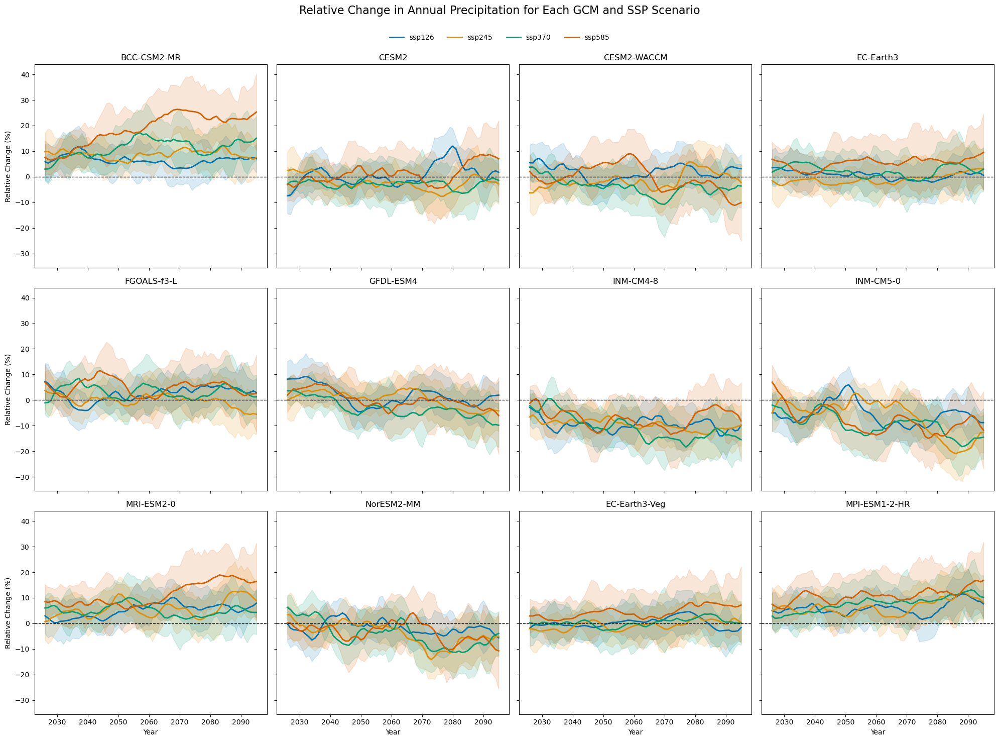

In [24]:
# Function to plot the relative change in total precipitation for each GCM
def plot_relative_precipitation(relative_change_dict, ssps):
    # Define color palette for SSPs
    ssp_colors = sns.color_palette("colorblind", len(ssps))
    ssp_color_dict = dict(zip(ssps, ssp_colors))

    # Create a 2x5 grid for plotting
    fig, axes = plt.subplots(3, 4, figsize=(20, 15), sharex=True, sharey=True)
    axes = axes.flatten()

    for idx, gcm in enumerate(gcm_list):
        ax = axes[idx]

        for ssp in ssps:
            if ssp in relative_change_dict and gcm in relative_change_dict[ssp]:
                gcm_data = relative_change_dict[ssp][gcm].rolling(time=10, center=True).mean()  # Apply 10-year rolling average
                years = gcm_data['time'].values
                relative_values = gcm_data.values
                ax.plot(years, relative_values, label=f'{ssp}', color=ssp_color_dict[ssp], linewidth=2)

                # Calculate and plot standard deviation as a shaded area
                ssp_data = [relative_change_dict[ssp][gcm] for gcm in gcm_list if gcm in relative_change_dict[ssp]]
                stacked_data = np.stack([data.values for data in ssp_data], axis=0)
                std_dev = np.std(stacked_data, axis=0)
                ax.fill_between(years, relative_values - std_dev, relative_values + std_dev, color=ssp_color_dict[ssp], alpha=0.15)

        # Add a horizontal line at y=0
        ax.axhline(0, linestyle='--', color='black', linewidth=1)

        ax.set_title(gcm)
        if idx % 4 == 0:
            ax.set_ylabel('Relative Change (%)')
        if idx >= 8:
            ax.set_xlabel('Year')
        ax.grid(False)

    # Set legend and layout
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=len(ssps), bbox_to_anchor=(0.5, 0.95), frameon=False)
    plt.suptitle('Relative Change in Annual Precipitation for Each GCM and SSP Scenario', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# List of SSP scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Calculate the relative change in annual precipitation for each SSP scenario
relative_change_dict = calculate_relative_change(annual_prcp_dict, ssps)

# Call the plotting function
plot_relative_precipitation(relative_change_dict, ssps)

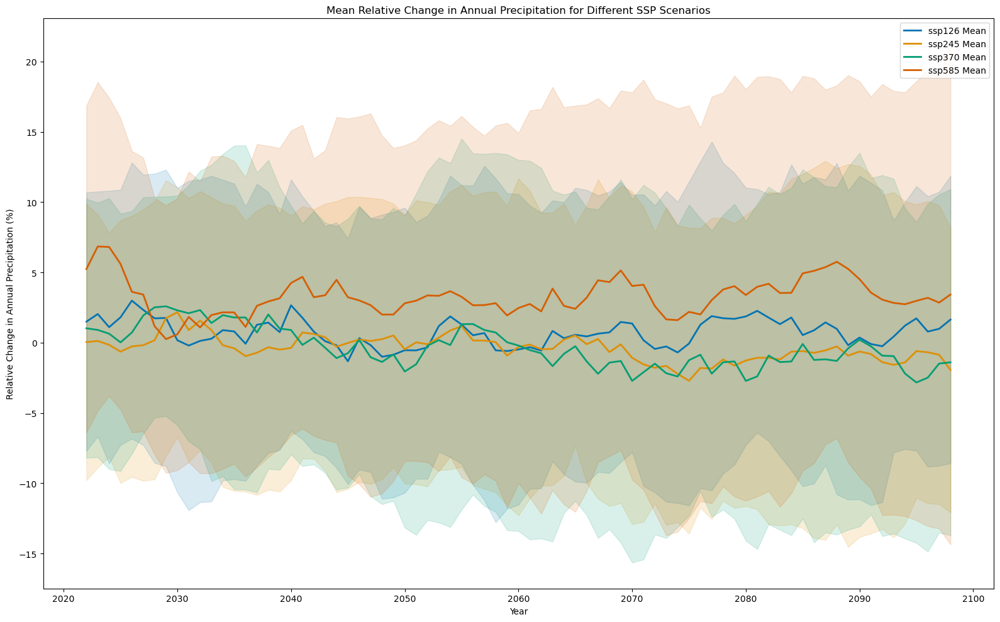

In [30]:
# Function to calculate the mean relative change in precipitation with a 5-year rolling average
def calculate_mean_relative_change(annual_prcp_dict, ssps):
    mean_relative_change_dict = {}
    for ssp in ssps:
        ssp_data = [annual_prcp_dict[f'{gcm}-{ssp}'] for gcm in gcm_list if f'{gcm}-{ssp}' in annual_prcp_dict]
        if ssp_data:
            initial_values = np.array([data.isel(time=0).values for data in ssp_data])
            initial_mean = np.mean(initial_values)
            relative_changes = np.array([((data - initial_mean) / initial_mean * 100) for data in ssp_data])
            mean_relative_change = np.mean(relative_changes, axis=0)
            std_dev_relative_change = np.std(relative_changes, axis=0)
            years = ssp_data[0]['time'].values

            # Apply 5-year rolling average
            mean_relative_change_smoothed = pd.Series(mean_relative_change).rolling(window=5, center=True).mean().values
            std_dev_smoothed = pd.Series(std_dev_relative_change).rolling(window=5, center=True).mean().values

            mean_relative_change_dict[ssp] = {'years': years, 'mean': mean_relative_change_smoothed, 'std_dev': std_dev_smoothed}
    
    return mean_relative_change_dict

# List of SSP scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Calculate the mean relative change in annual precipitation for each SSP scenario
mean_relative_change_dict = calculate_mean_relative_change(annual_prcp_dict, ssps)

# Plotting the mean relative change in precipitation with smoothed data
plt.figure(figsize=(16, 10))

# Define color palette for SSPs
ssp_colors = sns.color_palette("colorblind", len(ssps))
ssp_color_dict = dict(zip(ssps, ssp_colors))

for ssp in ssps:
    if ssp in mean_relative_change_dict:
        years = mean_relative_change_dict[ssp]['years']
        mean_relative_values = mean_relative_change_dict[ssp]['mean']
        std_dev = mean_relative_change_dict[ssp]['std_dev']

        plt.plot(years, mean_relative_values, label=f'{ssp} Mean', color=ssp_color_dict[ssp], linewidth=2)
        plt.fill_between(years, mean_relative_values - std_dev, mean_relative_values + std_dev, color=ssp_color_dict[ssp], alpha=0.15)

plt.xlabel('Year')
plt.ylabel('Relative Change in Annual Precipitation (%)')
plt.title('Mean Relative Change in Annual Precipitation for Different SSP Scenarios')
plt.legend(loc='upper right')
plt.grid(False)
plt.tight_layout()
plt.show()

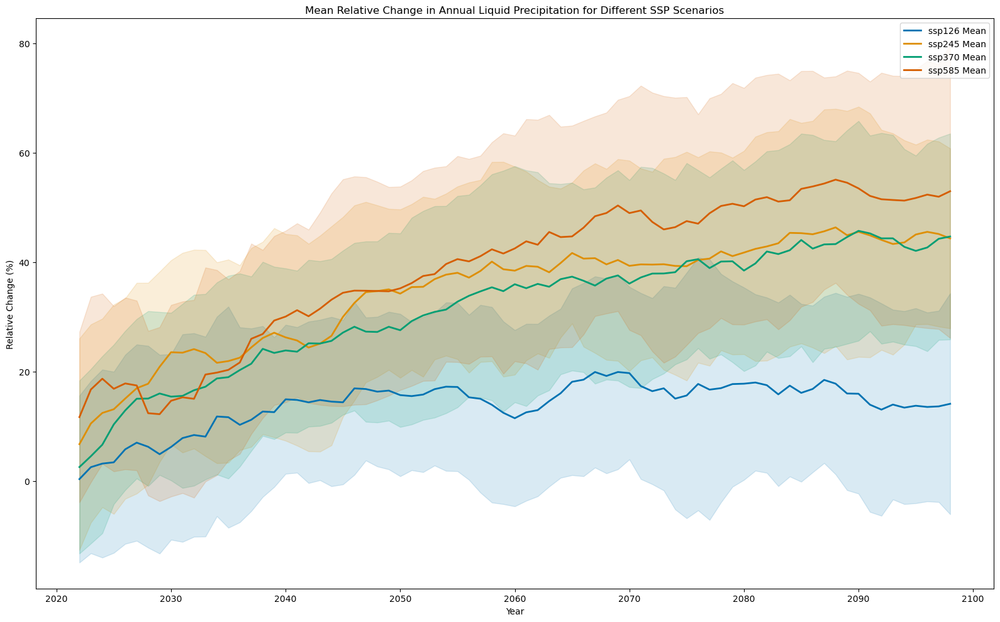

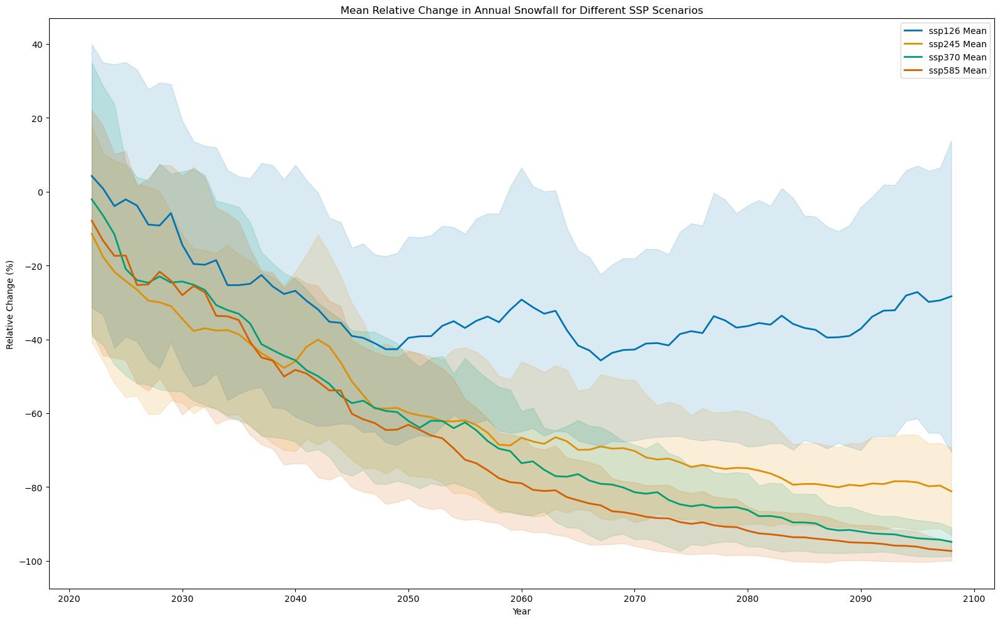

In [28]:
# Function to plot the mean relative change in precipitation
def plot_mean_relative_precipitation(mean_relative_change_dict, ssps, title):
    # Define color palette for SSPs
    ssp_colors = sns.color_palette("colorblind", len(ssps))
    ssp_color_dict = dict(zip(ssps, ssp_colors))

    plt.figure(figsize=(16, 10))

    for ssp in ssps:
        if ssp in mean_relative_change_dict:
            years = mean_relative_change_dict[ssp]['years']
            mean_relative_values = mean_relative_change_dict[ssp]['mean']
            std_dev = mean_relative_change_dict[ssp]['std_dev']
            
            plt.plot(years, mean_relative_values, label=f'{ssp} Mean', color=ssp_color_dict[ssp], linewidth=2)
            plt.fill_between(years, mean_relative_values - std_dev, mean_relative_values + std_dev, color=ssp_color_dict[ssp], alpha=0.15)

    plt.xlabel('Year')
    plt.ylabel('Relative Change (%)')
    plt.title(title)
    plt.legend(loc='upper right')
    plt.grid(False)
    plt.tight_layout()
    plt.show()

# List of SSP scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Calculate the relative change in annual liquid precipitation for each SSP scenario
relative_change_liq_prcp_dict = calculate_relative_change(annual_liq_prcp_dict, ssps)
# Calculate the relative change in annual snowfall for each SSP scenario
relative_change_snowfall_dict = calculate_relative_change(annual_snowfall_dict, ssps)

# Calculate the mean relative change in annual liquid precipitation for each SSP scenario
mean_relative_change_liq_prcp_dict = calculate_mean_relative_change(annual_liq_prcp_dict, ssps)
# Calculate the mean relative change in annual snowfall for each SSP scenario
mean_relative_change_snowfall_dict = calculate_mean_relative_change(annual_snowfall_dict, ssps)

# Plot the mean relative change in annual liquid precipitation for different SSP scenarios
plot_mean_relative_precipitation(mean_relative_change_liq_prcp_dict, ssps, 'Mean Relative Change in Annual Liquid Precipitation for Different SSP Scenarios')
# Plot the mean relative change in annual snowfall for different SSP scenarios
plot_mean_relative_precipitation(mean_relative_change_snowfall_dict, ssps, 'Mean Relative Change in Annual Snowfall for Different SSP Scenarios')

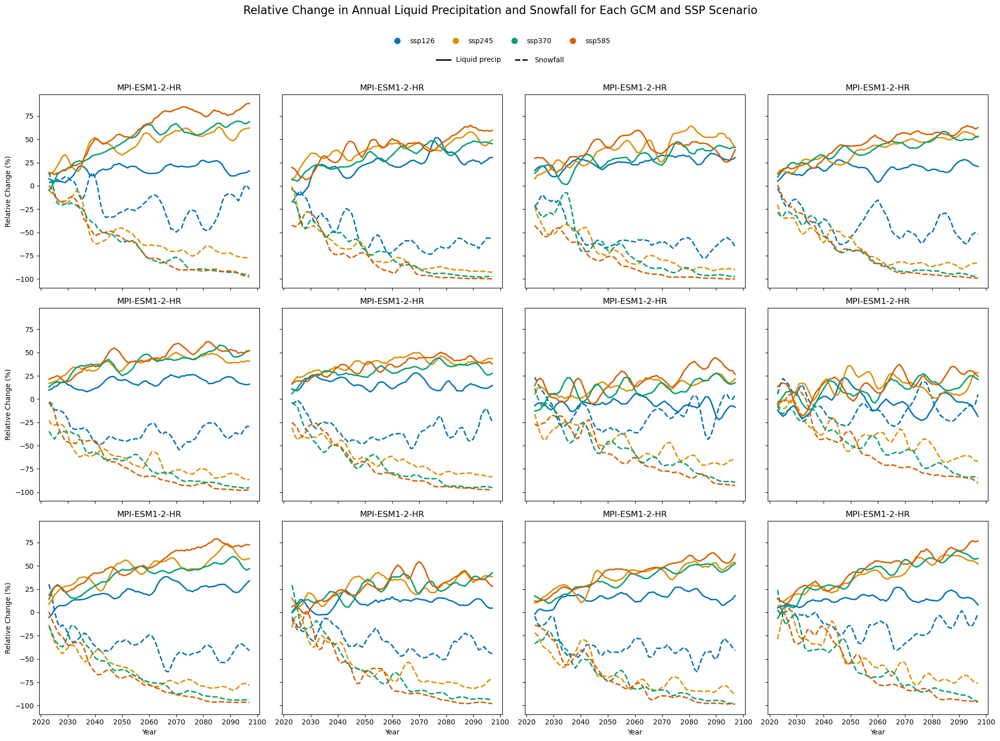

In [29]:
# Function to plot the relative change in total liquid precipitation and snowfall for each GCM
def plot_relative_prcp_components(relative_change_liq_prcp_dict, relative_change_snowfall_dict, ssps):
    # Define color palette for SSPs
    ssp_colors = sns.color_palette("colorblind", len(ssps))
    ssp_color_dict = dict(zip(ssps, ssp_colors))

    # Create a 2x5 grid for plotting
    fig, axes = plt.subplots(3, 4, figsize=(20, 15), sharex=True, sharey=True)
    axes = axes.flatten()

    for idx, gcm in enumerate(gcm_list):
        ax = axes[idx]

        for ssp in ssps:
            if ssp in relative_change_liq_prcp_dict and gcm in relative_change_liq_prcp_dict[ssp]:
                liq_prcp_data = relative_change_liq_prcp_dict[ssp][gcm].rolling(time=5, center=True).mean()
                snowfall_data = relative_change_snowfall_dict[ssp][gcm].rolling(time=5, center=True).mean()

                years = liq_prcp_data['time'].values
                liq_prcp_values = liq_prcp_data.values
                snowfall_values = snowfall_data.values

                ax.plot(years, liq_prcp_values, label=f'{ssp} Liquid', color=ssp_color_dict[ssp], linewidth=2, linestyle='-')
                ax.plot(years, snowfall_values, label=f'{ssp} Snowfall', color=ssp_color_dict[ssp], linewidth=2, linestyle='--')

        for idx, ax in enumerate(axes.flatten()):
            ax.set_title(gcm)
            if idx % 4 == 0:
                ax.set_ylabel('Relative Change (%)')
            if idx >= 8:
                ax.set_xlabel('Year')
            ax.grid(False)

    # Create a combined legend for components and SSPs
    handles_components = [plt.Line2D([0], [0], color='k', linewidth=2, linestyle='-'),
                          plt.Line2D([0], [0], color='k', linewidth=2, linestyle='--')]
    labels_components = ['Liquid precip', 'Snowfall']
    handles_ssps = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=ssp_color_dict[ssp], markersize=10) for ssp in ssps]
    labels_ssps = ssps

    # Position the legend as a combined whole
    legend1 = fig.legend(handles=handles_ssps, labels=labels_ssps, loc='upper center', ncol=len(ssps), bbox_to_anchor=(0.5, 0.945), frameon=False)
    legend2 = fig.legend(handles=handles_components, labels=labels_components, loc='upper center', ncol=2, bbox_to_anchor=(0.5, 0.92), frameon=False)


    # Set legend and layout
    handles, labels = ax.get_legend_handles_labels()
    #fig.legend(handles, labels, loc='upper center', ncol=len(ssps), title='SSP Scenarios')
    plt.suptitle('Relative Change in Annual Liquid Precipitation and Snowfall for Each GCM and SSP Scenario', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.91])
    plt.show()

# Call the plotting function
plot_relative_prcp_components(relative_change_liq_prcp_dict, relative_change_snowfall_dict, ssps)

# 5. Seasonal precip

In [37]:
# Function to calculate seasonal precipitation
def calc_seasonal_prcp(this_ds):
    liq_prcp_on_glacier = this_ds.liq_prcp_on_glacier_monthly
    liq_prcp_off_glacier = this_ds.liq_prcp_off_glacier_monthly
    snowfall_on_glacier = this_ds.snowfall_on_glacier_monthly
    snowfall_off_glacier = this_ds.snowfall_off_glacier_monthly

    # Calculate total precipitation
    total_liq_prcp_m = liq_prcp_off_glacier.sum(dim='rgi_id').dropna(dim='time') + liq_prcp_on_glacier.sum(dim='rgi_id').dropna(dim='time')
    total_snowfall_m = snowfall_on_glacier.sum(dim='rgi_id').dropna(dim='time') + snowfall_off_glacier.sum(dim='rgi_id').dropna(dim='time')
    total_prcp_m = total_liq_prcp_m + total_snowfall_m
    nonzero_sum = total_prcp_m.where(total_prcp_m != 0, drop=True)
    nonzero_sum *= 1e-9

    return nonzero_sum

In [38]:
# Select a year and take the mean precipitation of all GCMs for this year
def season_sliced(keys, dictionary, time):
    new_df = pd.DataFrame()
    for k in keys:
        new = dictionary[k]
        new = new.isel(time=time)
        new = pd.DataFrame(new)
        new_df[k] = new
    new_df['mean'] = new_df.transpose().mean()
    return new_df

In [39]:
# Calculate monthly precipitation for a given precipitation value
def rtype_calc_monthly(keys, dictionary, prcp):
    dataframe = pd.DataFrame()
    for k in keys:
        rtype_gcm = dictionary[k]
        if prcp == 'total_prcp_m':
            rtype = rtype_gcm['liq_prcp_off_glacier_m'] + rtype_gcm['liq_prcp_on_glacier_m'] + rtype_gcm['snowfall_on_glacier_m'] + rtype_gcm['snowfall_off_glacier_m']
        else:
            if prcp.endswith('_m'):
                rtype = rtype_gcm[prcp]
            else:
                rtype = rtype_gcm[prcp + '_monthly']  # Assuming your data keys end with '_monthly'
        rtype = pd.DataFrame(rtype)
        dataframe[k] = rtype
    dataframe['mean'] = dataframe.transpose().mean()
    return dataframe

In [40]:
# Load datasets and calculate seasonal values
all_monthly_dict = {}
season_unroll = {}

for date in date_list:
    for gcm in gcm_list:
        for ssp in ssp_list:
            filepath = f"{base}{date}-gcm_data_{gcm}_{ssp}_compiled_output.nc"
            if os.path.exists(filepath):
                try:
                    ssp_value = xr.open_dataset(filepath)
                    k = f"{gcm}-{ssp}"
                    all_monthly_dict[k] = ssp_value
                    season_unroll[k] = calc_seasonal_prcp(ssp_value)
                    print(f"Loaded and processed: {filepath}")
                except Exception as e:
                    print(f"Failed to process {filepath}: {e}")
            else:
                print(f"File missing: {filepath}")

# Check the contents of all_monthly_dict
print(f"Loaded datasets: {list(all_monthly_dict.keys())}")

Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-06-26-gcm_data_BCC-CSM2-MR_ssp126_compiled_output.nc
Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-06-26-gcm_data_BCC-CSM2-MR_ssp245_compiled_output.nc
Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-06-26-gcm_data_BCC-CSM2-MR_ssp370_compiled_output.nc
Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-06-26-gcm_data_BCC-CSM2-MR_ssp585_compiled_output.nc
Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-06-26-gcm_data_CESM2_ssp126_compiled_output.nc
Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-06-26-gcm_data_CESM2_ssp245_compiled_output.nc
Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-06-26-gcm_data_CESM2_ssp370_compiled_output.nc
Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-06-26-gcm_data_CESM2_ssp585_compiled_output.nc
Loaded and processed: /Users/ziggygoddard/Documents/summer24/2024-06-26-

In [41]:
# Rolling and summing values
dict_roll = {}
rtype_roll = {}
rtype_calc_s = {}
rtype_calc_e = {}

In [42]:
for k in season_unroll.keys():
    season_roll = season_unroll[k].roll(month_2d=n_roll, roll_coords=False)
    dict_roll[k] = season_roll
    rtype_season = all_monthly_dict[k].roll(month_2d=n_roll, roll_coords=True)
    rtype_sum = rtype_season.sum(dim='rgi_id')
    rtype_roll[k] = rtype_sum

    df_key = rtype_roll[k]
    df_m_s = df_key.isel(time=slice(0, 10)).mean(dim='time').to_dataframe() * 1e-9
    df_m_s.columns = [c.replace('_monthly', '_m') for c in df_m_s.columns]
    df_m_s = df_m_s.clip(0)
    rtype_calc_s[k] = df_m_s

    df_m_e = df_key.isel(time=slice(-11, -1)).mean(dim='time').to_dataframe() * 1e-9
    df_m_e.columns = [c.replace('_monthly', '_m') for c in df_m_e.columns]
    df_m_e = df_m_e.clip(0)
    rtype_calc_e[k] = df_m_e

In [43]:
for k in season_unroll.keys():
    season_roll = season_unroll[k].roll(month_2d=n_roll, roll_coords=False)
    dict_roll[k] = season_roll
    rtype_season = all_monthly_dict[k].roll(month_2d=n_roll, roll_coords=True)
    rtype_sum = rtype_season.sum(dim='rgi_id')
    rtype_roll[k] = rtype_sum

    df_key = rtype_roll[k]
    df_m_s = df_key.isel(time=slice(0, 10)).mean(dim='time').to_dataframe() * 1e-9
    df_m_s.columns = [c.replace('_monthly', '_m') for c in df_m_s.columns]
    df_m_s = df_m_s.clip(0)
    rtype_calc_s[k] = df_m_s

    df_m_e = df_key.isel(time=slice(-11, -1)).mean(dim='time').to_dataframe() * 1e-9
    df_m_e.columns = [c.replace('_monthly', '_m') for c in df_m_e.columns]
    df_m_e = df_m_e.clip(0)
    rtype_calc_e[k] = df_m_e

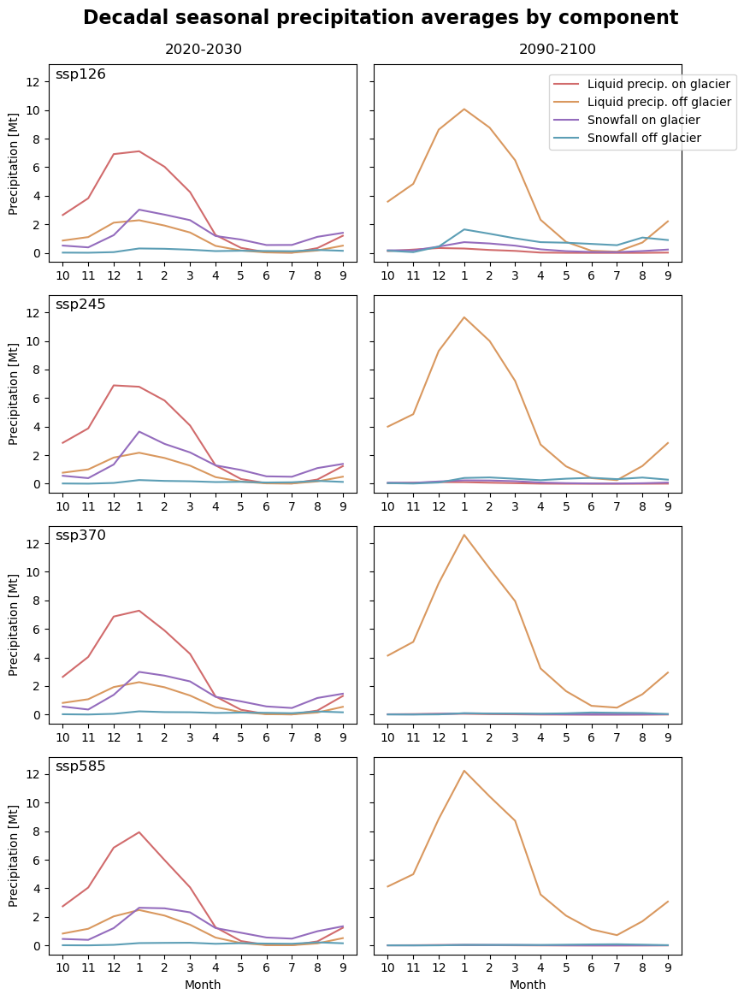

In [44]:
# Function to calculate and visualize seasonal precipitation
def plot_precipitation(axes, prcp_calc_s, prcp_calc_e, index2, season_roll, season_roll2, ssp, row):
    prcp_variables = ['liq_prcp_on_glacier_m', 'liq_prcp_off_glacier_m', 'snowfall_on_glacier_m', 'snowfall_off_glacier_m']
    colors = ['#d16b6c', '#d9985f', '#946cbd', '#5c9eb5']
    labels = ['Liquid precip. on glacier', 'Liquid precip. off glacier', 'Snowfall on glacier', 'Snowfall off glacier']
    s_keys = prcp_calc_s.keys()

    # Store lines for the legend
    lines = []

    for i, r in enumerate(prcp_variables):
        prcp_s = rtype_calc_monthly(s_keys, prcp_calc_s, r)
        prcp_e = rtype_calc_monthly(s_keys, prcp_calc_e, r)
        
        line1, = axes[row, 0].plot(index2, prcp_s['mean'], label=labels[i], color=colors[i])
        line2, = axes[row, 1].plot(index2, prcp_e['mean'], label=labels[i], color=colors[i])
        
        if row == 0:
            lines.append(line1)

    for col in range(2):
        ax = axes[row, col]
        ax.set(xticks=season_roll['month_2d'].values,
               xticklabels=season_roll2['month_2d'].values)

    # Set x-axis labels only for the bottom row
    for ax in axes[-1, :]:
        ax.set_xlabel('Month')

    axes[row, 0].set(ylabel=f'Precipitation [Mt]')

    return lines, labels

# Create a 4x2 grid of subplots
f, axes = plt.subplots(4, 2, figsize=(9, 12), sharey=True)

# Plotting for each SSP
all_lines = []
all_labels = []
for row, ssp in enumerate(ssp_list):
    ssp_keys = [key for key in season_unroll.keys() if ssp in key]
    season_roll2 = season_unroll[ssp_keys[0]].roll(month_2d=n_roll, roll_coords=True)
    index1 = season_unroll[ssp_keys[0]]
    index2 = index1['month_2d']
    
    lines, labels = plot_precipitation(axes, 
                                       {k: v for k, v in rtype_calc_s.items() if ssp in k}, 
                                       {k: v for k, v in rtype_calc_e.items() if ssp in k}, 
                                       index2, season_roll, season_roll2, ssp, row)

    # Add SSP label in the upper left corner of each plot on the left
    if row < 4:
        axes[row, 0].text(0.02, 0.98, ssp, transform=axes[row, 0].transAxes,
                          verticalalignment='top', horizontalalignment='left',
                          fontsize=12)
    
    if row == 0:
        all_lines.extend(lines)
        all_labels.extend(labels)

# Add a single overarching title
plt.suptitle('Decadal seasonal precipitation averages by component', y=0.97, fontsize=16, fontweight='bold')

# Add titles above each column of plots
f.text(0.27, 0.93, '2020-2030', ha='center', va='center', fontsize=12)
f.text(0.73, 0.93, '2090-2100', ha='center', va='center', fontsize=12)

# Add a single legend
axes[0, 1].legend(all_lines, all_labels, loc='upper left', bbox_to_anchor=(0.55, 0.98))

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the title and legend
plt.show()

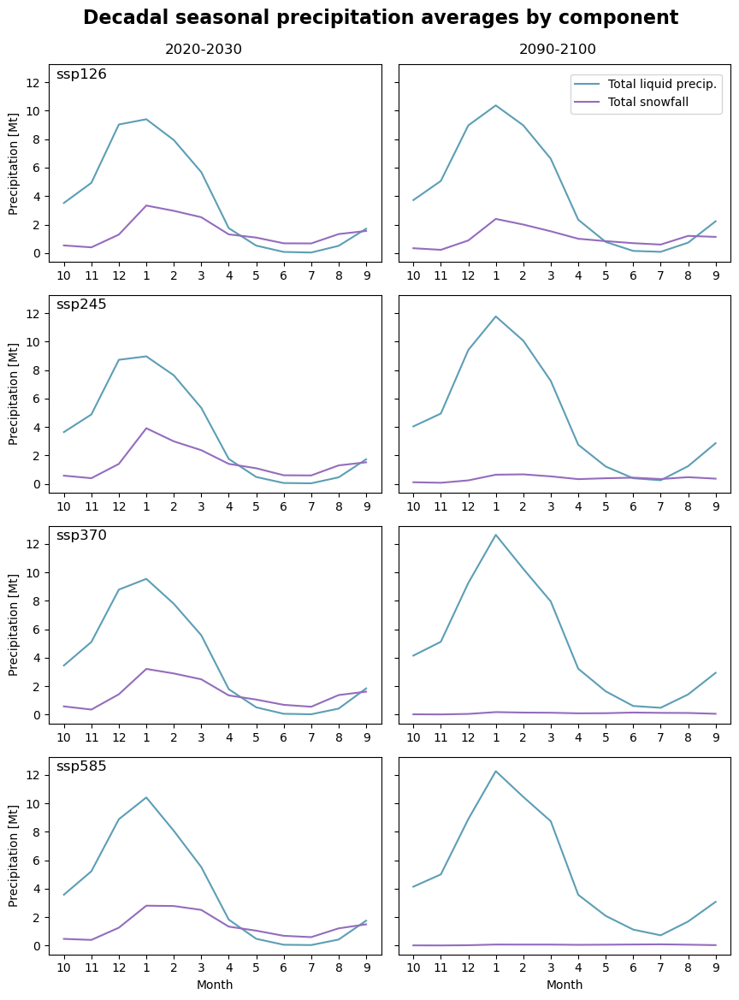

In [46]:
# Function to plot total snowfall and total liquid precipitation
def plot_total_precipitation(axes, prcp_calc_s, prcp_calc_e, index2, season_roll, season_roll2, ssp, row):
    prcp_variables = ['liq_prcp_m', 'snowfall_m']
    colors = ['#5c9eb5', '#946cbd']
    labels = ['Total liquid precip.', 'Total snowfall']
    s_keys = prcp_calc_s.keys()

    # Store lines for the legend
    lines = []

    for i, r in enumerate(prcp_variables):
        if r == 'liq_prcp_m':
            prcp_s = rtype_calc_monthly(s_keys, prcp_calc_s, 'liq_prcp_on_glacier_m') + \
                     rtype_calc_monthly(s_keys, prcp_calc_s, 'liq_prcp_off_glacier_m')
            prcp_e = rtype_calc_monthly(s_keys, prcp_calc_e, 'liq_prcp_on_glacier_m') + \
                     rtype_calc_monthly(s_keys, prcp_calc_e, 'liq_prcp_off_glacier_m')
        elif r == 'snowfall_m':
            prcp_s = rtype_calc_monthly(s_keys, prcp_calc_s, 'snowfall_on_glacier_m') + \
                     rtype_calc_monthly(s_keys, prcp_calc_s, 'snowfall_off_glacier_m')
            prcp_e = rtype_calc_monthly(s_keys, prcp_calc_e, 'snowfall_on_glacier_m') + \
                     rtype_calc_monthly(s_keys, prcp_calc_e, 'snowfall_off_glacier_m')
        
        line1, = axes[row, 0].plot(index2, prcp_s['mean'], label=labels[i], color=colors[i])
        line2, = axes[row, 1].plot(index2, prcp_e['mean'], label=labels[i], color=colors[i])
        
        if row == 0:
            lines.append(line1)

    for col in range(2):
        ax = axes[row, col]
        ax.set(xticks=season_roll['month_2d'].values,
               xticklabels=season_roll2['month_2d'].values)

    # Set x-axis labels only for the bottom row
    for ax in axes[-1, :]:
        ax.set_xlabel('Month')

    axes[row, 0].set(ylabel=f'Precipitation [Mt]')

    return lines, labels

# Create a 4x2 grid of subplots
f, axes = plt.subplots(4, 2, figsize=(9, 12), sharey=True)

# Plotting for each SSP
all_lines = []
all_labels = []
for row, ssp in enumerate(ssp_list):
    ssp_keys = [key for key in season_unroll.keys() if ssp in key]
    season_roll2 = season_unroll[ssp_keys[0]].roll(month_2d=n_roll, roll_coords=True)
    index1 = season_unroll[ssp_keys[0]]
    index2 = index1['month_2d']
    
    lines, labels = plot_total_precipitation(axes, 
                                             {k: v for k, v in rtype_calc_s.items() if ssp in k}, 
                                             {k: v for k, v in rtype_calc_e.items() if ssp in k}, 
                                             index2, season_roll, season_roll2, ssp, row)

    # Add SSP label in the upper left corner of each plot on the left
    if row < 4:
        axes[row, 0].text(0.02, 0.98, ssp, transform=axes[row, 0].transAxes,
                          verticalalignment='top', horizontalalignment='left',
                          fontsize=12)
    
    if row == 0:
        all_lines.extend(lines)
        all_labels.extend(labels)

# Add a single overarching title
plt.suptitle('Decadal seasonal precipitation averages by component', y=0.97, fontsize=16, fontweight='bold')

# Add titles above each column of plots
f.text(0.27, 0.93, '2020-2030', ha='center', va='center', fontsize=12)
f.text(0.73, 0.93, '2090-2100', ha='center', va='center', fontsize=12)

# Add a single legend
axes[0, 1].legend(all_lines, all_labels, loc='upper left', bbox_to_anchor=(0.5, 0.98))

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the title and legend
plt.show()

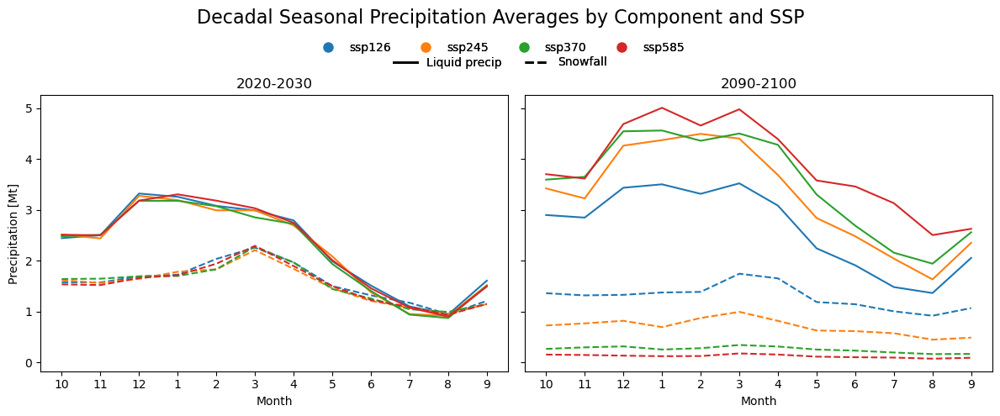

In [26]:
# Plotting function
def plot_total_precipitation(ax, prcp_calc, index2, season_roll, season_roll2, ssp, colors, decade):
    prcp_variables = ['liq_prcp_m', 'snowfall_m']
    linestyles = ['-', '--']
    s_keys = prcp_calc.keys()

    for i, r in enumerate(prcp_variables):
        if r == 'liq_prcp_m':
            prcp = rtype_calc_monthly(s_keys, prcp_calc, 'liq_prcp_on_glacier_m') + \
                   rtype_calc_monthly(s_keys, prcp_calc, 'liq_prcp_off_glacier_m')
        elif r == 'snowfall_m':
            prcp = rtype_calc_monthly(s_keys, prcp_calc, 'snowfall_on_glacier_m') + \
                   rtype_calc_monthly(s_keys, prcp_calc, 'snowfall_off_glacier_m')

        ax.plot(index2, prcp['mean'], label=f'{ssp} {r}', color=colors[ssp], linestyle=linestyles[i])

    ax.set(xticks=season_roll['month_2d'].values,
           xticklabels=season_roll2['month_2d'].values,
           xlabel='Month')

    # Set y-axis label only on the leftmost plot
    if ax == axs[0]:
        ax.set_ylabel('Precipitation [Mt]')
    else:
        ax.set_ylabel('')



# Define colors for SSPs
colors = {'ssp126': '#1f77b4', 'ssp245': '#ff7f0e', 'ssp370': '#2ca02c', 'ssp585': '#d62728'}
# Define linestyles for components
linestyles = ['-', '--']
# Define labels for components
labels_components = ['Liquid precip', 'Snowfall']

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

# Plotting for each SSP and each decade
for ssp in ssp_list:
    ssp_keys = [key for key in season_unroll.keys() if ssp in key]
    season_roll2 = season_unroll[ssp_keys[0]].roll(month_2d=n_roll, roll_coords=True)
    index1 = season_unroll[ssp_keys[0]]
    index2 = index1['month_2d']

    # Plot for the first decade (2020-2030)
    plot_total_precipitation(axs[0], 
                             {k: v for k, v in rtype_calc_s.items() if ssp in k}, 
                             index2, season_roll, season_roll2, ssp, colors, '2020-2030')
    
    # Plot for the second decade (2090-2100)
    plot_total_precipitation(axs[1], 
                             {k: v for k, v in rtype_calc_e.items() if ssp in k}, 
                             index2, season_roll, season_roll2, ssp, colors, '2090-2100')

# Add titles
axs[0].set_title('2020-2030')
axs[1].set_title('2090-2100')

# Create handles and labels for legend
handles_components = [plt.Line2D([0], [0], color='k', linewidth=2, linestyle=ls) for ls in linestyles]
handles_ssps = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[ssp], markersize=10) for ssp in ssp_list]

# Combine legends
legend1 = fig.legend(handles=handles_ssps, labels=ssp_list, loc='upper center', ncol=len(ssp_list), bbox_to_anchor=(0.5, 0.925), frameon=False)
legend2 = fig.legend(handles=handles_components, labels=labels_components, loc='upper center', ncol=2, bbox_to_anchor=(0.5, 0.89), frameon=False)

# Add the legends to the figure
fig.add_artist(legend1)
fig.add_artist(legend2)

# Add a single overarching title
plt.suptitle('Decadal Seasonal Precipitation Averages by Component and SSP', fontsize=16)

plt.tight_layout(rect=[0, 0, 1, 0.92])  # Adjust layout to fit the title and legend
plt.show()


In [ ]:
# # Keeping now for ease of copy + paste
# # Function to calculate seasonal precipitation
# def calc_seasonal_prcp(this_ds):
#     liq_prcp_on_glacier = this_ds.liq_prcp_on_glacier_monthly
#     liq_prcp_off_glacier = this_ds.liq_prcp_off_glacier_monthly
#     snowfall_on_glacier = this_ds.snowfall_on_glacier_monthly
#     snowfall_off_glacier = this_ds.snowfall_off_glacier_monthly

#     # Calculate total precipitation
#     total_liq_prcp_m = liq_prcp_off_glacier.sum(dim='rgi_id').dropna(dim='time') + liq_prcp_on_glacier.sum(dim='rgi_id').dropna(dim='time')
#     total_snowfall_m = snowfall_on_glacier.sum(dim='rgi_id').dropna(dim='time') + snowfall_off_glacier.sum(dim='rgi_id').dropna(dim='time')
#     total_prcp_m = total_liq_prcp_m + total_snowfall_m
#     nonzero_sum = total_prcp_m.where(total_prcp_m != 0, drop=True)
#     nonzero_sum *= 1e-9

#     return nonzero_sum

# # Select a year and take the mean precipitation of all GCMs for this year
# def season_sliced(keys, dictionary, time):
#     new_df = pd.DataFrame()
#     for k in keys:
#         new = dictionary[k]
#         new = new.isel(time=time)
#         new = pd.DataFrame(new)
#         new_df[k] = new
#     new_df['mean'] = new_df.transpose().mean()
#     return new_df

# # Calculate monthly precipitation for a given precipitation value
# def rtype_calc_monthly(keys, dictionary, prcp):
#     dataframe = pd.DataFrame()
#     for k in keys:
#         rtype_gcm = dictionary[k]
#         if prcp == 'total_prcp_m':
#             rtype = rtype_gcm['liq_prcp_off_glacier_m'] + rtype_gcm['liq_prcp_on_glacier_m'] + rtype_gcm['snowfall_on_glacier_m'] + rtype_gcm['snowfall_off_glacier_m']
#         else:
#             if prcp.endswith('_m'):
#                 rtype = rtype_gcm[prcp]
#             else:
#                 rtype = rtype_gcm[prcp + '_monthly']  # Assuming your data keys end with '_monthly'
#         rtype = pd.DataFrame(rtype)
#         dataframe[k] = rtype
#     dataframe['mean'] = dataframe.transpose().mean()
#     return dataframe

# # Load datasets and calculate seasonal values
# all_monthly_dict = {}
# season_unroll = {}

# for date in date_list:
#     for gcm in gcm_list:
#         for ssp in ssp_list:
#             filepath = f"{base}{date}-gcm_data_{gcm}_{ssp}_compiled_output.nc"
#             if os.path.exists(filepath):
#                 try:
#                     ssp_value = xr.open_dataset(filepath)
#                     k = f"{gcm}-{ssp}"
#                     all_monthly_dict[k] = ssp_value
#                     season_unroll[k] = calc_seasonal_prcp(ssp_value)
#                     print(f"Loaded and processed: {filepath}")
#                 except Exception as e:
#                     print(f"Failed to process {filepath}: {e}")
#             else:
#                 print(f"File missing: {filepath}")

# # Check the contents of all_monthly_dict
# print(f"Loaded datasets: {list(all_monthly_dict.keys())}")

# # Rolling and summing values
# dict_roll = {}
# rtype_roll = {}
# rtype_calc_s = {}
# rtype_calc_e = {}

# for k in season_unroll.keys():
#     season_roll = season_unroll[k].roll(month_2d=n_roll, roll_coords=False)
#     dict_roll[k] = season_roll
#     rtype_season = all_monthly_dict[k].roll(month_2d=n_roll, roll_coords=True)
#     rtype_sum = rtype_season.sum(dim='rgi_id')
#     rtype_roll[k] = rtype_sum

#     df_key = rtype_roll[k]
#     df_m_s = df_key.isel(time=slice(0, 10)).mean(dim='time').to_dataframe() * 1e-9
#     df_m_s.columns = [c.replace('_monthly', '_m') for c in df_m_s.columns]
#     df_m_s = df_m_s.clip(0)
#     rtype_calc_s[k] = df_m_s

#     df_m_e = df_key.isel(time=slice(-11, -1)).mean(dim='time').to_dataframe() * 1e-9
#     df_m_e.columns = [c.replace('_monthly', '_m') for c in df_m_e.columns]
#     df_m_e = df_m_e.clip(0)
#     rtype_calc_e[k] = df_m_e

# # Function to calculate and visualize seasonal precipitation
# def plot_precipitation(axes, prcp_calc_s, prcp_calc_e, index2, season_roll, season_roll2, ssp, row):
#     prcp_variables = ['liq_prcp_on_glacier_m', 'liq_prcp_off_glacier_m', 'snowfall_on_glacier_m', 'snowfall_off_glacier_m']
#     colors = ['#d16b6c', '#d9985f', '#946cbd', '#5c9eb5']
#     labels = ['Liquid precip. on glacier', 'Liquid precip. off glacier', 'Snowfall on glacier', 'Snowfall off glacier']
#     s_keys = prcp_calc_s.keys()

#     # Store lines for the legend
#     lines = []

#     for i, r in enumerate(prcp_variables):
#         prcp_s = rtype_calc_monthly(s_keys, prcp_calc_s, r)
#         prcp_e = rtype_calc_monthly(s_keys, prcp_calc_e, r)
        
#         line1, = axes[row, 0].plot(index2, prcp_s['mean'], label=labels[i], color=colors[i])
#         line2, = axes[row, 1].plot(index2, prcp_e['mean'], label=labels[i], color=colors[i])
        
#         if row == 0:
#             lines.append(line1)

#     for col in range(2):
#         ax = axes[row, col]
#         ax.set(xticks=season_roll['month_2d'].values,
#                xticklabels=season_roll2['month_2d'].values)

#     # Set x-axis labels only for the bottom row
#     for ax in axes[-1, :]:
#         ax.set_xlabel('Month')

#     axes[row, 0].set(ylabel=f'Precipitation [Mt]')

#     return lines, labels

# # Create a 4x2 grid of subplots
# f, axes = plt.subplots(4, 2, figsize=(9, 12), sharey=True)

# # Plotting for each SSP
# all_lines = []
# all_labels = []
# for row, ssp in enumerate(ssp_list):
#     ssp_keys = [key for key in season_unroll.keys() if ssp in key]
#     season_roll2 = season_unroll[ssp_keys[0]].roll(month_2d=n_roll, roll_coords=True)
#     index1 = season_unroll[ssp_keys[0]]
#     index2 = index1['month_2d']
    
#     lines, labels = plot_precipitation(axes, 
#                                        {k: v for k, v in rtype_calc_s.items() if ssp in k}, 
#                                        {k: v for k, v in rtype_calc_e.items() if ssp in k}, 
#                                        index2, season_roll, season_roll2, ssp, row)

#     # Add SSP label in the upper left corner of each plot on the left
#     if row < 4:
#         axes[row, 0].text(0.02, 0.98, ssp, transform=axes[row, 0].transAxes,
#                           verticalalignment='top', horizontalalignment='left',
#                           fontsize=12)
    
#     if row == 0:
#         all_lines.extend(lines)
#         all_labels.extend(labels)

# # Add a single overarching title
# plt.suptitle('Decadal seasonal precipitation averages by component', y=0.97, fontsize=16, fontweight='bold')

# # Add titles above each column of plots
# f.text(0.27, 0.93, '2020-2030', ha='center', va='center', fontsize=12)
# f.text(0.73, 0.93, '2090-2100', ha='center', va='center', fontsize=12)

# # Add a single legend
# axes[0, 1].legend(all_lines, all_labels, loc='upper left', bbox_to_anchor=(0.55, 0.98))

# plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the title and legend
# plt.show()

# 6. Data analysis

In [73]:
# Comparison of SSPs
def calculate_summary_statistics(data_array):
    """Calculate mean and standard deviation for a DataArray."""
    mean = data_array.mean(dim='time')
    std_dev = data_array.std(dim='time')
    return mean, std_dev

def calculate_percent_difference(value1, value2):
    """Calculate the percent difference between two values."""
    return (abs(value1 - value2) / ((value1 + value2) / 2)) * 100

def summarize_runoff_statistics(total_annual_runoff_dict, ssps):
    summary_stats = {}
    
    for ssp in ssps:
        ssp_data = [runoff.sel(time=slice(None, '2101')) for scenario, runoff in total_annual_runoff_dict.items() if ssp in scenario]
        if ssp_data:
            combined_runoff = xr.concat(ssp_data, dim='gcm').mean(dim='gcm')
            
            # Calculate summary statistics
            mean_runoff, std_dev_runoff = calculate_summary_statistics(combined_runoff)
            summary_stats[ssp] = {'mean': mean_runoff.values, 'std_dev': std_dev_runoff.values}
    
    # Print summary statistics
    for ssp, stats in summary_stats.items():
        print(f"SSP {ssp}:")
        print(f"  Mean Runoff: {stats['mean']:.2f} km³")
        print(f"  Standard Deviation: {stats['std_dev']:.2f} km³")
        print()
    
    # Calculate percent differences between the mean runoffs
    ssp_combinations = [(ssps[i], ssps[j]) for i in range(len(ssps)) for j in range(i+1, len(ssps))]
    
    for ssp1, ssp2 in ssp_combinations:
        mean1 = summary_stats[ssp1]['mean']
        mean2 = summary_stats[ssp2]['mean']
        percent_diff = calculate_percent_difference(mean1, mean2)
        print(f"Percent difference between SSP {ssp1} and SSP {ssp2}: {percent_diff:.2f}%")

# Assuming total_annual_runoff_dict and ssp_list are already defined
summarize_runoff_statistics(total_annual_runoff_dict, ssp_list)

SSP ssp126:
  Mean Runoff: 67.57 km³
  Standard Deviation: 12.68 km³

SSP ssp245:
  Mean Runoff: 67.41 km³
  Standard Deviation: 11.99 km³

SSP ssp370:
  Mean Runoff: 67.42 km³
  Standard Deviation: 12.40 km³

SSP ssp585:
  Mean Runoff: 68.11 km³
  Standard Deviation: 12.66 km³

Percent difference between SSP ssp126 and SSP ssp245: 0.23%
Percent difference between SSP ssp126 and SSP ssp370: 0.21%
Percent difference between SSP ssp126 and SSP ssp585: 0.79%
Percent difference between SSP ssp245 and SSP ssp370: 0.02%
Percent difference between SSP ssp245 and SSP ssp585: 1.02%
Percent difference between SSP ssp370 and SSP ssp585: 1.01%


In [74]:
# Comparison of SSPs
def calculate_summary_statistics(data_array):
    """Calculate mean and standard deviation for a DataArray."""
    mean = data_array.mean(dim='time')
    std_dev = data_array.std(dim='time')
    return mean, std_dev

def calculate_percent_difference(value1, value2):
    """Calculate the percent difference between two values."""
    return (abs(value1 - value2) / ((value1 + value2) / 2)) * 100

def summarize_runoff_statistics(total_annual_runoff_dict, ssps, decades=None):
    if decades is None:
        decades = [('2020', '2030'), ('2030', '2040'), ('2040', '2050'),
                   ('2050', '2060'), ('2060', '2070'), ('2070', '2080'), ('2080', '2090'), ('2090', '2100')]
    
    summary_stats = {}
    decade_stats = {}
    
    for decade in decades:
        decade_stats[decade] = {}
        for ssp in ssps:
            ssp_data = [runoff.sel(time=slice(decade[0], decade[1])) for scenario, runoff in total_annual_runoff_dict.items() if ssp in scenario]
            
            if ssp_data:
                combined_runoff = xr.concat(ssp_data, dim='gcm').mean(dim='gcm')
                
                # Calculate summary statistics
                mean_runoff, std_dev_runoff = calculate_summary_statistics(combined_runoff)
                decade_stats[decade][ssp] = {'mean': mean_runoff.values.item(), 'std_dev': std_dev_runoff.values.item()}
    
    # Print summary statistics for each decade and SSP
    for decade, stats in decade_stats.items():
        print(f"Decade {decade}:")
        for ssp, values in stats.items():
            print(f"  SSP {ssp}:")
            print(f"    Mean Runoff: {values['mean']:.2f} km³")
            print(f"    Standard Deviation: {values['std_dev']:.2f} km³")
        print()
    
    # Calculate percent differences between SSPs for each decade
    ssp_combinations = [(ssps[i], ssps[j]) for i in range(len(ssps)) for j in range(i+1, len(ssps))]
    
    for decade in decades:
        print(f"Percent differences for Decade {decade}:")
        for ssp1, ssp2 in ssp_combinations:
            mean1 = decade_stats[decade][ssp1]['mean']
            mean2 = decade_stats[decade][ssp2]['mean']
            percent_diff = calculate_percent_difference(mean1, mean2)
            print(f"  Percent difference between SSP {ssp1} and SSP {ssp2}: {percent_diff:.2f}%")
        print()
    
    return decade_stats

# Example usage assuming total_annual_runoff_dict and ssp_list are already defined
decade_stats = summarize_runoff_statistics(total_annual_runoff_dict, ssp_list)


Decade ('2020', '2030'):
  SSP ssp126:
    Mean Runoff: 98.73 km³
    Standard Deviation: 11.96 km³
  SSP ssp245:
    Mean Runoff: 97.09 km³
    Standard Deviation: 9.27 km³
  SSP ssp370:
    Mean Runoff: 98.16 km³
    Standard Deviation: 8.99 km³
  SSP ssp585:
    Mean Runoff: 99.04 km³
    Standard Deviation: 12.60 km³

Decade ('2030', '2040'):
  SSP ssp126:
    Mean Runoff: 67.94 km³
    Standard Deviation: 3.18 km³
  SSP ssp245:
    Mean Runoff: 69.04 km³
    Standard Deviation: 4.13 km³
  SSP ssp370:
    Mean Runoff: 69.63 km³
    Standard Deviation: 3.47 km³
  SSP ssp585:
    Mean Runoff: 68.06 km³
    Standard Deviation: 2.74 km³

Decade ('2040', '2050'):
  SSP ssp126:
    Mean Runoff: 63.87 km³
    Standard Deviation: 1.72 km³
  SSP ssp245:
    Mean Runoff: 64.29 km³
    Standard Deviation: 1.07 km³
  SSP ssp370:
    Mean Runoff: 64.03 km³
    Standard Deviation: 1.65 km³
  SSP ssp585:
    Mean Runoff: 64.55 km³
    Standard Deviation: 1.05 km³

Decade ('2050', '2060'):
  SSP s

In [75]:
import numpy as np

def calculate_summary_statistics(runoff):
    mean_runoff = runoff.mean(dim='time')
    std_dev_runoff = runoff.std(dim='time')
    return mean_runoff, std_dev_runoff

def calculate_percent_difference(min_val, max_val):
    return ((max_val - min_val) / min_val) * 100

def summarize_gcm_statistics(total_annual_runoff_dict, ssps, gcms):
    for ssp in ssps:
        print(f"\nSSP {ssp} GCM Comparison:")
        ssp_data = {gcm: runoff.sel(time=slice(None, '2101')) for scenario, runoff in total_annual_runoff_dict.items() if ssp in scenario for gcm in gcms if gcm in scenario}
        
        # Calculate summary statistics for each GCM
        gcm_stats = {}
        for gcm, runoff in ssp_data.items():
            mean_runoff, std_dev_runoff = calculate_summary_statistics(runoff)
            gcm_stats[gcm] = {'runoff': runoff, 'mean': mean_runoff.values, 'std_dev': std_dev_runoff.values}
            # print(f"GCM {gcm}:")
            # print(f"  Mean Runoff: {mean_runoff.values:.2f} km³")
            # print(f"  Standard Deviation: {std_dev_runoff.values:.2f} km³")
            # print()

        # Calculate the percent difference between the highest and lowest mean runoffs for each decade
        decades = [(2020, 2030), (2030, 2040), (2040, 2050), (2050, 2060), (2060, 2070), (2070, 2080), (2080, 2090), (2090, 2100)]
        for start, end in decades:
            print(f"Decade {start}-{end}:")
            decade_means = {}
            for gcm, stats in gcm_stats.items():
                decade_runoff = stats['runoff'].sel(time=slice(str(start), str(end)))
                decade_mean = decade_runoff.mean(dim='time').values
                decade_means[gcm] = decade_mean

            min_gcm = min(decade_means, key=decade_means.get)
            max_gcm = max(decade_means, key=decade_means.get)
            min_mean = decade_means[min_gcm]
            max_mean = decade_means[max_gcm]
            percent_diff = calculate_percent_difference(min_mean, max_mean)

            print(f"  Lowest-value GCM ({min_gcm}): {min_mean:.2f} km³")
            print(f"  Highest-value GCM ({max_gcm}): {max_mean:.2f} km³")
            print(f"  Percent difference: {percent_diff:.2f}%\n")

# Assuming total_annual_runoff_dict, ssp_list, and gcm_list are already defined
summarize_gcm_statistics(total_annual_runoff_dict, ssp_list, gcm_list)



SSP ssp126 GCM Comparison:
Decade 2020-2030:
  Lowest-value GCM (INM-CM5-0): 87.29 km³
  Highest-value GCM (CESM2): 105.17 km³
  Percent difference: 20.49%

Decade 2030-2040:
  Lowest-value GCM (NorESM2-MM): 62.72 km³
  Highest-value GCM (BCC-CSM2-MR): 71.74 km³
  Percent difference: 14.37%

Decade 2040-2050:
  Lowest-value GCM (INM-CM4-8): 57.67 km³
  Highest-value GCM (BCC-CSM2-MR): 68.06 km³
  Percent difference: 18.02%

Decade 2050-2060:
  Lowest-value GCM (INM-CM4-8): 56.30 km³
  Highest-value GCM (MRI-ESM2-0): 66.95 km³
  Percent difference: 18.93%

Decade 2060-2070:
  Lowest-value GCM (INM-CM4-8): 56.53 km³
  Highest-value GCM (MRI-ESM2-0): 67.42 km³
  Percent difference: 19.27%

Decade 2070-2080:
  Lowest-value GCM (INM-CM5-0): 53.17 km³
  Highest-value GCM (CESM2): 65.30 km³
  Percent difference: 22.81%

Decade 2080-2090:
  Lowest-value GCM (INM-CM4-8): 57.48 km³
  Highest-value GCM (MPI-ESM1-2-HR): 67.17 km³
  Percent difference: 16.86%

Decade 2090-2100:
  Lowest-value GCM 

In [124]:
# Statistical summary comparing GCMs for every SSP

import numpy as np

def summarize_gcm_statistics(total_annual_runoff_dict, ssps, gcms):
    for ssp in ssps:
        print(f"\nSSP {ssp} GCM Comparison:")
        ssp_data = {gcm: runoff.sel(time=slice(None, '2101')) for scenario, runoff in total_annual_runoff_dict.items() if ssp in scenario for gcm in gcms if gcm in scenario}
        
        # Calculate summary statistics for each GCM
        gcm_stats = {}
        for gcm, runoff in ssp_data.items():
            mean_runoff, std_dev_runoff = calculate_summary_statistics(runoff)
            gcm_stats[gcm] = {'mean': mean_runoff.values, 'std_dev': std_dev_runoff.values}
            print(f"GCM {gcm}:")
            print(f"  Mean Runoff: {mean_runoff.values:.2f} km³")
            print(f"  Standard Deviation: {std_dev_runoff.values:.2f} km³")
            print()

        # Find the GCM with the lowest and highest mean runoff
        gcm_means = {gcm: stats['mean'] for gcm, stats in gcm_stats.items()}
        min_gcm = min(gcm_means, key=gcm_means.get)
        max_gcm = max(gcm_means, key=gcm_means.get)
        min_mean = gcm_means[min_gcm]
        max_mean = gcm_means[max_gcm]

        # Calculate the percent difference between the lowest and highest mean runoffs
        percent_diff = calculate_percent_difference(min_mean, max_mean)
        print(f"Percent difference between the lowest-value GCM ({min_gcm}) and the highest-value GCM ({max_gcm}): {percent_diff:.2f}%")

# Assuming total_annual_runoff_dict, ssp_list, and gcm_list are already defined
summarize_gcm_statistics(total_annual_runoff_dict, ssp_list, gcm_list)


SSP ssp126 GCM Comparison:
GCM BCC-CSM2-MR:
  Mean Runoff: 71.06 km³
  Standard Deviation: 14.16 km³

GCM CESM2:
  Mean Runoff: 68.72 km³
  Standard Deviation: 16.35 km³

GCM CESM2-WACCM:
  Mean Runoff: 68.72 km³
  Standard Deviation: 16.35 km³

GCM EC-Earth3:
  Mean Runoff: 67.73 km³
  Standard Deviation: 13.97 km³

GCM FGOALS-f3-L:
  Mean Runoff: 68.75 km³
  Standard Deviation: 16.63 km³

GCM GFDL-ESM4:
  Mean Runoff: 68.36 km³
  Standard Deviation: 16.83 km³

GCM INM-CM4-8:
  Mean Runoff: 61.50 km³
  Standard Deviation: 14.05 km³

GCM INM-CM5-0:
  Mean Runoff: 62.87 km³
  Standard Deviation: 13.69 km³

GCM MRI-ESM2-0:
  Mean Runoff: 70.56 km³
  Standard Deviation: 12.92 km³

GCM NorESM2-MM:
  Mean Runoff: 65.95 km³
  Standard Deviation: 14.76 km³

Percent difference between the lowest-value GCM (INM-CM4-8) and the highest-value GCM (BCC-CSM2-MR): 15.56%

SSP ssp245 GCM Comparison:
GCM BCC-CSM2-MR:
  Mean Runoff: 73.08 km³
  Standard Deviation: 12.88 km³

GCM CESM2:
  Mean Runoff: 6

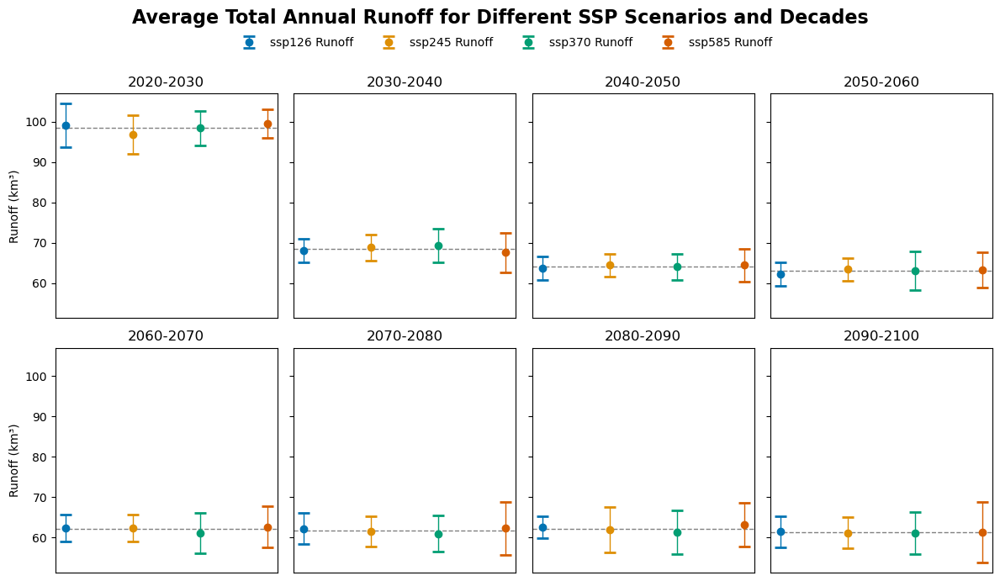

In [76]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # Import seaborn for automatic color palette

# Function to calculate mean and standard deviation
def calculate_summary_statistics(runoff_data):
    mean_runoff = runoff_data.mean(dim='time')
    std_dev_runoff = runoff_data.std(dim='time')
    return mean_runoff, std_dev_runoff

# Function to plot GCM statistics per decade
def plot_gcm_statistics_per_decade(total_annual_runoff_dict, ssps, gcms, line_width=0.5):
    decades = [(2020, 2030), (2030, 2040), (2040, 2050), (2050, 2060), (2060, 2070), (2070, 2080), (2080, 2090), (2090, 2100)]
    
    fig, axes = plt.subplots(2, 4, figsize=(12, 7), sharex=True, sharey=True)  # Adjusted for 8 plots
    axes = axes.flatten()  # Flatten the axes array for easier indexing
    
    # Automatic color palette for SSP scenarios
    colors = sns.color_palette('colorblind', n_colors=len(ssps))
    
    for j, (start, end) in enumerate(decades):
        ax = axes[j]
        
        # Collect means of SSP values for the decade
        ssp_means = []
        for ssp in ssps:
            ssp_data = {gcm: runoff.sel(time=slice(str(start), str(end))) for scenario, runoff in total_annual_runoff_dict.items() if ssp in scenario for gcm in gcms if gcm in scenario}
            gcm_means = []
            for gcm, runoff in ssp_data.items():
                mean_runoff, std_dev_runoff = calculate_summary_statistics(runoff)
                gcm_means.append(mean_runoff.values)
            ssp_means.append(np.mean(gcm_means))
        
        # Plot the mean of SSP values as a horizontal dashed line
        ax.axhline(np.mean(ssp_means), color='gray', linestyle='--', linewidth=1)
        
        for i, ssp in enumerate(ssps):
            ssp_data = {gcm: runoff.sel(time=slice(str(start), str(end))) for scenario, runoff in total_annual_runoff_dict.items() if ssp in scenario for gcm in gcms if gcm in scenario}
            
            # Calculate summary statistics for each GCM within the decade
            gcm_means = []
            gcm_std_devs = []
            for gcm, runoff in ssp_data.items():
                mean_runoff, std_dev_runoff = calculate_summary_statistics(runoff)
                gcm_means.append(mean_runoff.values)
                gcm_std_devs.append(std_dev_runoff.values)
            
            # Calculate the overall mean and standard deviation
            overall_mean = np.mean(gcm_means)
            overall_std_dev = np.std(gcm_means)
            
            # Plot the mean and std deviation for the decade
            ax.errorbar(i, overall_mean, yerr=overall_std_dev, fmt='o', capsize=5, capthick=2, elinewidth=1, markerfacecolor=colors[i], markeredgecolor=colors[i], ecolor=colors[i], label=f'{ssp} Runoff')
            
            # Find the GCM with the lowest and highest mean runoff
            min_mean = np.min(gcm_means)
            max_mean = np.max(gcm_means)
        
        ax.set_title(f'{start}-{end}')
        if j % 4 == 0:  # Only set y labels for the leftmost column
            ax.set_ylabel('Runoff (km³)')
        ax.tick_params(axis='x', bottom=False, labelbottom=False)  # Remove x ticks and labels
    
    plt.suptitle('Average Total Annual Runoff for Different SSP Scenarios and Decades', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.94])
    plt.legend(loc='upper center', bbox_to_anchor=(-1.2, 2.43), ncol=len(ssps), frameon=False)
    plt.show()

# Assuming total_annual_runoff_dict, ssp_list, and gcm_list are already defined
plot_gcm_statistics_per_decade(total_annual_runoff_dict, ssp_list, gcm_list, line_width=0.5)


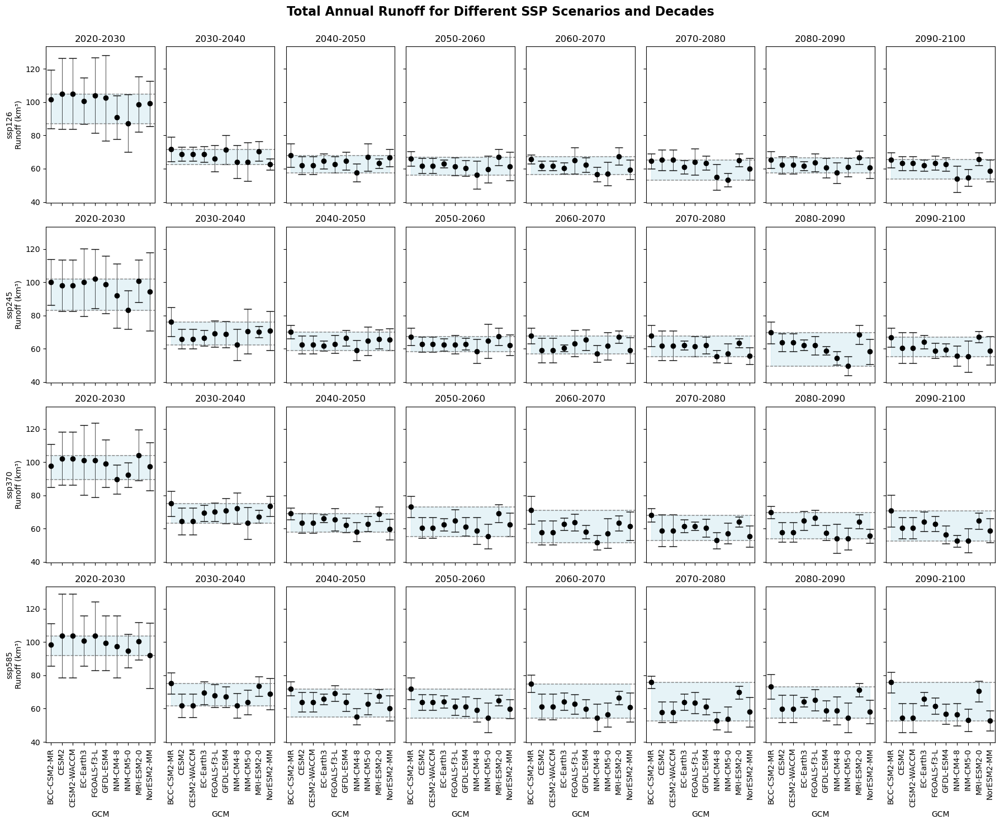

In [125]:
import matplotlib.pyplot as plt

def plot_gcm_statistics_per_decade(total_annual_runoff_dict, ssps, gcms, point_color='black', line_color='black', line_width=0.5):
    decades = [(2020, 2030), (2030, 2040), (2040, 2050), (2050, 2060), (2060, 2070), (2070, 2080), (2080, 2090), (2090, 2100)]
    
    fig, axes = plt.subplots(len(ssps), len(decades), figsize=(18, 15), sharex=True, sharey=True)
    
    for i, ssp in enumerate(ssps):
        ssp_data = {gcm: runoff.sel(time=slice(None, '2101')) for scenario, runoff in total_annual_runoff_dict.items() if ssp in scenario for gcm in gcms if gcm in scenario}
        
        for j, (start, end) in enumerate(decades):
            ax = axes[i, j]
            # Calculate summary statistics for each GCM within the decade
            gcm_stats = {}
            for gcm, runoff in ssp_data.items():
                decade_runoff = runoff.sel(time=slice(str(start), str(end)))
                mean_runoff, std_dev_runoff = calculate_summary_statistics(decade_runoff)
                gcm_stats[gcm] = {'mean': mean_runoff.values, 'std_dev': std_dev_runoff.values}
            
            # Plotting the statistics for the decade
            gcm_names = list(gcm_stats.keys())
            means = [gcm_stats[gcm]['mean'] for gcm in gcm_names]
            std_devs = [gcm_stats[gcm]['std_dev'] for gcm in gcm_names]

            ax.errorbar(gcm_names, means, yerr=std_devs, fmt='o', capsize=5, capthick=1, elinewidth=line_width, markerfacecolor=point_color, markeredgecolor=point_color, ecolor=line_color, label='GCM Runoff')
            
           # ax.errorbar(gcm_names, means, yerr=std_devs, fmt='o', capsize=5, capthick=2, elinewidth=1, label='GCM Runoff')
            ax.set_title(f'{start}-{end}')
            if i == len(ssps) - 1:
                ax.set_xlabel('GCM')
            if j == 0:
                ax.set_ylabel(f'{ssp}\nRunoff (km³)')
            ax.tick_params(axis='x', rotation=90)
            
            # Find the GCM with the lowest and highest mean runoff
            gcm_means = {gcm: stats['mean'] for gcm, stats in gcm_stats.items()}
            min_gcm = min(gcm_means, key=gcm_means.get)
            max_gcm = max(gcm_means, key=gcm_means.get)
            min_mean = gcm_means[min_gcm]
            max_mean = gcm_means[max_gcm]
            
            # Add dashed horizontal lines for lowest and highest GCM
            ax.axhline(y=min_mean, color='gray', linestyle='--', linewidth=1)
            ax.axhline(y=max_mean, color='gray', linestyle='--', linewidth=1)
            
            # Add light blue fill between the lines
            ax.fill_between(gcm_names, min_mean, max_mean, color='lightblue', alpha=0.3)
    
    plt.suptitle('Total Annual Runoff for Different SSP Scenarios and Decades', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()

# Assuming total_annual_runoff_dict, ssp_list, and gcm_list are already defined
plot_gcm_statistics_per_decade(total_annual_runoff_dict, ssp_list, gcm_list, point_color='black', line_color='black', line_width=0.5)


# Symposium figures

## Quito

/var/folders/q4/r3b9pkcx6bn5djf1vxnj5xkr0000gn/T/ipykernel_12260/565980221.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontsize=26)
/var/folders/q4/r3b9pkcx6bn5djf1vxnj5xkr0000gn/T/ipykernel_12260/565980221.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontsize=26)
/var/folders/q4/r3b9pkcx6bn5djf1vxnj5xkr0000gn/T/ipykernel_12260/565980221.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontsize=26)
/var/folders/q4/r3b9pkcx6bn5djf1vxnj5xkr0000gn/T/ipykernel_12260/565980221.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.se

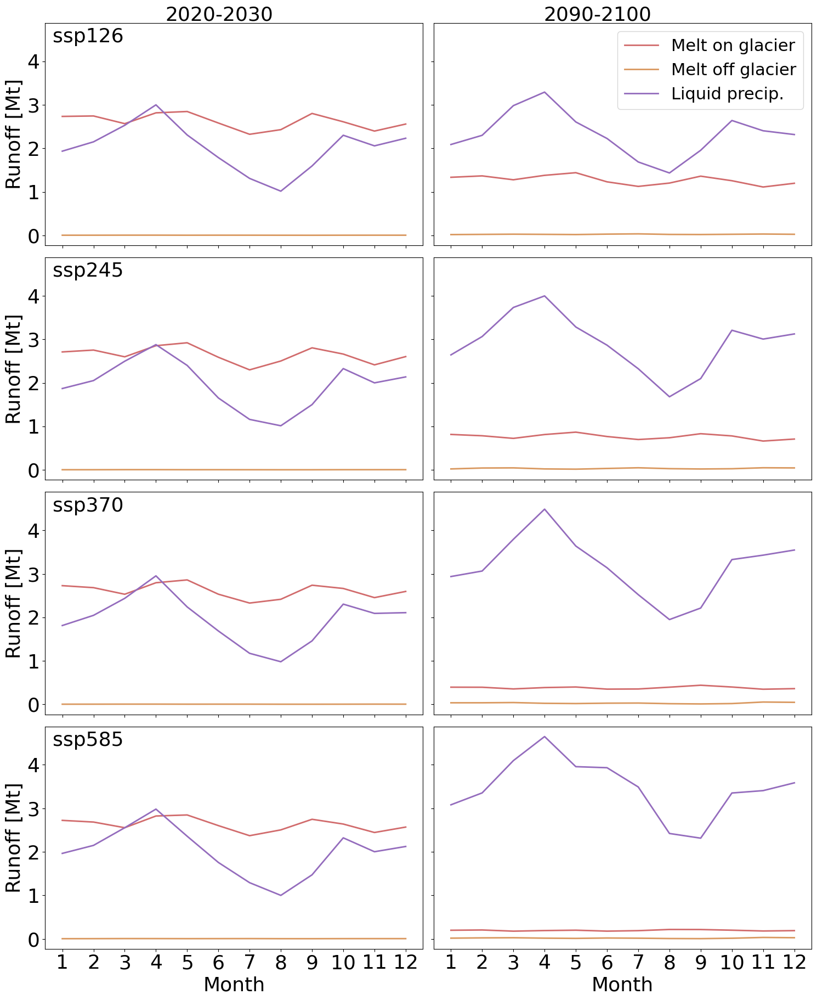

In [100]:
import matplotlib.pyplot as plt
import xarray as xr
from matplotlib.ticker import FuncFormatter

# Define a custom formatter function to display integers
def integer_formatter(x, pos):
    return f'{int(x)}'

# Function to calculate and visualize runoff
def plot_runoff(axes, rtype_calc_s, rtype_calc_e, index2, season_roll, season_roll2, ssp, row):
    runoff_variables = ['melt_on_glacier_m', 'melt_off_glacier_m', 'total_liq_prcp_m']
    colors = ['#d16b6c', '#d9985f', '#946cbd']
    labels = ['Melt on glacier', 'Melt off glacier', 'Liquid precip.']
    s_keys = rtype_calc_s.keys()

    # Store lines for the legend
    lines = []

    for i, r in enumerate(runoff_variables):
        if r == 'total_liq_prcp_m':
            runoff_s = rtype_calc_monthly(s_keys, rtype_calc_s, 'total_liq_prcp_m')
            runoff_e = rtype_calc_monthly(s_keys, rtype_calc_e, 'total_liq_prcp_m')
        else:
            runoff_s = rtype_calc_monthly(s_keys, rtype_calc_s, r)
            runoff_e = rtype_calc_monthly(s_keys, rtype_calc_e, r)
        
        line1, = axes[row, 0].plot(index2, runoff_s['mean'], label=labels[i], color=colors[i], linewidth=2)
        line2, = axes[row, 1].plot(index2, runoff_e['mean'], label=labels[i], color=colors[i], linewidth=2)
        
        if row == 0:
            lines.append(line1)

    for col in range(2):
        ax = axes[row, col]
        ax.tick_params(axis='x', direction='out', labelbottom=row == len(axes) - 1)  # Place x ticks inside and show labels only on the bottom row
        ax.set_xticks(season_roll['month_2d'].values)
        if row == len(axes) - 1:  # Only add x tick labels on the bottom row
            ax.set_xticklabels(season_roll2['month_2d'].values, fontsize=26)
        else:
            ax.set_xticklabels([])
            
        ax.tick_params(axis='y', direction='out', labelleft=col == 0)  # Show y tick labels only on the leftmost plots
        if col == 0:
            ax.set_yticklabels(ax.get_yticks(), fontsize=26)
            ax.yaxis.set_major_formatter(FuncFormatter(integer_formatter))  # Set y-axis formatter

    # Set x-axis labels only for the bottom row
    for ax in axes[-1, :]:
        ax.set_xlabel('Month', fontsize=26)
    axes[row, 0].set_ylabel('Runoff [Mt]', fontsize=26)

    return lines, labels

# Create a 4x2 grid of subplots
fig, axes = plt.subplots(4, 2, figsize=(15, 18), sharey=True)

# Plotting for each SSP
all_lines = []
all_labels = []
for row, ssp in enumerate(ssp_list):
    ssp_keys = [key for key in season_unroll.keys() if ssp in key]
    season_roll2 = season_unroll[ssp_keys[0]].roll(month_2d=n_roll, roll_coords=True)
    index1 = season_unroll[ssp_keys[0]]
    index2 = index1['month_2d']
    
    lines, labels = plot_runoff(axes, 
                                {k: v for k, v in rtype_calc_s.items() if ssp in k}, 
                                {k: v for k, v in rtype_calc_e.items() if ssp in k}, 
                                index2, season_roll, season_roll2, ssp, row)

    # Add SSP label in the upper left corner of each plot on the left
    if row < 4:
        axes[row, 0].text(0.02, 0.98, ssp, transform=axes[row, 0].transAxes,
                          verticalalignment='top', horizontalalignment='left',
                          fontsize=26)
    
    if row == 0:
        all_lines.extend(lines)
        all_labels.extend(labels)

# Add titles above each column of plots
fig.text(0.27, 1, '2020-2030', ha='center', va='center', fontsize=26)
fig.text(0.73, 1, '2090-2100', ha='center', va='center', fontsize=26)

# Add a single legend
axes[0, 1].legend(all_lines, all_labels, loc='upper right', fontsize=22)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 1])  # Adjust layout to fit the titles and legend
plt.savefig("Quito_seasonal.pdf", format='pdf', bbox_inches='tight')  # Save as EPS for vector format
plt.show()


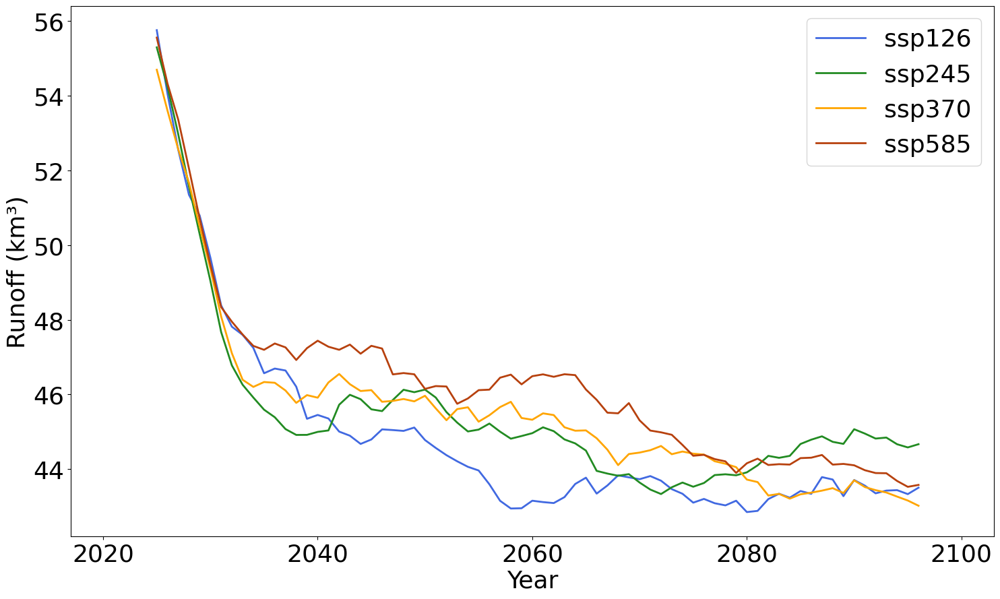

In [137]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np

ssp_colors = {
    'ssp126': 'royalblue',
    'ssp245': 'forestgreen', 
    'ssp370': 'orange',  
    'ssp585': '#b7410e' 
}

# Function to plot total annual runoff with rolling average
def plot_total_annual_runoff(total_annual_runoff_dict, ssps, tick_label_size=26):
    fig, ax = plt.subplots(figsize=(15, 9))

    for ssp in ssps:
        ssp_data = [runoff.sel(time=slice(None, '2101')) for scenario, runoff in total_annual_runoff_dict.items() if ssp in scenario]
        if ssp_data:
            combined_runoff = xr.concat(ssp_data, dim='gcm').mean(dim='gcm')
            # Apply 10-year rolling average
            combined_runoff_smooth = combined_runoff.rolling(time=10, center=True).mean()
            combined_runoff_smooth.plot(ax=ax, label=ssp, linewidth=2, color=ssp_colors[ssp])
    
    ax.set_xlabel('Year', fontsize=26)
    ax.set_ylabel('Runoff (km³)', fontsize=26)
    ax.legend(fontsize=26)

    # Set tick label sizes and show years in increments of 20
    years = combined_runoff_smooth['time'].values
    ax.set_xticks(np.arange(min(years), max(years) + 1, 20))
    ax.tick_params(axis='both', which='major', labelsize=tick_label_size)

    # Add spatial buffer to the x-axis
    ax.set_xlim(min(years) - 3, max(years) + 3)

    # Use tight layout to ensure there's no extra whitespace
    fig.tight_layout(rect=[0, 0, 1, 1])

    # Save as EPS for vector format with bbox_inches='tight' to remove extra whitespace
    plt.savefig("Quito_total_runoff.pdf", format='pdf', bbox_inches='tight')
    plt.show()

# Example usage
plot_total_annual_runoff(total_annual_runoff_dict, ssp_list, tick_label_size=26)


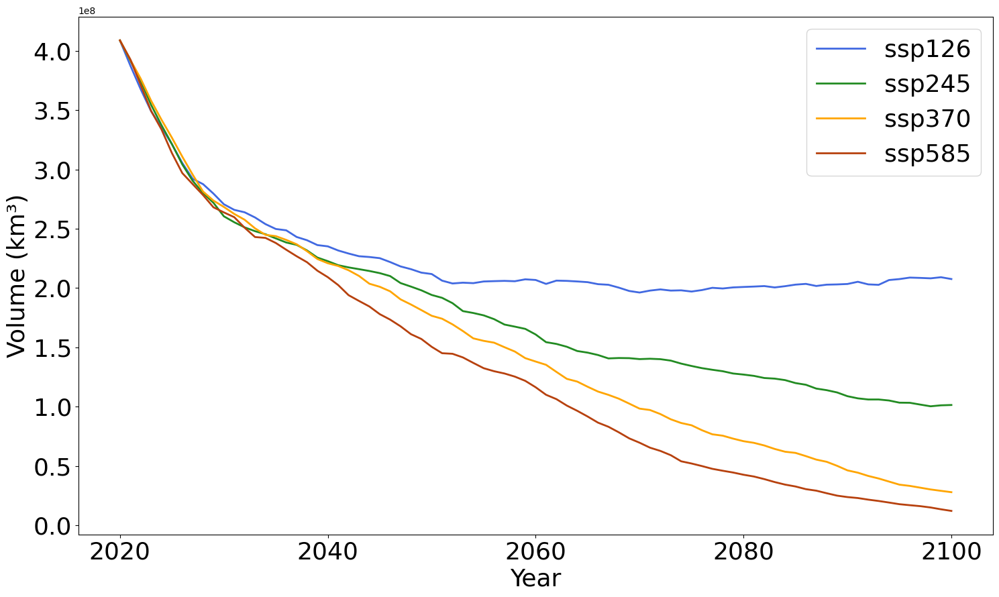

In [38]:
import matplotlib.pyplot as plt
import numpy as np

ssp_colors = {
    'ssp126': 'royalblue',
    'ssp245': 'forestgreen', 
    'ssp370': 'orange',  
    'ssp585': '#b7410e' 
}

# Plotting the mean volume over time for each SSP
plt.figure(figsize=(15, 9))

for ssp, volume in mean_volume.items():
    years = volume['time'].values
    mean_values = volume.sum(dim='rgi_id').values  # Summing over 'rgi_id' to get total volume
    
    # Slice the data to stop at 2100
    mask = years <= 2100
    years = years[mask]
    mean_values = mean_values[mask]
    
    plt.plot(years, mean_values, label=f'{ssp}', linewidth=2, color=ssp_colors[ssp])

plt.xlabel('Year', fontsize=26)
plt.ylabel('Volume (km³)', fontsize=26)
plt.legend(fontsize=26)

# Set tick label sizes and show years in increments of 20
plt.xticks(np.arange(min(years), max(years) + 1, 20), fontsize=26)
plt.yticks(fontsize=26)

# Use tight layout to ensure there's no extra whitespace
plt.tight_layout(rect=[0, 0, 1, 1])

# Save as EPS for vector format with bbox_inches='tight' to remove extra whitespace
plt.savefig("Quito_volume.pdf", format='pdf', bbox_inches='tight')
plt.show()


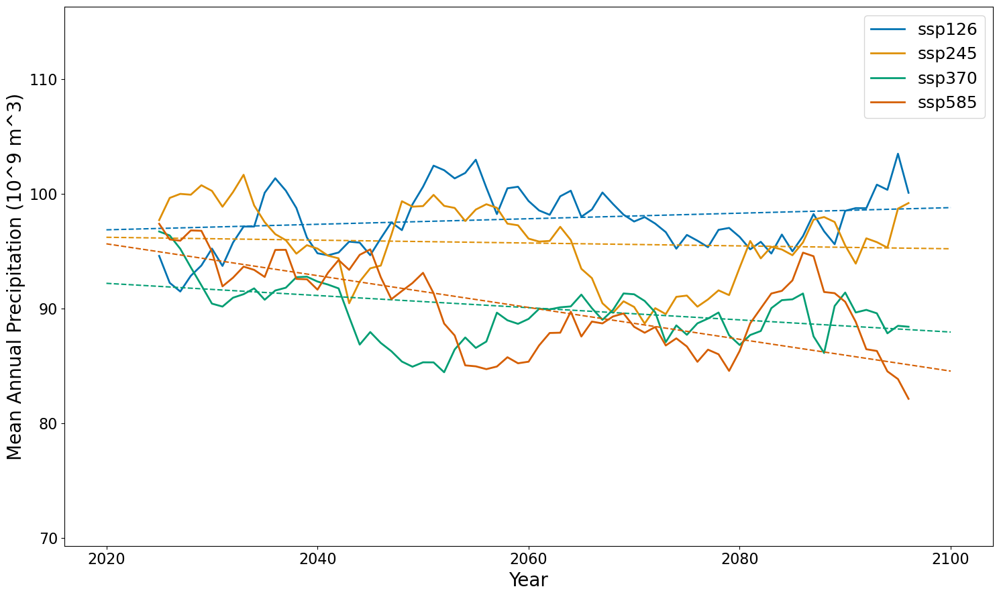

In [354]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Function to plot mean annual precipitation change with best fit lines
def plot_mean_annual_prcp(mean_annual_prcp, ssps, window=10, tick_label_size=16):
    # Define color palette for SSPs
    ssp_colors = sns.color_palette("colorblind", len(ssps))
    ssp_color_dict = dict(zip(ssps, ssp_colors))

    # Create figure and axis
    fig, ax = plt.subplots(figsize=(15, 9))

    all_values = []

    for ssp in ssps:
        # Get original data
        prcp_data = mean_annual_prcp[ssp]
        years = prcp_data['time'].values
        prcp_values = prcp_data.values

        # Calculate best fit line using original data
        if len(years) > 1 and len(prcp_values) > 1:  # Ensure there is enough data
            fit = np.polyfit(years, prcp_values, 1)
            fit_fn = np.poly1d(fit)
            ax.plot(years, fit_fn(years), linestyle='--', color=ssp_color_dict[ssp], linewidth=1.5)

        # Smooth data for visualization
        prcp_data_smoothed = prcp_data.rolling(time=window, center=True).mean()
        smoothed_years = prcp_data_smoothed['time'].values
        smoothed_values = prcp_data_smoothed.values

        ax.plot(smoothed_years, smoothed_values, label=ssp, color=ssp_color_dict[ssp], linewidth=2)
        all_values.extend(smoothed_values)

    # Calculate y-axis limits with buffer
    min_value = np.nanmin(all_values)
    max_value = np.nanmax(all_values)
    y_buffer = (max_value - min_value) * 0.6
    ax.set_ylim(min_value - y_buffer, max_value + y_buffer)

    # Set tick label sizes and show years in increments of 20
    ax.set_xticks(np.arange(min(years), max(years) + 1, 20))
    ax.tick_params(axis='both', which='major', labelsize=tick_label_size)

    # Plot formatting
    ax.set_xlabel('Year', fontsize=20)
    ax.set_ylabel('Mean Annual Precipitation (10^9 m^3)', fontsize=20)
    # ax.set_title('Mean Annual Precipitation Across GCMs for Each SSP Scenario', fontsize=22)
    ax.legend(fontsize=18)
    ax.grid(False)

    # Use tight layout to ensure there's no extra whitespace
    fig.tight_layout(rect=[0, 0, 1, 1])

    # Show plot
    plt.show()

# Calculate the mean annual precipitation for each SSP scenario
mean_annual_prcp = calculate_mean_annual_prcp(annual_prcp_dict, ssp_list)

# Call the plotting function
plot_mean_annual_prcp(mean_annual_prcp, ssp_list)


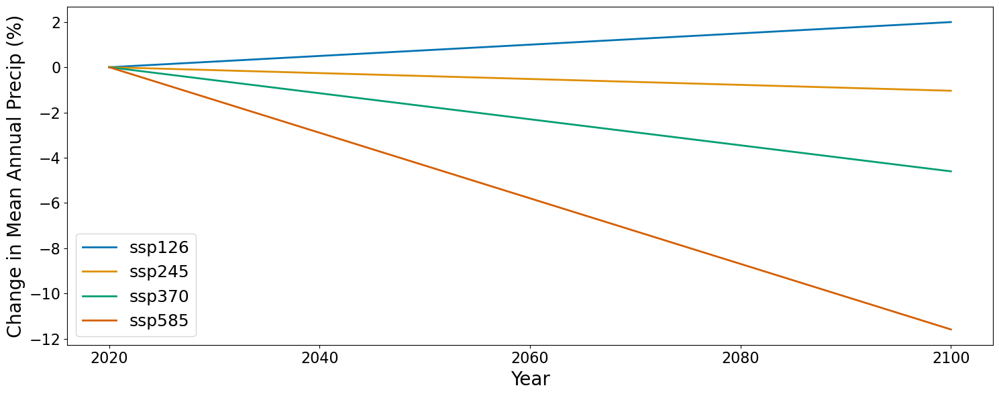

In [363]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Function to plot mean annual precipitation change with best fit lines as percentage change
def plot_best_fit_prcp_percentage_change(mean_annual_prcp, ssps, tick_label_size=16):
    # Define color palette for SSPs
    ssp_colors = sns.color_palette("colorblind", len(ssps))
    ssp_color_dict = dict(zip(ssps, ssp_colors))

    # Create figure and axis
    fig, ax = plt.subplots(figsize=(15, 6))

    for ssp in ssps:
        # Get original data
        prcp_data = mean_annual_prcp[ssp]
        years = prcp_data['time'].values
        prcp_values = prcp_data.values

        # Calculate best fit line using original data
        if len(years) > 1 and len(prcp_values) > 1:  # Ensure there is enough data
            fit = np.polyfit(years, prcp_values, 1)
            fit_fn = np.poly1d(fit)

            # Calculate percentage change
            initial_value = fit_fn(years[0])
            pct_change = ((fit_fn(years) - initial_value) / initial_value) * 100

            ax.plot(years, pct_change, linestyle='-', label=ssp, color=ssp_color_dict[ssp], linewidth=2)

    # Set tick label sizes and show years in increments of 20
    ax.set_xticks(np.arange(min(years), max(years) + 1, 20))
    ax.tick_params(axis='both', which='major', labelsize=tick_label_size)

    # Plot formatting
    ax.set_xlabel('Year', fontsize=20)
    ax.set_ylabel('Change in Mean Annual Precip (%)', fontsize=20)
    ax.legend(fontsize=18)
    ax.grid(False)

    # Use tight layout to ensure there's no extra whitespace
    fig.tight_layout(rect=[0, 0, 1, 1])

    # Show plot
    plt.show()

# Calculate the mean annual precipitation for each SSP scenario
mean_annual_prcp = calculate_mean_annual_prcp(annual_prcp_dict, ssp_list)

# Call the plotting function
plot_best_fit_prcp_percentage_change(mean_annual_prcp, ssp_list)


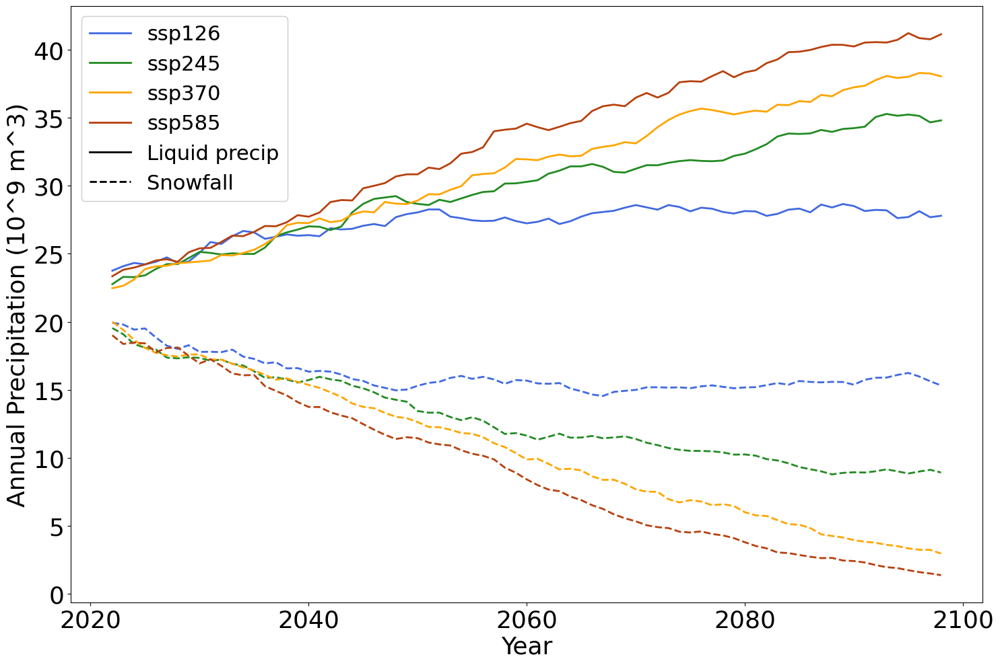

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.patheffects as path_effects

ssp_colors = {
    'ssp126': 'royalblue',
    'ssp245': 'forestgreen', 
    'ssp370': 'orange',  
    'ssp585': '#b7410e' 
}

# Function to plot the mean annual precipitation components without standard deviation for each SSP scenario
def plot_mean_annual_prcp_components(mean_annual_liq_prcp_dict, mean_annual_snowfall_dict, ssps, window=5, tick_label_size=26):
    fig, ax = plt.subplots(figsize=(15, 10))

    for ssp in ssps:
        if ssp in mean_annual_liq_prcp_dict and ssp in mean_annual_snowfall_dict:
            mean_liq_prcp = mean_annual_liq_prcp_dict[ssp].rolling(time=window, center=True).mean()
            mean_snowfall = mean_annual_snowfall_dict[ssp].rolling(time=window, center=True).mean()
            
            years = mean_liq_prcp['time'].values
            liq_prcp_values = mean_liq_prcp.values
            snowfall_values = mean_snowfall.values

            ax.plot(years, liq_prcp_values, label=f'{ssp} Liquid precip', color=ssp_colors[ssp], linestyle='-', linewidth=2)
            ax.plot(years, snowfall_values, label=f'{ssp} Snowfall', color=ssp_colors[ssp], linestyle='--', linewidth=2)

    # Set tick label sizes and show years in increments of 20
    ax.set_xticks(np.arange(min(years), max(years) + 1, 20))
    ax.tick_params(axis='both', which='major', labelsize=tick_label_size)

    # Plot formatting
    ax.set_xlabel('Year', fontsize=26)
    ax.set_ylabel('Annual Precipitation (10^9 m^3)', fontsize=26)
    
    # Create handles and labels for SSPs and precipitation components
    handles_ssps = [plt.Line2D([0], [0], label=ssp, color=ssp_colors[ssp], linewidth=2) for ssp in ssps]
    labels_ssps = ssps

    handles_components = [plt.Line2D([0], [0], color='black', linestyle='-', linewidth=2),
                          plt.Line2D([0], [0], color='black', linestyle='--', linewidth=2)]
    labels_components = ['Liquid precip', 'Snowfall']

    # Combine the handles and labels
    handles_combined = handles_ssps + handles_components
    labels_combined = labels_ssps + labels_components

    # Create a single legend
    legend = ax.legend(handles=handles_combined, labels=labels_combined, loc='upper left', fontsize=22, frameon=True)

    ax.add_artist(legend)

    # Customize the plot
    ax.grid(False)

    # Use tight layout to ensure there's no extra whitespace
    fig.tight_layout(rect=[0, 0, 1, 1])

    # Save as PDF for vector format with bbox_inches='tight' to remove extra whitespace
    plt.savefig("Quito_prcp_components.pdf", format='pdf', bbox_inches='tight', dpi=300)

    # Show plot
    plt.show()

# List of SSP scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Calculate the mean annual precipitation components across GCMs for each SSP scenario
mean_annual_liq_prcp_dict, std_annual_liq_prcp_dict, mean_annual_snowfall_dict, std_annual_snowfall_dict = calculate_mean_std_annual_components(annual_liq_prcp_dict, annual_snowfall_dict, gcm_list, ssps)

# Plot the mean annual precipitation components for each SSP scenario
plot_mean_annual_prcp_components(mean_annual_liq_prcp_dict, mean_annual_snowfall_dict, ssps)


## La Paz

/var/folders/q4/r3b9pkcx6bn5djf1vxnj5xkr0000gn/T/ipykernel_12260/3995387991.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontsize=26)
/var/folders/q4/r3b9pkcx6bn5djf1vxnj5xkr0000gn/T/ipykernel_12260/3995387991.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontsize=26)
/var/folders/q4/r3b9pkcx6bn5djf1vxnj5xkr0000gn/T/ipykernel_12260/3995387991.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontsize=26)
/var/folders/q4/r3b9pkcx6bn5djf1vxnj5xkr0000gn/T/ipykernel_12260/3995387991.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  a

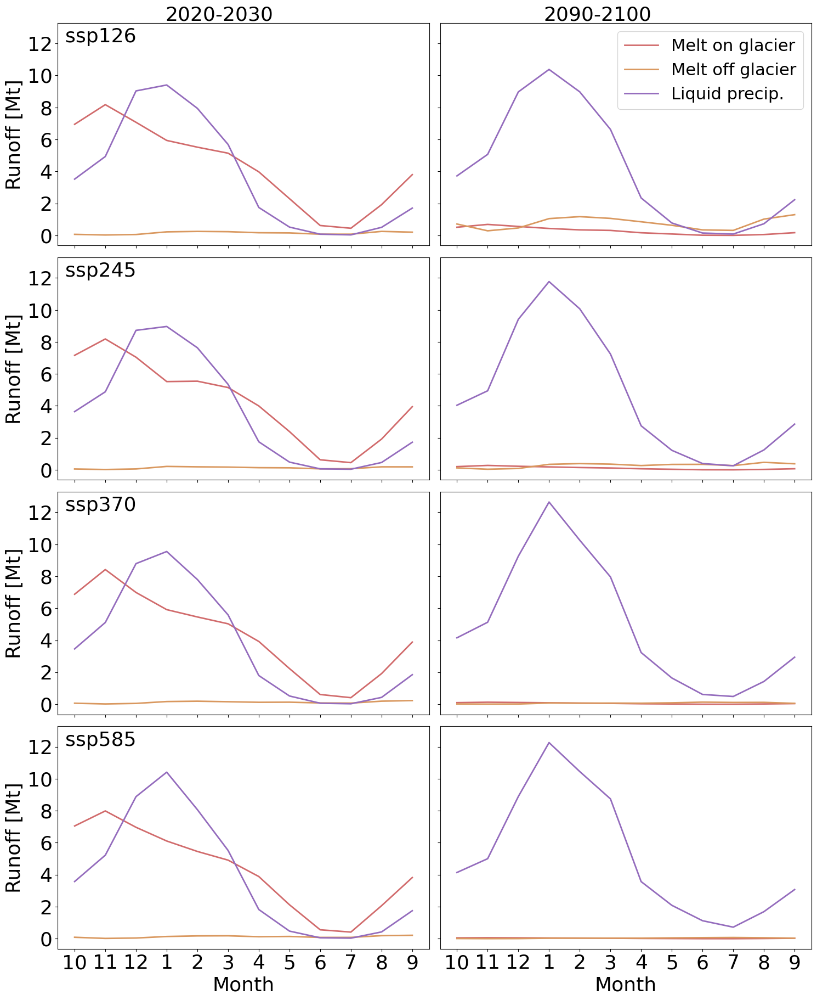

In [91]:
import matplotlib.pyplot as plt
import xarray as xr
from matplotlib.ticker import FuncFormatter

# Define a custom formatter function to display integers
def integer_formatter(x, pos):
    return f'{int(x)}'

# Function to calculate and visualize runoff
def plot_runoff(axes, rtype_calc_s, rtype_calc_e, index2, season_roll, season_roll2, ssp, row):
    runoff_variables = ['melt_on_glacier_m', 'melt_off_glacier_m', 'total_liq_prcp_m']
    colors = ['#d16b6c', '#d9985f', '#946cbd']
    labels = ['Melt on glacier', 'Melt off glacier', 'Liquid precip.']
    s_keys = rtype_calc_s.keys()

    # Store lines for the legend
    lines = []

    for i, r in enumerate(runoff_variables):
        if r == 'total_liq_prcp_m':
            runoff_s = rtype_calc_monthly(s_keys, rtype_calc_s, 'total_liq_prcp_m')
            runoff_e = rtype_calc_monthly(s_keys, rtype_calc_e, 'total_liq_prcp_m')
        else:
            runoff_s = rtype_calc_monthly(s_keys, rtype_calc_s, r)
            runoff_e = rtype_calc_monthly(s_keys, rtype_calc_e, r)
        
        line1, = axes[row, 0].plot(index2, runoff_s['mean'], label=labels[i], color=colors[i], linewidth=2)
        line2, = axes[row, 1].plot(index2, runoff_e['mean'], label=labels[i], color=colors[i], linewidth=2)
        
        if row == 0:
            lines.append(line1)

    for col in range(2):
        ax = axes[row, col]
        ax.tick_params(axis='x', direction='out', labelbottom=row == len(axes) - 1)  # Place x ticks inside and show labels only on the bottom row
        ax.set_xticks(season_roll['month_2d'].values)
        if row == len(axes) - 1:  # Only add x tick labels on the bottom row
            ax.set_xticklabels(season_roll2['month_2d'].values, fontsize=26)
        else:
            ax.set_xticklabels([])
            
        ax.tick_params(axis='y', direction='out', labelleft=col == 0)  # Show y tick labels only on the leftmost plots
        if col == 0:
            ax.set_yticklabels(ax.get_yticks(), fontsize=26)
            ax.yaxis.set_major_formatter(FuncFormatter(integer_formatter))  # Set y-axis formatter

    # Set x-axis labels only for the bottom row
    for ax in axes[-1, :]:
        ax.set_xlabel('Month', fontsize=26)
    axes[row, 0].set_ylabel('Runoff [Mt]', fontsize=26)

    return lines, labels

# Create a 4x2 grid of subplots
fig, axes = plt.subplots(4, 2, figsize=(15, 18), sharey=True)

# Plotting for each SSP
all_lines = []
all_labels = []
for row, ssp in enumerate(ssp_list):
    ssp_keys = [key for key in season_unroll.keys() if ssp in key]
    season_roll2 = season_unroll[ssp_keys[0]].roll(month_2d=n_roll, roll_coords=True)
    index1 = season_unroll[ssp_keys[0]]
    index2 = index1['month_2d']
    
    lines, labels = plot_runoff(axes, 
                                {k: v for k, v in rtype_calc_s.items() if ssp in k}, 
                                {k: v for k, v in rtype_calc_e.items() if ssp in k}, 
                                index2, season_roll, season_roll2, ssp, row)

    # Add SSP label in the upper left corner of each plot on the left
    if row < 4:
        axes[row, 0].text(0.02, 0.98, ssp, transform=axes[row, 0].transAxes,
                          verticalalignment='top', horizontalalignment='left',
                          fontsize=26)
    
    if row == 0:
        all_lines.extend(lines)
        all_labels.extend(labels)

# Add titles above each column of plots
fig.text(0.27, 1, '2020-2030', ha='center', va='center', fontsize=26)
fig.text(0.73, 1, '2090-2100', ha='center', va='center', fontsize=26)

# Add a single legend
axes[0, 1].legend(all_lines, all_labels, loc='upper right', fontsize=22)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 1])  # Adjust layout to fit the titles and legend
plt.savefig("LaPaz_seasonal.pdf", format='pdf', bbox_inches='tight')  # Save as EPS for vector format
plt.show()

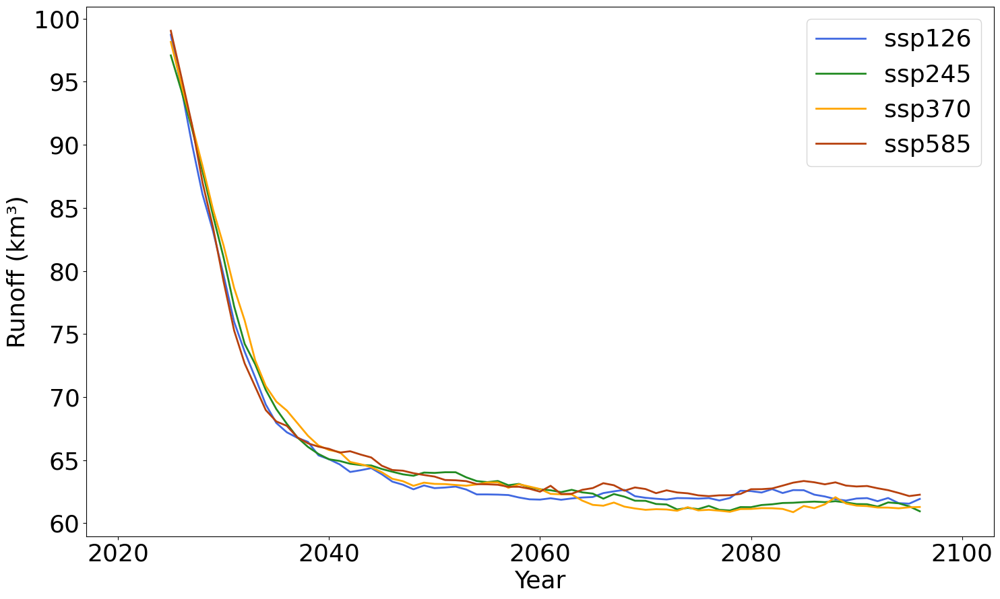

In [106]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np

ssp_colors = {
    'ssp126': 'royalblue',
    'ssp245': 'forestgreen', 
    'ssp370': 'orange',  
    'ssp585': '#b7410e' 
}

# Function to plot total annual runoff with rolling average
def plot_total_annual_runoff(total_annual_runoff_dict, ssps, tick_label_size=26):
    fig, ax = plt.subplots(figsize=(15, 9))

    for ssp in ssps:
        ssp_data = [runoff.sel(time=slice(None, '2101')) for scenario, runoff in total_annual_runoff_dict.items() if ssp in scenario]
        if ssp_data:
            combined_runoff = xr.concat(ssp_data, dim='gcm').mean(dim='gcm')
            # Apply 10-year rolling average
            combined_runoff_smooth = combined_runoff.rolling(time=10, center=True).mean()
            combined_runoff_smooth.plot(ax=ax, label=ssp, linewidth=2, color=ssp_colors[ssp])
    
    ax.set_xlabel('Year', fontsize=26)
    ax.set_ylabel('Runoff (km³)', fontsize=26)
    ax.legend(fontsize=26)

    # Set tick label sizes and show years in increments of 20
    years = combined_runoff_smooth['time'].values
    ax.set_xticks(np.arange(min(years), max(years) + 1, 20))
    ax.tick_params(axis='both', which='major', labelsize=tick_label_size)

    # Add spatial buffer to the x-axis
    ax.set_xlim(min(years) - 3, max(years) + 3)

    # Use tight layout to ensure there's no extra whitespace
    fig.tight_layout(rect=[0, 0, 1, 1])

    # Save as EPS for vector format with bbox_inches='tight' to remove extra whitespace
    plt.savefig("LaPaz_total_runoff.pdf", format='pdf', bbox_inches='tight')
    plt.show()

# Example usage
plot_total_annual_runoff(total_annual_runoff_dict, ssp_list, tick_label_size=26)


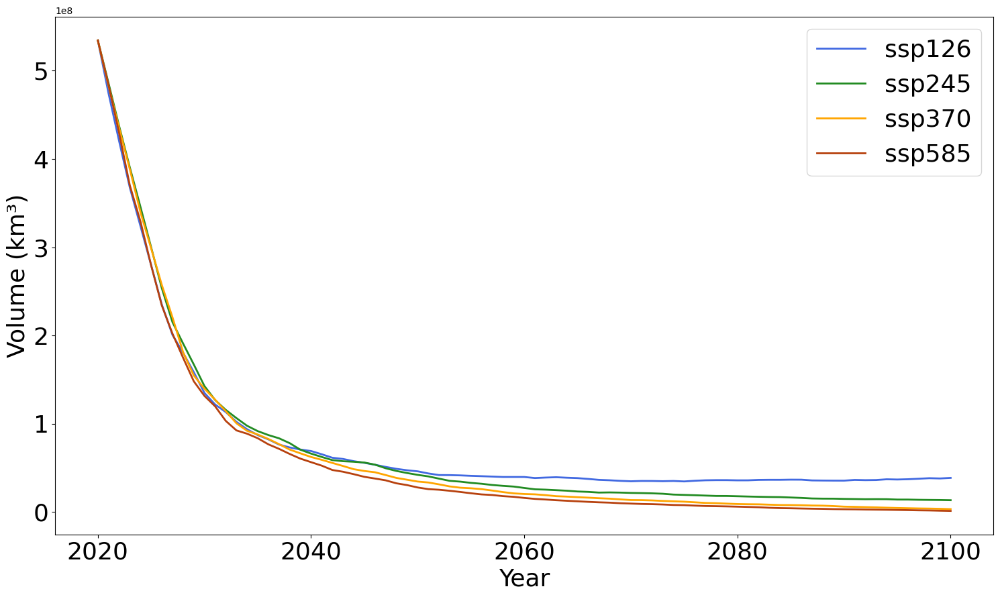

In [84]:
import matplotlib.pyplot as plt
import numpy as np

ssp_colors = {
    'ssp126': 'royalblue',
    'ssp245': 'forestgreen', 
    'ssp370': 'orange',  
    'ssp585': '#b7410e' 
}

# Plotting the mean volume over time for each SSP
plt.figure(figsize=(15, 9))

for ssp, volume in mean_volume.items():
    years = volume['time'].values
    mean_values = volume.sum(dim='rgi_id').values  # Summing over 'rgi_id' to get total volume
    
    # Slice the data to stop at 2100
    mask = years <= 2100
    years = years[mask]
    mean_values = mean_values[mask]
    
    plt.plot(years, mean_values, label=f'{ssp}', linewidth=2, color=ssp_colors[ssp])

plt.xlabel('Year', fontsize=26)
plt.ylabel('Volume (km³)', fontsize=26)
plt.legend(fontsize=26)

# Set tick label sizes and show years in increments of 20
plt.xticks(np.arange(min(years), max(years) + 1, 20), fontsize=26)
plt.yticks(fontsize=26)

# Use tight layout to ensure there's no extra whitespace
plt.tight_layout(rect=[0, 0, 1, 1])

# Save as EPS for vector format with bbox_inches='tight' to remove extra whitespace
plt.savefig("LaPaz_volume.pdf", format='pdf', bbox_inches='tight')
plt.show()


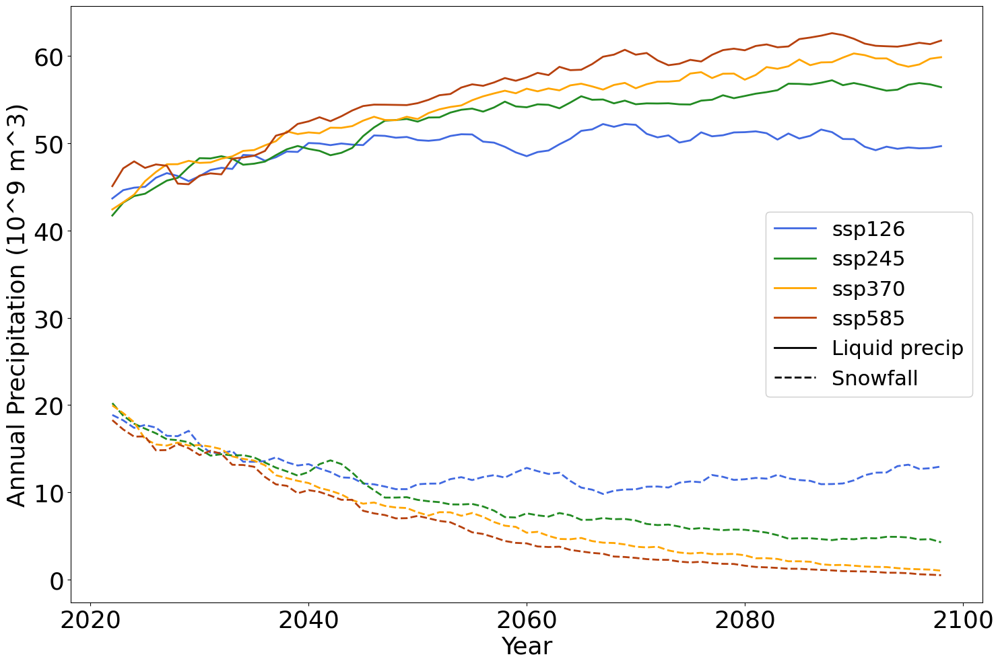

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.patheffects as path_effects

ssp_colors = {
    'ssp126': 'royalblue',
    'ssp245': 'forestgreen', 
    'ssp370': 'orange',  
    'ssp585': '#b7410e' 
}

# Function to plot the mean annual precipitation components without standard deviation for each SSP scenario
def plot_mean_annual_prcp_components(mean_annual_liq_prcp_dict, mean_annual_snowfall_dict, ssps, window=5, tick_label_size=26):
    fig, ax = plt.subplots(figsize=(15, 10))

    for ssp in ssps:
        if ssp in mean_annual_liq_prcp_dict and ssp in mean_annual_snowfall_dict:
            mean_liq_prcp = mean_annual_liq_prcp_dict[ssp].rolling(time=window, center=True).mean()
            mean_snowfall = mean_annual_snowfall_dict[ssp].rolling(time=window, center=True).mean()
            
            years = mean_liq_prcp['time'].values
            liq_prcp_values = mean_liq_prcp.values
            snowfall_values = mean_snowfall.values

            ax.plot(years, liq_prcp_values, label=f'{ssp} Liquid precip', color=ssp_colors[ssp], linestyle='-', linewidth=2)
            ax.plot(years, snowfall_values, label=f'{ssp} Snowfall', color=ssp_colors[ssp], linestyle='--', linewidth=2)

    # Set tick label sizes and show years in increments of 20
    ax.set_xticks(np.arange(min(years), max(years) + 1, 20))
    ax.tick_params(axis='both', which='major', labelsize=tick_label_size)

    # Plot formatting
    ax.set_xlabel('Year', fontsize=26)
    ax.set_ylabel('Annual Precipitation (10^9 m^3)', fontsize=26)
    
    # Create handles and labels for SSPs and precipitation components
    handles_ssps = [plt.Line2D([0], [0], label=ssp, color=ssp_colors[ssp], linewidth=2) for ssp in ssps]
    labels_ssps = ssps

    handles_components = [plt.Line2D([0], [0], color='black', linestyle='-', linewidth=2),
                          plt.Line2D([0], [0], color='black', linestyle='--', linewidth=2)]
    labels_components = ['Liquid precip', 'Snowfall']

    # Combine the handles and labels
    handles_combined = handles_ssps + handles_components
    labels_combined = labels_ssps + labels_components

    # Create a single legend
    legend = ax.legend(handles=handles_combined, labels=labels_combined, loc='center right', fontsize=22, frameon=True)

    ax.add_artist(legend)

    # Customize the plot
    ax.grid(False)

    # Use tight layout to ensure there's no extra whitespace
    fig.tight_layout(rect=[0, 0, 1, 1])

    # Save as PDF for vector format with bbox_inches='tight' to remove extra whitespace
    plt.savefig("LaPaz_prcp_components.pdf", format='pdf', bbox_inches='tight', dpi=300)

    # Show plot
    plt.show()

# List of SSP scenarios
ssps = ['ssp126', 'ssp245', 'ssp370', 'ssp585']

# Calculate the mean annual precipitation components across GCMs for each SSP scenario
mean_annual_liq_prcp_dict, std_annual_liq_prcp_dict, mean_annual_snowfall_dict, std_annual_snowfall_dict = calculate_mean_std_annual_components(annual_liq_prcp_dict, annual_snowfall_dict, gcm_list, ssps)

# Plot the mean annual precipitation components for each SSP scenario
plot_mean_annual_prcp_components(mean_annual_liq_prcp_dict, mean_annual_snowfall_dict, ssps)

/var/folders/q4/r3b9pkcx6bn5djf1vxnj5xkr0000gn/T/ipykernel_78599/4126721328.py:9: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


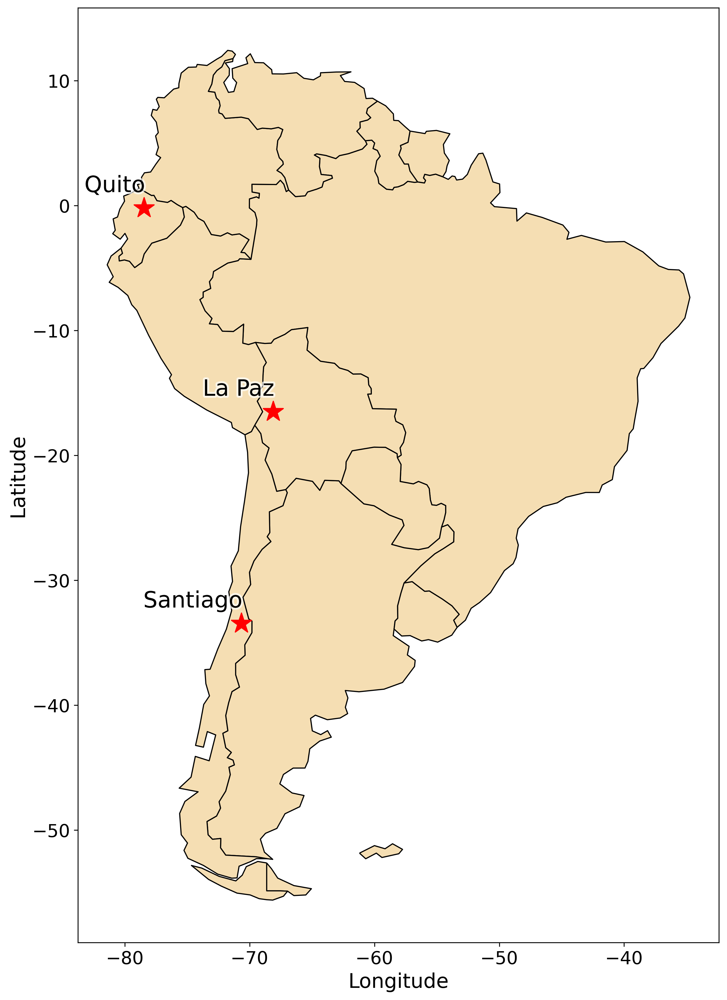

In [430]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects

offset_x=0.1
offset_y=0.9

# Load the world dataset from geopandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Filter the dataset for South America
south_america = world[world['continent'] == 'South America']

# Create a GeoDataFrame for the cities
cities = gpd.GeoDataFrame({
    'City': ['Quito', 'La Paz', 'Santiago'],
    'Country': ['Ecuador', 'Bolivia', 'Chile'],
    'Latitude': [-0.1807, -16.4897, -33.4489],
    'Longitude': [-78.4678, -68.1193, -70.6693]
}, geometry=gpd.points_from_xy([-78.4678, -68.1193, -70.6693], [-0.1807, -16.4897, -33.4489]))

# Plot the map
fig, ax = plt.subplots(figsize=(15, 15), dpi=300)
south_america.plot(ax=ax, color='wheat', edgecolor='black')
cities.plot(ax=ax, color='red', marker='*', markersize=350, label='Cities')

# Add labels for the cities
for x, y, label in zip(cities.geometry.x, cities.geometry.y, cities['City']):
    text = ax.text(x + offset_x, y + offset_y, label, fontsize=20, ha='right', va='bottom')
    text.set_path_effects([path_effects.Stroke(linewidth=3.5, foreground='white', alpha=0.7), path_effects.Normal()])

# Customize the plot
# ax.set_title('Map of South America Highlighting Quito, La Paz, and Santiago', fontsize=20)
plt.xlabel('Longitude', fontsize=18)
plt.ylabel('Latitude', fontsize=18)
ax.tick_params(axis='both', which='major', labelsize=16)

# plt.legend()
plt.savefig("SA_map.pdf", format='pdf', bbox_inches='tight')
plt.show()


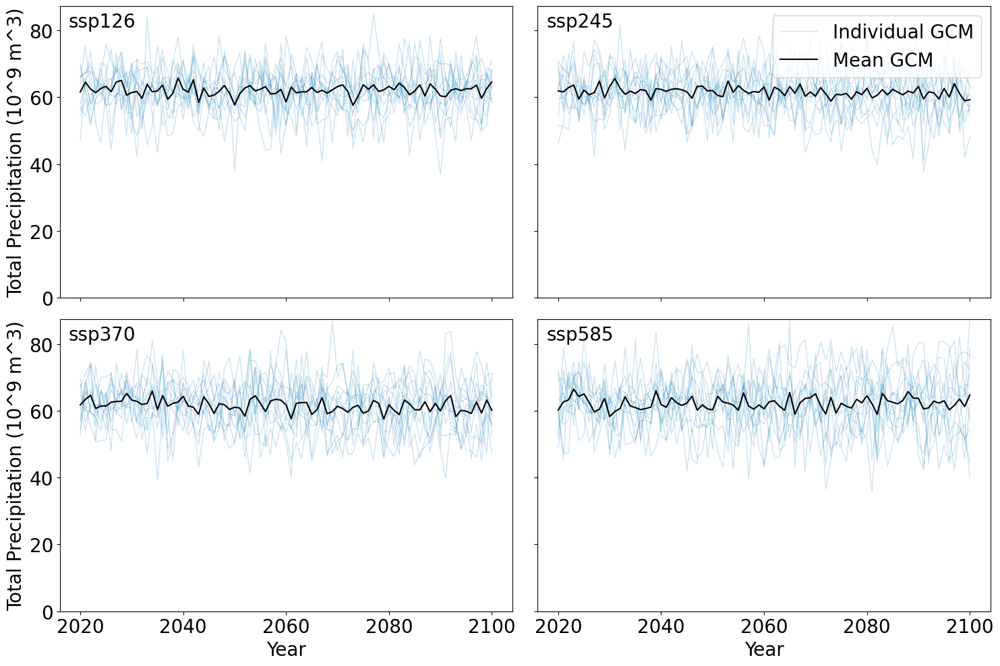

In [165]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Function to plot total precipitation for each SSP scenario
def plot_total_prcp_per_ssp(annual_prcp_dict, gcm_list, ssps, window=1): # Control smoothing here
    light_blue = sns.color_palette("colorblind")[0]  # Choose a light blue color
    mean_color = 'black'
    fontsize = 20

    # Create a 2x2 grid for plotting
    fig, axes = plt.subplots(2, 2, figsize=(15, 10), sharex=True, sharey=True)
    axes = axes.flatten()

    for idx, ssp in enumerate(ssps):
        ax = axes[idx]

        for gcm in gcm_list:
            gcm_key = f'{gcm}-{ssp}'
            if gcm_key in annual_prcp_dict:
                gcm_data = annual_prcp_dict[gcm_key].rolling(time=window, center=True).mean()
                years = gcm_data['time'].values
                prcp_values = gcm_data.values
                ax.plot(years, prcp_values, color=light_blue, linewidth=1, alpha=0.2, label='Individual GCM')

        # Calculate and plot the mean of GCMs
        ssp_data = [annual_prcp_dict[f'{gcm}-{ssp}'].rolling(time=window, center=True).mean() for gcm in gcm_list if f'{gcm}-{ssp}' in annual_prcp_dict]
        if ssp_data:
            stacked_data = np.stack([data.values for data in ssp_data], axis=0)
            mean_prcp = np.mean(stacked_data, axis=0)
            ax.plot(years, mean_prcp, label='Mean GCM', color=mean_color, linewidth=1.5)

        if idx % 2 == 0:
            ax.set_ylabel('Total Precipitation (10^9 m^3)', fontsize=fontsize)
        if idx >= 2:
            ax.set_xlabel('Year', fontsize=fontsize)
        ax.grid(False)

        # Set x-axis ticks to show years in increments of 20
        ax.set_xticks(np.arange(years[0], years[-1] + 1, 20))
        ax.tick_params(axis='both', labelsize=fontsize)

        # Set y-axis minimum to 0
        ax.set_ylim(bottom=0)

        # Add SSP label in the upper left corner of each plot
        ax.text(0.02, 0.98, ssp, transform=ax.transAxes,
                verticalalignment='top', horizontalalignment='left',
                fontsize=fontsize)

    # Set legend in the upper right corner of the upper right plot
    handles, labels = ax.get_legend_handles_labels()
    axes[1].legend(handles[-2:], labels[-2:], loc='upper right', fontsize=20, frameon=True)  # Show the last two legend items

    plt.tight_layout(rect=[0, 0, 1, 1])
    plt.show()

# Call the plotting function
plot_total_prcp_per_ssp(annual_prcp_dict, gcm_list, ssps)



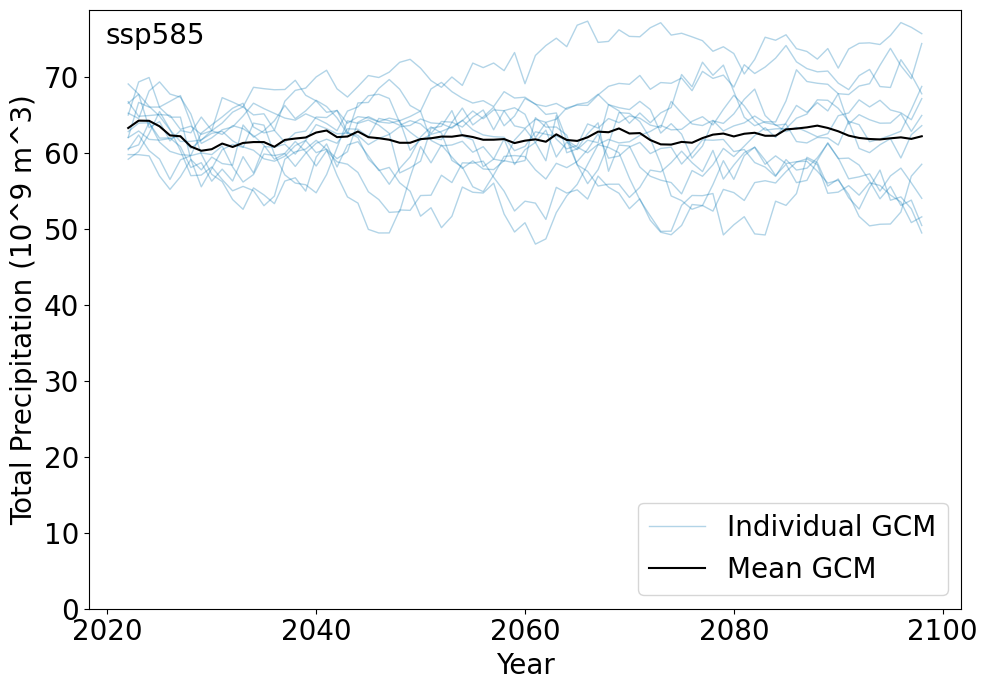

In [179]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Function to plot total precipitation for a single SSP scenario
def plot_total_prcp_ssp585(annual_prcp_dict, gcm_list, window=5): # Control smoothing here
    light_blue = sns.color_palette("colorblind")[0]  # Choose a light blue color
    mean_color = 'black'
    fontsize = 20
    ssp = 'ssp585'  # Fixed SSP scenario

    # Create a single plot
    fig, ax = plt.subplots(figsize=(10, 7))

    for gcm in gcm_list:
        gcm_key = f'{gcm}-{ssp}'
        if gcm_key in annual_prcp_dict:
            gcm_data = annual_prcp_dict[gcm_key].rolling(time=window, center=True).mean()
            years = gcm_data['time'].values
            prcp_values = gcm_data.values
            ax.plot(years, prcp_values, color=light_blue, linewidth=1, alpha=0.3, label='Individual GCM')

    # Calculate and plot the mean of GCMs
    ssp_data = [annual_prcp_dict[f'{gcm}-{ssp}'].rolling(time=window, center=True).mean() for gcm in gcm_list if f'{gcm}-{ssp}' in annual_prcp_dict]
    if ssp_data:
        stacked_data = np.stack([data.values for data in ssp_data], axis=0)
        mean_prcp = np.mean(stacked_data, axis=0)
        ax.plot(years, mean_prcp, label='Mean GCM', color=mean_color, linewidth=1.5)

    ax.set_ylabel('Total Precipitation (10^9 m^3)', fontsize=fontsize)
    ax.set_xlabel('Year', fontsize=fontsize)
    ax.grid(False)

    # Set x-axis ticks to show years in increments of 20
    ax.set_xticks(np.arange(years[0], years[-1] + 1, 20))
    ax.tick_params(axis='both', labelsize=fontsize)

    # Set y-axis minimum to 0
    ax.set_ylim(bottom=0)

    # Add SSP label in the upper left corner
    ax.text(0.02, 0.98, ssp, transform=ax.transAxes,
            verticalalignment='top', horizontalalignment='left',
            fontsize=fontsize)

    # Set legend in the upper right corner
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[-2:], labels[-2:], loc='lower right', fontsize=20, frameon=True)  # Show the last two legend items

    plt.tight_layout(rect=[0, 0, 1, 1])
    plt.savefig("LaPaz_ssp585_prcp.pdf", format='pdf', bbox_inches='tight', dpi=300)
    plt.show()

# Call the plotting function for SSP585
plot_total_prcp_ssp585(annual_prcp_dict, gcm_list)


##

/var/folders/q4/r3b9pkcx6bn5djf1vxnj5xkr0000gn/T/ipykernel_12260/249259376.py:9: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


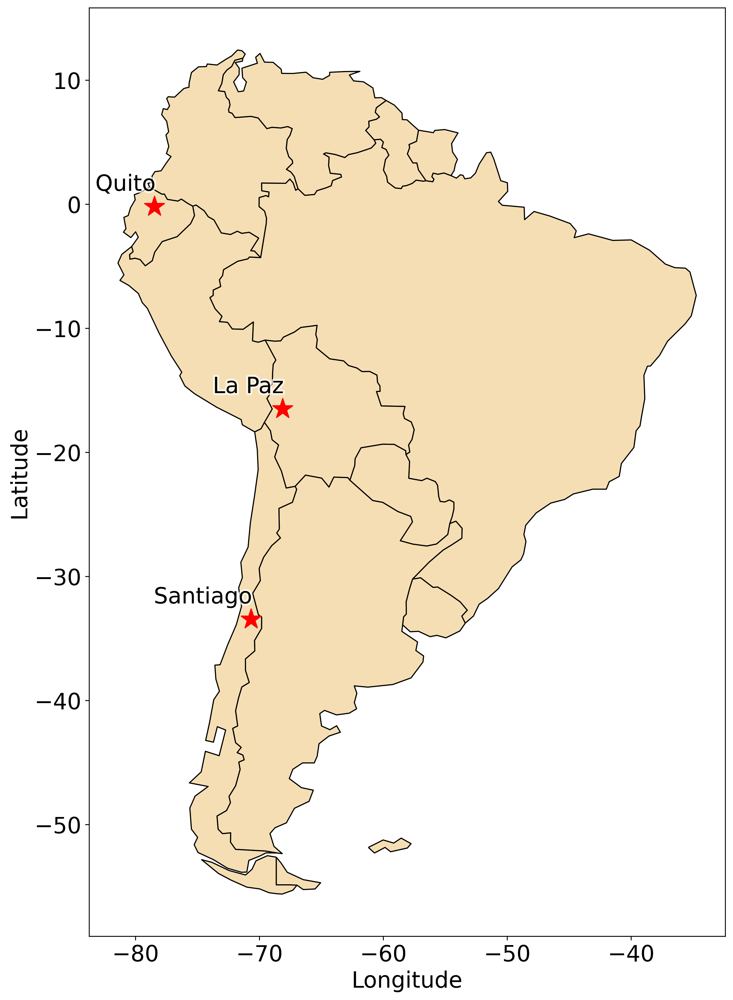

In [90]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects

offset_x=0.1
offset_y=0.9

# Load the world dataset from geopandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Filter the dataset for South America
south_america = world[world['continent'] == 'South America']

# Create a GeoDataFrame for the cities
cities = gpd.GeoDataFrame({
    'City': ['Quito', 'La Paz', 'Santiago'],
    'Country': ['Ecuador', 'Bolivia', 'Chile'],
    'Latitude': [-0.1807, -16.4897, -33.4489],
    'Longitude': [-78.4678, -68.1193, -70.6693]
}, geometry=gpd.points_from_xy([-78.4678, -68.1193, -70.6693], [-0.1807, -16.4897, -33.4489]))

# Plot the map
fig, ax = plt.subplots(figsize=(15, 15), dpi=300)
south_america.plot(ax=ax, color='wheat', edgecolor='black')
cities.plot(ax=ax, color='red', marker='*', markersize=350, label='Cities')

# Add labels for the cities
for x, y, label in zip(cities.geometry.x, cities.geometry.y, cities['City']):
    text = ax.text(x + offset_x, y + offset_y, label, fontsize=20, ha='right', va='bottom')
    text.set_path_effects([path_effects.Stroke(linewidth=3.5, foreground='white', alpha=0.7), path_effects.Normal()])

# Customize the plot
# ax.set_title('Map of South America Highlighting Quito, La Paz, and Santiago', fontsize=20)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)

# Customize tick labels
ax.tick_params(axis='both', which='major', labelsize=20)  # Adjust the number 14 to your desired font size

# plt.legend()
plt.savefig("SA_map.pdf", format='pdf', bbox_inches='tight')
plt.show()

# Stuff I was trying that didn't work

## some seasonal runoff plots; nearly there, might need gpt4

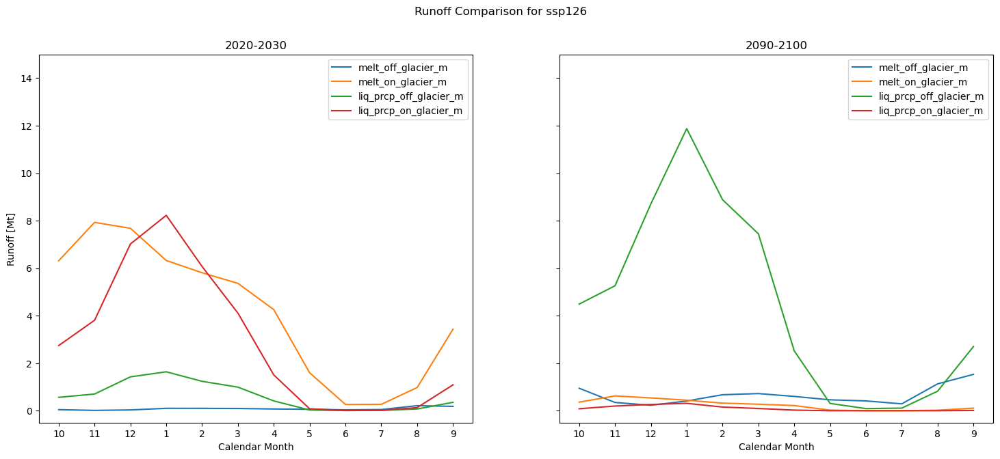

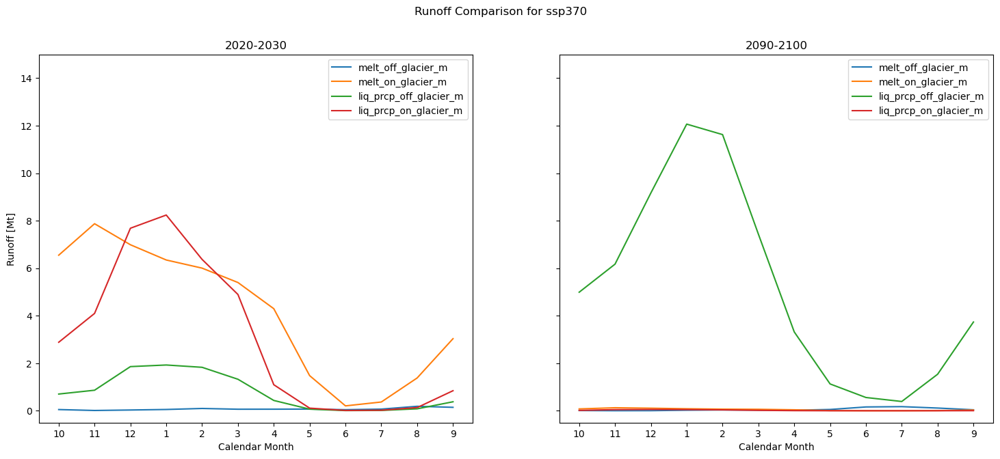

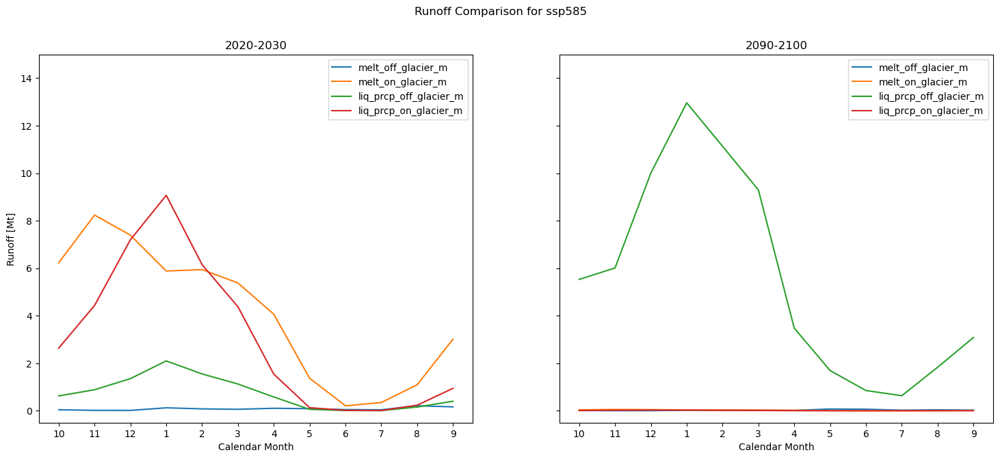

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


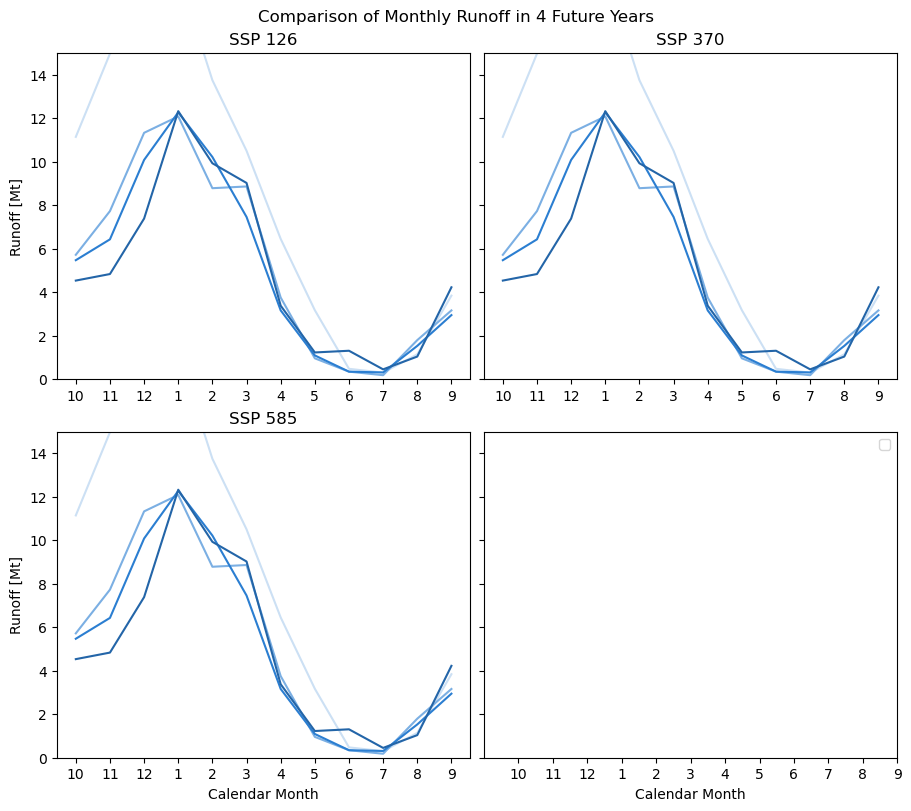

In [44]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np
import pandas as pd
import os

# Function to load the dataset
def open_series(fpath_stem, which_date, which_gcm, which_ssp):
    this_fpath = os.path.expanduser(fpath_stem + '{}-gcm_data_{}_{}_compiled_output.nc'.format(which_date, which_gcm, which_ssp))
    return xr.open_dataset(this_fpath)

# Calculate seasonal runoff
def calc_seasonal(this_ds):
    melt1 = this_ds.melt_on_glacier_monthly
    melt2 = this_ds.melt_off_glacier_monthly
    melt3 = this_ds.liq_prcp_off_glacier_monthly
    melt4 = this_ds.liq_prcp_on_glacier_monthly
    
    this_sum = melt1.sum(dim='rgi_id').dropna(dim='time') + melt2.sum(dim='rgi_id').dropna(dim='time') + melt3.sum(dim='rgi_id').dropna(dim='time') + melt4.sum(dim='rgi_id').dropna(dim='time')
    nonzero_sum = this_sum.where(this_sum != 0, drop=True)
    nonzero_sum *= 1e-9
    
    return nonzero_sum

# Select a year and take the mean runoff of all GCMs for this year
def season_sliced(keys, dictionary, time):
    new_df = pd.DataFrame()
    for k in keys:
        new = dictionary[k]
        new = new.isel(time=time)
        new = pd.DataFrame(new)
        new_df[k] = new
        new_df['mean'] = new_df.transpose().mean()
    return new_df

# Calculate monthly runoff for a given runoff value
def rtype_calc_monthly(keys, dictionary, runoff):
    dataframe = pd.DataFrame()
    for k in keys:
        rtype_gcm = dictionary[k]
        rtype = rtype_gcm[runoff]
        rtype = pd.DataFrame(rtype)
        dataframe[k] = rtype
        dataframe['mean'] = dataframe.transpose().mean()
    return dataframe

# Function to calculate and visualize runoff
def plot_runoff(rtype_calc_s, rtype_calc_e, index2, ssp, season_roll, season_roll2):
    runoff_variables = ['melt_off_glacier_m', 'melt_on_glacier_m', 'liq_prcp_off_glacier_m', 'liq_prcp_on_glacier_m']
    s_keys = rtype_calc_s.keys()
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7), sharey=True)
    
    for r in runoff_variables:
        runoff_s = rtype_calc_monthly(s_keys, rtype_calc_s, r)
        runoff_e = rtype_calc_monthly(s_keys, rtype_calc_e, r)
        ax1.plot(index2, runoff_s['mean'], label=r)
        ax2.plot(index2, runoff_e['mean'], label=r)
    
    ax1.set(ylabel='Runoff [Mt]', title='2020-2030')
    ax2.set(title='2090-2100')
    
    for ax in (ax1, ax2):
        ax.set(xticks=season_roll['month_2d'].values,
               xticklabels=season_roll2['month_2d'].values,
               xlabel='Calendar Month')
        ax.legend()
    
    plt.ylim([-0.5, 15])
    plt.suptitle(f'Runoff Comparison for {ssp}')
    plt.show()

# Define variables
base = '/Users/ziggygoddard/Documents/summer24/'
gcm_list = ['gfdl-esm4_r1i1p1f1', 'mpi-esm1-2-hr_r1i1p1f1', 'mri-esm2-0_r1i1p1f1',
            'ipsl-cm6a-lr_r1i1p1f1', 'ukesm1-0-ll_r1i1p1f2']
date_list = ['2024-06-12', '2024-06-17']
ssp_list = ['ssp126', 'ssp370', 'ssp585']
n_roll = 3

# Load datasets and calculate seasonal values
all_monthly_dict = {}
season_unroll = {}
for gcm in gcm_list:
    for date in date_list:
        for ssp in ssp_list:
            filepath = base + '{}-gcm_data_{}_{}_compiled_output.nc'.format(date, gcm, ssp)
            if os.path.exists(filepath):
                ssp_value = open_series(fpath_stem=base, which_date=date, which_gcm=gcm, which_ssp=ssp)
                k = '{}-{}'.format(gcm, ssp)
                all_monthly_dict[k] = ssp_value
                season_unroll[k] = calc_seasonal(ssp_value)

# Rolling and summing values
dict_roll = {}
rtype_roll = {}
rtype_calc_s = {}
rtype_calc_e = {}

for k in season_unroll.keys():
    season_roll = season_unroll[k].roll(month_2d=n_roll, roll_coords=False)
    dict_roll[k] = season_roll
    rtype_season = all_monthly_dict[k].roll(month_2d=n_roll, roll_coords=True)
    rtype_sum = rtype_season.sum(dim='rgi_id')
    rtype_roll[k] = rtype_sum
    
    df_key = rtype_roll[k]
    df_m_s = df_key.isel(time=slice(0, 10)).mean(dim='time').to_dataframe() * 1e-9
    df_m_s.columns = [c.replace('_monthly', '_m') for c in df_m_s.columns]
    df_m_s = df_m_s.clip(0)
    rtype_calc_s[k] = df_m_s
    
    df_m_e = df_key.isel(time=slice(-11, -1)).mean(dim='time').to_dataframe() * 1e-9
    df_m_e.columns = [c.replace('_monthly', '_m') for c in df_m_e.columns]
    df_m_e = df_m_e.clip(0)
    rtype_calc_e[k] = df_m_e

# Plotting for each SSP
for ssp in ssp_list:
    ssp_keys = [key for key in season_unroll.keys() if ssp in key]
    season_roll2 = season_unroll[ssp_keys[0]].roll(month_2d=n_roll, roll_coords=True)
    index1 = season_unroll[ssp_keys[0]]
    index2 = index1['month_2d']
    
    plot_runoff({k: v for k, v in rtype_calc_s.items() if ssp in k}, 
                {k: v for k, v in rtype_calc_e.items() if ssp in k}, 
                index2, ssp, season_roll, season_roll2)

# Define keys for each SSP
key_dict = {
    'ssp126': list(season_unroll.keys()),
    'ssp370': list(season_unroll.keys()),
    'ssp585': list(season_unroll.keys())
}

# Plot mean seasonal runoff for four selected years
time = [0, 20, 40, 80]
color_ts = ['#cce0f4', '#7bafe3', '#2b7ed1', '#2365a8']

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(9, 8), sharey=True, constrained_layout=True)

t_idx = 0
for t in time:
    season_t = season_sliced(key_dict['ssp126'], dict_roll, t)
    xvals = np.asarray(season_t.index) + 1
    ax1.plot(xvals, season_t['mean'], label=t+2020, color=color_ts[t_idx])
    t_idx += 1

t_idx = 0
for t in time:
    season_t = season_sliced(key_dict['ssp370'], dict_roll, t)
    xvals = np.asarray(season_t.index) + 1
    ax2.plot(xvals, season_t['mean'], label=t+2020, color=color_ts[t_idx])
    t_idx += 1

t_idx = 0
for t in time:
    season_t = season_sliced(key_dict['ssp585'], dict_roll, t)
    xvals = np.asarray(season_t.index) + 1
    ax3.plot(xvals, season_t['mean'], label=t+2020, color=color_ts[t_idx])
    t_idx += 1

ax1.set(xticks=season_roll['month_2d'].values,
        xticklabels=season_roll2['month_2d'].values,
        title='SSP 126',
        ylabel='Runoff [Mt]')
ax2.set(xticks=season_roll['month_2d'].values,
        xticklabels=season_roll2['month_2d'].values,
        title='SSP 370')
ax3.set(xticks=season_roll['month_2d'].values,
        xticklabels=season_roll2['month_2d'].values,
        title='SSP 585',
        ylabel='Runoff [Mt]',
        xlabel='Calendar Month')
ax4.set(xticks=season_roll['month_2d'].values,
        xticklabels=season_roll2['month_2d'].values,
        xlabel='Calendar Month')

plt.ylim([0, 15])
plt.suptitle('Comparison of Monthly Runoff in 4 Future Years')
plt.legend()
plt.show()

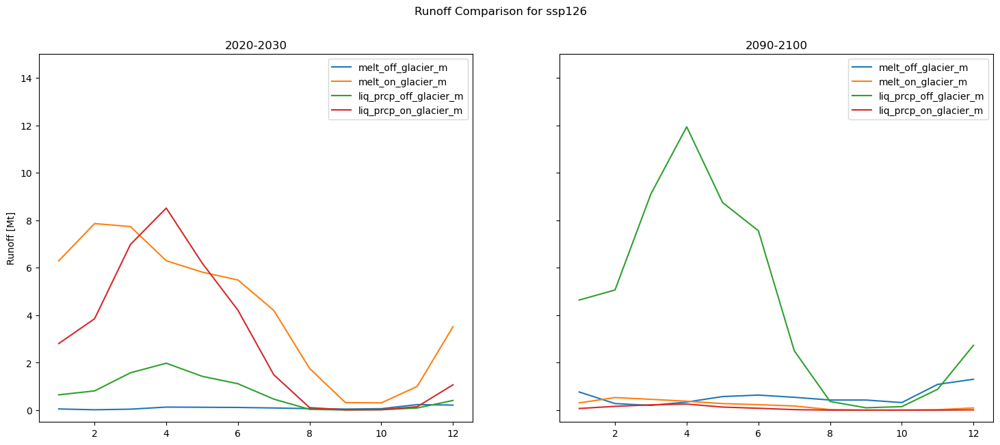

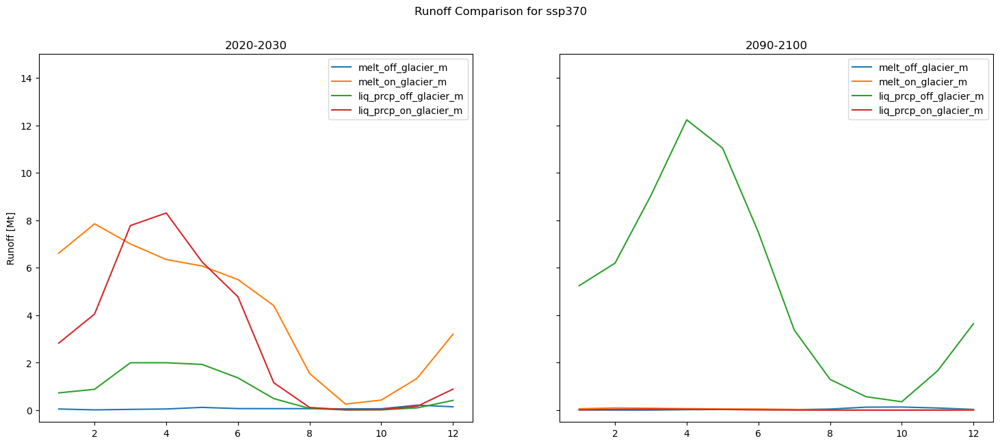

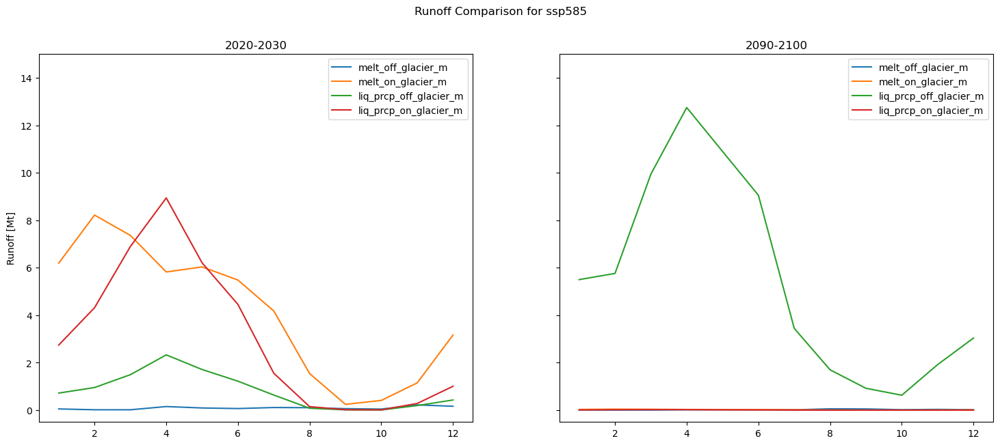

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


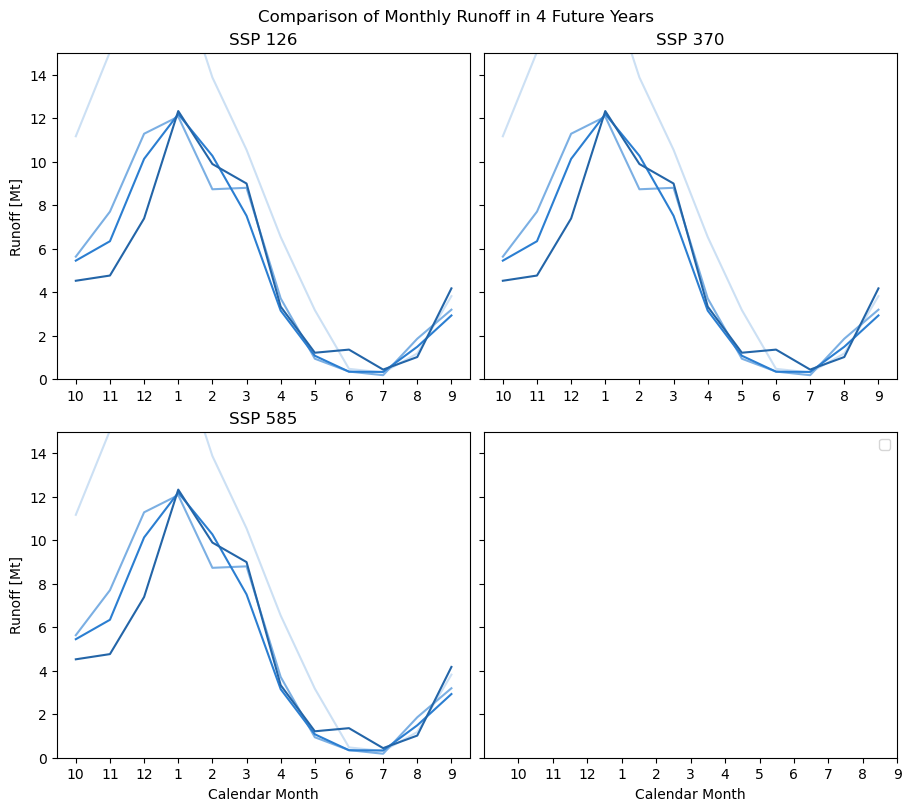

In [45]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np
import pandas as pd
import os

# Function to load the dataset
def open_series(fpath_stem, which_date, which_gcm, which_ssp):
    this_fpath = os.path.expanduser(fpath_stem + '{}-gcm_data_{}_{}_compiled_output.nc'.format(which_date, which_gcm, which_ssp))
    return xr.open_dataset(this_fpath)

# Calculate seasonal runoff
def calc_seasonal(this_ds):
    melt1 = this_ds.melt_on_glacier_monthly
    melt2 = this_ds.melt_off_glacier_monthly
    melt3 = this_ds.liq_prcp_off_glacier_monthly
    melt4 = this_ds.liq_prcp_on_glacier_monthly
    
    this_sum = melt1.sum(dim='rgi_id').dropna(dim='time') + melt2.sum(dim='rgi_id').dropna(dim='time') + melt3.sum(dim='rgi_id').dropna(dim='time') + melt4.sum(dim='rgi_id').dropna(dim='time')
    nonzero_sum = this_sum.where(this_sum != 0, drop=True)
    nonzero_sum *= 1e-9
    
    return nonzero_sum

# Select a year and take the mean runoff of all GCMs for this year
# Correcting the season_sliced function to ensure 'mean' key is calculated
def season_sliced(keys, dictionary, time):
    new_df = pd.DataFrame()
    for k in keys:
        new = dictionary[k]
        new = new.isel(time=time)
        new = pd.DataFrame(new)
        new_df[k] = new
    new_df['mean'] = new_df.mean(axis=1)
    return new_df

# Calculate monthly runoff for a given runoff value
def rtype_calc_monthly(keys, dictionary, runoff):
    dataframe = pd.DataFrame()
    for k in keys:
        rtype_gcm = dictionary[k]
        if runoff in rtype_gcm:
            rtype = rtype_gcm[runoff]
            rtype = pd.DataFrame(rtype)
            dataframe[k] = rtype
    if not dataframe.empty:
        dataframe['mean'] = dataframe.mean(axis=1)
    return dataframe

# Use the rtype_calc_monthly function correctly
def rtype_calc_monthly(keys, dictionary, runoff):
    dataframe = pd.DataFrame()
    for k in keys:
        rtype_gcm = dictionary[k]
        rtype = rtype_gcm[runoff]
        rtype = pd.DataFrame(rtype)
        dataframe[k] = rtype
    dataframe['mean'] = dataframe.mean(axis=1)
    return dataframe

# Function to calculate and visualize runoff
# Correcting the plot_runoff function
def plot_runoff(rtype_calc_s, rtype_calc_e, index2, ssp, season_roll, season_roll2):
    runoff_variables = ['melt_off_glacier_m', 'melt_on_glacier_m', 'liq_prcp_off_glacier_m', 'liq_prcp_on_glacier_m']
    s_keys = rtype_calc_s.keys()
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7), sharey=True)
    
    for r in runoff_variables:
        runoff_s = rtype_calc_monthly(s_keys, rtype_calc_s, r)
        runoff_e = rtype_calc_monthly(s_keys, rtype_calc_e, r)
        if not runoff_s.empty and not runoff_e.empty:
            ax1.plot(index2, runoff_s['mean'], label=r)
            ax2.plot(index2, runoff_e['mean'], label=r)
    
    ax1.set(ylabel='Runoff [Mt]', title='2020-2030')
    ax2.set(title='2090-2100')
    
    for ax in (ax1, ax2):
        if 'month_2d' in season_roll and 'month_2d' in season_roll2:
            ax.set(xticks=season_roll['month_2d'].values,
                   xticklabels=season_roll2['month_2d'].values,
                   xlabel='Calendar Month')
        ax.legend()
    
    plt.ylim([-0.5, 15])
    plt.suptitle(f'Runoff Comparison for {ssp}')
    plt.show()


# Define variables
base = '/Users/ziggygoddard/Documents/summer24/'
gcm_list = ['gfdl-esm4_r1i1p1f1', 'mpi-esm1-2-hr_r1i1p1f1', 'mri-esm2-0_r1i1p1f1',
            'ipsl-cm6a-lr_r1i1p1f1', 'ukesm1-0-ll_r1i1p1f2']
date_list = ['2024-06-12', '2024-06-17']
ssp_list = ['ssp126', 'ssp370', 'ssp585']
n_roll = 3

# Load datasets and calculate seasonal values
all_monthly_dict = {}
season_unroll = {}
for gcm in gcm_list:
    for date in date_list:
        for ssp in ssp_list:
            filepath = base + '{}-gcm_data_{}_{}_compiled_output.nc'.format(date, gcm, ssp)
            if os.path.exists(filepath):
                ssp_value = open_series(fpath_stem=base, which_date=date, which_gcm=gcm, which_ssp=ssp)
                k = '{}-{}'.format(gcm, ssp)
                all_monthly_dict[k] = ssp_value
                season_unroll[k] = calc_seasonal(ssp_value)

# Rolling and summing values
dict_roll = {}
rtype_roll = {}
rtype_calc_s = {}
rtype_calc_e = {}

for k in season_unroll.keys():
    season_roll = season_unroll[k].roll(month_2d=n_roll, roll_coords=False)
    dict_roll[k] = season_roll
    rtype_season = all_monthly_dict[k].roll(month_2d=n_roll, roll_coords=True)
    rtype_sum = rtype_season.sum(dim='rgi_id')
    rtype_roll[k] = rtype_sum
    
    df_key = rtype_roll[k]
    df_m_s = df_key.isel(time=slice(0, 10)).mean(dim='time').to_dataframe() * 1e-9
    df_m_s.columns = [c.replace('_monthly', '_m') for c in df_m_s.columns]
    df_m_s = df_m_s.clip(0)
    rtype_calc_s[k] = df_m_s
    
    df_m_e = df_key.isel(time=slice(-11, -1)).mean(dim='time').to_dataframe() * 1e-9
    df_m_e.columns = [c.replace('_monthly', '_m') for c in df_m_e.columns]
    df_m_e = df_m_e.clip(0)
    rtype_calc_e[k] = df_m_e

# Plotting for each SSP
for ssp in ssp_list:
    ssp_keys = [key for key in season_unroll.keys() if ssp in key]
    season_roll2 = season_unroll[ssp_keys[0]].roll(month_2d=n_roll, roll_coords=True)
    index1 = season_unroll[ssp_keys[0]]
    index2 = index1['month_2d']
    
    plot_runoff({k: v for k, v in rtype_calc_s.items() if ssp in k}, 
                {k: v for k, v in rtype_calc_e.items() if ssp in k}, 
                index2, ssp, season_roll, season_roll2)

# Define keys for each SSP
key_dict = {
    'ssp126': list(season_unroll.keys()),
    'ssp370': list(season_unroll.keys()),
    'ssp585': list(season_unroll.keys())
}

# Plot mean seasonal runoff for four selected years
time = [0, 20, 40, 80]
color_ts = ['#cce0f4', '#7bafe3', '#2b7ed1', '#2365a8']

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(9, 8), sharey=True, constrained_layout=True)

t_idx = 0
for t in time:
    season_t = season_sliced(key_dict['ssp126'], dict_roll, t)
    xvals = np.asarray(season_t.index) + 1
    ax1.plot(xvals, season_t['mean'], label=t+2020, color=color_ts[t_idx])
    t_idx += 1

t_idx = 0
for t in time:
    season_t = season_sliced(key_dict['ssp370'], dict_roll, t)
    xvals = np.asarray(season_t.index) + 1
    ax2.plot(xvals, season_t['mean'], label=t+2020, color=color_ts[t_idx])
    t_idx += 1

t_idx = 0
for t in time:
    season_t = season_sliced(key_dict['ssp585'], dict_roll, t)
    xvals = np.asarray(season_t.index) + 1
    ax3.plot(xvals, season_t['mean'], label=t+2020, color=color_ts[t_idx])
    t_idx += 1

ax1.set(xticks=season_roll['month_2d'].values,
        xticklabels=season_roll2['month_2d'].values,
        title='SSP 126',
        ylabel='Runoff [Mt]')
ax2.set(xticks=season_roll['month_2d'].values,
        xticklabels=season_roll2['month_2d'].values,
        title='SSP 370')
ax3.set(xticks=season_roll['month_2d'].values,
        xticklabels=season_roll2['month_2d'].values,
        title='SSP 585',
        ylabel='Runoff [Mt]',
        xlabel='Calendar Month')
ax4.set(xticks=season_roll['month_2d'].values,
        xticklabels=season_roll2['month_2d'].values,
        xlabel='Calendar Month')

plt.ylim([0, 15])
plt.suptitle('Comparison of Monthly Runoff in 4 Future Years')
plt.legend()
plt.show()

In [46]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np
import pandas as pd
import os

# Function to load the dataset
def open_series(fpath_stem, which_date, which_gcm, which_ssp):
    this_fpath = os.path.expanduser(fpath_stem + '{}-gcm_data_{}_{}_compiled_output.nc'.format(which_date, which_gcm, which_ssp))
    return xr.open_dataset(this_fpath)

# Calculate seasonal runoff
def calc_seasonal(this_ds):
    melt1 = this_ds.melt_on_glacier_monthly
    melt2 = this_ds.melt_off_glacier_monthly
    melt3 = this_ds.liq_prcp_off_glacier_monthly
    melt4 = this_ds.liq_prcp_on_glacier_monthly
    
    this_sum = melt1.sum(dim='rgi_id').dropna(dim='time') + melt2.sum(dim='rgi_id').dropna(dim='time') + melt3.sum(dim='rgi_id').dropna(dim='time') + melt4.sum(dim='rgi_id').dropna(dim='time')
    nonzero_sum = this_sum.where(this_sum != 0, drop=True)
    nonzero_sum *= 1e-9
    
    return nonzero_sum

# Select a year and take the mean runoff of all GCMs for this year
def season_sliced(keys, dictionary, time):
    new_df = pd.DataFrame()
    for k in keys:
        new = dictionary[k]
        if time < len(new.time):  # Ensure time index is valid
            new = new.isel(time=time)
            new = pd.DataFrame(new)
            new_df[k] = new
    if not new_df.empty:
        new_df['mean'] = new_df.mean(axis=1)
    return new_df

# Calculate monthly runoff for a given runoff value
def rtype_calc_monthly(keys, dictionary, runoff):
    dataframe = pd.DataFrame()
    for k in keys:
        rtype_gcm = dictionary[k]
        if runoff in rtype_gcm:
            rtype = rtype_gcm[runoff]
            rtype = pd.DataFrame(rtype)
            dataframe[k] = rtype
    if not dataframe.empty:
        dataframe['mean'] = dataframe.mean(axis=1)
    return dataframe

# Function to calculate and visualize runoff
def plot_runoff(rtype_calc_s, rtype_calc_e, index2, ssp, season_roll, season_roll2):
    runoff_variables = ['melt_off_glacier_m', 'melt_on_glacier_m', 'liq_prcp_off_glacier_m', 'liq_prcp_on_glacier_m']
    s_keys = rtype_calc_s.keys()
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7), sharey=True)
    
    for r in runoff_variables:
        runoff_s = rtype_calc_monthly(s_keys, rtype_calc_s, r)
        runoff_e = rtype_calc_monthly(s_keys, rtype_calc_e, r)
        if not runoff_s.empty and not runoff_e.empty:
            ax1.plot(index2, runoff_s['mean'], label=r)
            ax2.plot(index2, runoff_e['mean'], label=r)
    
    ax1.set(ylabel='Runoff [Mt]', title='2020-2030')
    ax2.set(title='2090-2100')
    
    for ax in (ax1, ax2):
        if 'month_2d' in season_roll and 'month_2d' in season_roll2:
            ax.set(xticks=season_roll['month_2d'].values,
                   xticklabels=season_roll2['month_2d'].values,
                   xlabel='Calendar Month')
        ax.legend()
    
    plt.ylim([-0.5, 15])
    plt.suptitle(f'Runoff Comparison for {ssp}')
    plt.show()

# Define variables
base = '/Users/ziggygoddard/Documents/summer24/'
gcm_list = ['gfdl-esm4_r1i1p1f1', 'mpi-esm1-2-hr_r1i1p1f1', 'mri-esm2-0_r1i1p1f1',
            'ipsl-cm6a-lr_r1i1p1f1', 'ukesm1-0-ll_r1i1p1f2']
date_list = ['2024-06-12', '2024-06-17']
ssp_list = ['ssp126', 'ssp370', 'ssp585']
n_roll = 3

# Load datasets and calculate seasonal values
all_monthly_dict = {}
season_unroll = {}
for gcm in gcm_list:
    for date in date_list:
        for ssp in ssp_list:
            filepath = base + '{}-gcm_data_{}_{}_compiled_output.nc'.format(date, gcm, ssp)
            if os.path.exists(filepath):
                ssp_value = open_series(fpath_stem=base, which_date=date, which_gcm=gcm, which_ssp=ssp)
                k = '{}-{}'.format(gcm, ssp)
                all_monthly_dict[k] = ssp_value
                season_unroll[k] = calc_seasonal(ssp_value)

# Rolling and summing values
dict_roll = {}
rtype_roll = {}
rtype_calc_s = {}
rtype_calc_e = {}

for k in season_unroll.keys():
    season_roll = season_unroll[k].roll(month_2d=n_roll, roll_coords=False)
    dict_roll[k] = season_roll
    rtype_season = all_monthly_dict[k].roll(month_2d=n_roll, roll_coords=True)
    rtype_sum = rtype_season.sum(dim='rgi_id')
    rtype_roll[k] = rtype_sum
    
    df_key = rtype_roll[k].mean(dim='time')
    df_key_e = rtype_roll[k].sel(time=slice('2090', '2100')).mean(dim='time')
    
    rtype_calc_s[k] = df_key
    rtype_calc_e[k] = df_key_e



NameError: name 'rtype_calc_s126' is not defined

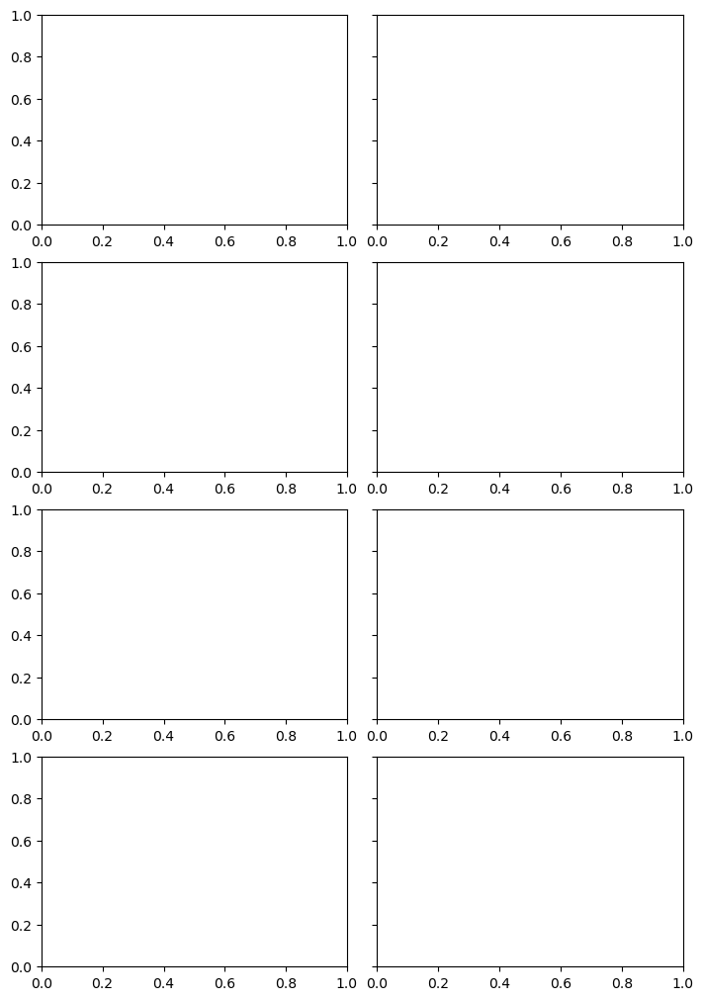

In [47]:
# Make this into a visual
runoff_variables = ['melt_off_glacier_m', 'melt_on_glacier_m']
sum_vars = ['liq_prep_off_glacier_m', 'liq_prep_on_glacier_m']

f, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4, 2, figsize=(7, 10), sharey=True, constrained_layout=True)

color_pr = '#946cbd'
color_m = ('#d9985f', '#d16b6c')

s_keys = rtype_calc_s126.keys()
ct = 0
for r in runoff_variables:
    runoff_s = rtype_calc_monthly(s_keys, rtype_calc_s126, r)
    runoff_e = rtype_calc_monthly(s_keys, rtype_calc_e126, r)
    xvals = index2
    ax1.plot(xvals, runoff_s['mean'], label=r, color=color_m[ct])
    ax2.plot(xvals, runoff_e['mean'], label=r, color=color_m[ct])
    ct += 1
runoff_s = rtype_calc_monthly_2vars(s_keys, rtype_calc_s126, sum_vars[0], sum_vars[1])
runoff_e = rtype_calc_monthly_2vars(s_keys, rtype_calc_e126, sum_vars[0], sum_vars[1])
xvals = index2
ax1.plot(xvals, runoff_s['mean'], label=r, color=color_pr)
ax2.plot(xvals, runoff_e['mean'], label=r, color=color_pr)

s_keys = rtype_calc_s370.keys()
ct = 0
for r in runoff_variables:
    runoff_s = rtype_calc_monthly(s_keys, rtype_calc_s370, r)
    runoff_e = rtype_calc_monthly(s_keys, rtype_calc_e370, r)
    xvals = index2
    ax3.plot(xvals, runoff_s['mean'], label=r, color=color_m[ct])
    ax4.plot(xvals, runoff_e['mean'], label=r, color=color_m[ct])
    ct += 1
runoff_s = rtype_calc_monthly_2vars(s_keys, rtype_calc_s370, sum_vars[0], sum_vars[1])
runoff_e = rtype_calc_monthly_2vars(s_keys, rtype_calc_e370, sum_vars[0], sum_vars[1])
xvals = index2
ax3.plot(xvals, runoff_s['mean'], label=r, color=color_pr)
ax4.plot(xvals, runoff_e['mean'], label=r, color=color_pr)

s_keys = rtype_calc_s585.keys()
ct = 0
for r in runoff_variables:
    runoff_s = rtype_calc_monthly(s_keys, rtype_calc_s585, r)
    runoff_e = rtype_calc_monthly(s_keys, rtype_calc_e585, r)
    xvals = index2
    ax5.plot(xvals, runoff_s['mean'], label=r, color=color_m[ct])
    ax6.plot(xvals, runoff_e['mean'], label=r, color=color_m[ct])
    ct += 1
runoff_s = rtype_calc_monthly_2vars(s_keys, rtype_calc_s585, sum_vars[0], sum_vars[1])
runoff_e = rtype_calc_monthly_2vars(s_keys, rtype_calc_e585, sum_vars[0], sum_vars[1])
xvals = index2
ax5.plot(xvals, runoff_s['mean'], label=r, color=color_pr)
ax6.plot(xvals, runoff_e['mean'], label=r, color=color_pr)

ax8.plot(xvals, runoff_e['mean'], label=r, color=color_pr)

ax1.set(ylabel='Runoff [Mt]', title='2020-2030') # this title and the next one are overwritten by my addition
ax2.set(title='2090-2100')
ax3.set(ylabel='Runoff [Mt]')
ax5.set(ylabel='Runoff [Mt]')
ax7.set(ylabel='Runoff [Mt]', xlabel='Month')
ax8.set(xlabel='Month')

# THIS WORKS
for ax in (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8):
    ax.set(xticks=season_roll['month_2d'].values,
           xticklabels=season_roll2['month_2d'].values,  # here, we want calendar year values
           )

ax1.text(0.03, 0.9, 'ssp 2.6', transform=ax1.transAxes)
ax2.text(0.03, 0.9, 'ssp 2.6', transform=ax2.transAxes)
ax3.text(0.03, 0.9, 'ssp 4.5', transform=ax3.transAxes)
ax4.text(0.03, 0.9, 'ssp 4.5', transform=ax4.transAxes)
ax5.text(0.03, 0.9, 'ssp 6.0', transform=ax5.transAxes)
ax6.text(0.03, 0.9, 'ssp 6.0', transform=ax6.transAxes)
ax7.text(0.03, 0.9, 'ssp 8.5', transform=ax7.transAxes)
ax8.text(0.03, 0.9, 'ssp 8.5', transform=ax8.transAxes)

plt.suptitle('Decadal seasonal runoff averages by runoff component', fontweight='bold', fontsize=14)

plt.show()

In [ ]:
# Calculating mean runoff values for each SSP
rtype_calc_s126 = {}
rtype_calc_e126 = {}
rtype_calc_s370 = {}
rtype_calc_e370 = {}
rtype_calc_s585 = {}
rtype_calc_e585 = {}

In [ ]:
# Set up the dictionaries with values to use in the summing function
s_keys_dict = {}
s_keys_dict['ssp126'] = rtype_calc_s126.keys()
s_keys_dict['ssp370'] = rtype_calc_s370.keys()
s_keys_dict['ssp585'] = rtype_calc_s585.keys()

rtype_calc_dict_s = {}
rtype_calc_dict_s['ssp126'] = rtype_calc_s126
rtype_calc_dict_s['ssp370'] = rtype_calc_s370
rtype_calc_dict_s['ssp585'] = rtype_calc_s585

rtype_calc_dict_e = {}
rtype_calc_dict_e['ssp126'] = rtype_calc_e126
rtype_calc_dict_e['ssp370'] = rtype_calc_e370
rtype_calc_dict_e['ssp585'] = rtype_calc_e585

In [ ]:
# Make a function that calculates a given runoff value, which I can visualize later
def rtype_calc_monthly_2vars(keys, dictionary, runoff1, runoff2):
    dataframe = pd.DataFrame()
    for k in keys:
        rtype_gcm = dictionary[k]
        rtype1 = rtype_gcm[runoff1]
        rtype2 = rtype_gcm[runoff2]
        rsum = rtype1 + rtype2
        rtype_sum = pd.DataFrame(rsum)
        dataframe[k] = rtype_sum
    dataframe['mean'] = dataframe.transpose().mean()
    return dataframe

In [ ]:
ssp = ('ssp126', 'ssp370', 'ssp585')

all_ssp_dict_s = {}

for r in ssp:
    melt_on = rtype_calc_monthly(s_keys_dict[r], rtype_calc_dict_s[r], 'melt_on_glacier_m')
    melt_off = rtype_calc_monthly(s_keys_dict[r], rtype_calc_dict_s[r], 'melt_off_glacier_m')
    liq = rtype_calc_monthly_2vars(s_keys_dict[r], rtype_calc_dict_s[r], 'liq_prep_off_glacier_m', 'liq_prep_on_glacier_m')
    summed = melt_on + melt_off + liq
    m_on_name = 'm-on-{}'.format(r)
    m_off_name = 'm-off-{}'.format(r)
    liq_name = 'liq-{}'.format(r)
    sum_name = 'sum-{}'.format(r)
    all_ssp_dict_s[m_on_name] = melt_on
    all_ssp_dict_s[m_off_name] = melt_off
    all_ssp_dict_s[liq_name] = liq
    all_ssp_dict_s[sum_name] = summed

all_ssp_dict_e = {}

for r in ssp:
    melt_on = rtype_calc_monthly(s_keys_dict[r], rtype_calc_dict_e[r], 'melt_on_glacier_m')
    melt_off = rtype_calc_monthly(s_keys_dict[r], rtype_calc_dict_e[r], 'melt_off_glacier_m')
    liq = rtype_calc_monthly_2vars(s_keys_dict[r], rtype_calc_dict_e[r], 'liq_prep_off_glacier_m', 'liq_prep_on_glacier_m')
    summed = melt_on + melt_off + liq
    m_on_name = 'm-on-{}'.format(r)
    m_off_name = 'm-off-{}'.format(r)
    liq_name = 'liq-{}'.format(r)
    sum_name = 'sum-{}'.format(r)
    all_ssp_dict_e[m_on_name] = melt_on
    all_ssp_dict_e[m_off_name] = melt_off
    all_ssp_dict_e[liq_name] = liq
    all_ssp_dict_e[sum_name] = summed

In [ ]:
# Graph of relative importance of runoff for each part of the seasonal cycle (decade 1 and last)

f, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4, 2, figsize=(9, 11), sharey=True, constrained_layout = True);

color_pr = '#946cbd'
color_m = ('#d9985f', '#d16b6c')

xvals = index2

# ssp 2.6
ssp_key = 'ssp126'
ax1.stackplot(xvals, all_ssp_dict_s['m-on-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'], 
              all_ssp_dict_s['m-off-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'],
              all_ssp_dict_s['liq-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'],
              labels=['Melt on glacier', 'Melt off glacier', 'Liquid precipitation'],
              colors=['#d16b6c', '#d9985f', '#946cbd']);

ax2.stackplot(xvals, all_ssp_dict_e['m-on-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'], 
              all_ssp_dict_e['m-off-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'],
              all_ssp_dict_e['liq-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'],
              labels=['Melt on glacier', 'Melt off glacier', 'Liquid precipitation'],
              colors=['#d16b6c', '#d9985f', '#946cbd']);

# ssp4.5
ssp_key = 'ssp370'
ax3.stackplot(xvals, all_ssp_dict_s['m-on-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'], 
              all_ssp_dict_s['m-off-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'],
              all_ssp_dict_s['liq-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'],
              labels=['Melt on glacier', 'Melt off glacier', 'Liquid precipitation'],
              colors=['#d16b6c', '#d9985f', '#946cbd']);

ax4.stackplot(xvals, all_ssp_dict_e['m-on-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'], 
              all_ssp_dict_e['m-off-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'],
              all_ssp_dict_e['liq-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'],
              labels=['Melt on glacier', 'Melt off glacier', 'Liquid precipitation'],
              colors=['#d16b6c', '#d9985f', '#946cbd']);

# ssp6.0
ssp_key = 'ssp585'
ax5.stackplot(xvals, all_ssp_dict_s['m-on-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'], 
              all_ssp_dict_s['m-off-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'],
              all_ssp_dict_s['liq-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'],
              labels=['Melt on glacier', 'Melt off glacier', 'Liquid precipitation'],
              colors=['#d16b6c', '#d9985f', '#946cbd']);

ax6.stackplot(xvals, all_ssp_dict_e['m-on-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'], 
              all_ssp_dict_e['m-off-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'],
              all_ssp_dict_e['liq-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'],
              labels=['Melt on glacier', 'Melt off glacier', 'Liquid precipitation'],
              colors=['#d16b6c', '#d9985f', '#946cbd']);


plt.suptitle('Relative seasonal contribution of runoff components', fontweight = 'bold', fontsize = 14);

ax1.set(ylabel='% Total runoff', title='2020-2030')
ax2.set(title='2090-2100')
ax3.set(ylabel='% Total runoff')
ax5.set(ylabel='% Total runoff')
ax7.set(ylabel='% Total runoff', xlabel = 'Month')
ax8.set(xlabel = 'Month')
# THIS WORKS
for ax in (ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8):
    ax.set(xticks = season_roll['month_2d'].values,
           xticklabels = season_roll2['month_2d'].values #here, we want calendar year values
          );
# Add ssp labels as titles (from chatgpt)
ax1.set_title('ssp 2.6: 2020-2030', fontsize=10)
ax2.set_title('ssp 2.6: 2090-2100', fontsize=10)
ax3.set_title('ssp 4.5: 2020-2030', fontsize=10)
ax4.set_title('ssp 4.5: 2090-2100', fontsize=10)
ax5.set_title('ssp 6.0: 2020-2030', fontsize=10)
ax6.set_title('ssp 6.0: 2090-2100', fontsize=10)

#plt.savefig('Figures/Seasonal/Decade_av/4x2_relative_importance_newMay4.png', bbox_inches='tight')

## ignore this for now, starting fresh

In [ ]:
# Calculating mean runoff values for each SSP
rtype_calc_s126 = {}
rtype_calc_e126 = {}
rtype_calc_s370 = {}
rtype_calc_e370 = {}
rtype_calc_s585 = {}
rtype_calc_e585 = {}

In [ ]:
# this code is from ChatGPT

import matplotlib.pyplot as plt

# Define the runoff variables and colors
runoff_variables = ['melt_off_glacier_m', 'melt_on_glacier_m']
sum_vars = ['liq_prcp_off_glacier_m', 'liq_prcp_on_glacier_m']
color_pr = '#946cbd'
color_m = ['#d9985f', '#d16b6c']

# Create subplots with shared y-axis
fig, axes = plt.subplots(4, 2, figsize=(8, 10.5), sharey=True)
(ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8) = axes

# Adjust the space between subplots
plt.subplots_adjust(wspace=0.05, hspace=0.2)

# Plotting function to avoid repetition
def plot_runoff(ax, rtype_calc_s, rtype_calc_e, s_keys, rtype_label):
    ct = 0
    for r in runoff_variables:
        runoff_s = rtype_calc_monthly(s_keys, rtype_calc_s, r)
        runoff_e = rtype_calc_monthly(s_keys, rtype_calc_e, r)
        xvals = index2
        ax[0].plot(xvals, runoff_s['mean'], label=r, color=color_m[ct])
        ax[1].plot(xvals, runoff_e['mean'], label=r, color=color_m[ct])
        ct += 1
    runoff_s = rtype_calc_monthly_2vars(s_keys, rtype_calc_s, sum_vars[0], sum_vars[1])
    runoff_e = rtype_calc_monthly_2vars(s_keys, rtype_calc_e, sum_vars[0], sum_vars[1])
    ax[0].plot(xvals, runoff_s['mean'], label='Total liquid precipitation', color=color_pr)
    ax[1].plot(xvals, runoff_e['mean'], label='Total liquid precipitation', color=color_pr)
    ax[0].set(ylabel='Runoff [Mt]')
    ax[0].text(0.03, 0.9, rtype_label, transform=ax[0].transAxes)
    ax[1].text(0.03, 0.9, rtype_label, transform=ax[1].transAxes)

# Plot each ssp scenario
plot_runoff([ax1, ax2], rtype_calc_s126, rtype_calc_e126, rtype_calc_s126.keys(), 'ssp 126')
plot_runoff([ax3, ax4], rtype_calc_s370, rtype_calc_e370, rtype_calc_s370.keys(), 'ssp 370')
plot_runoff([ax5, ax6], rtype_calc_s585, rtype_calc_e585, rtype_calc_s585.keys(), 'ssp 585')

# Set titles for the columns
ax1.set(title='2020-2030')
ax2.set(title='2090-2100')

# Set x-axis labels and ticks
for ax in (ax7, ax8):
    ax.set(xlabel='Month')
for ax in (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8):
    ax.set(xticks=season_roll['month_2d'].values, xticklabels=season_roll2['month_2d'].values)

# Add a single legend to the right of the plots
handles, labels = ax1.get_legend_handles_labels()
fig.legend(handles, labels, loc='center right', bbox_to_anchor=(1.19, 0.84), borderaxespad=0.)

# Add a ssper title with adjusted vertical position
fig.suptitle('Decadal seasonal runoff averages by runoff component', fontweight='bold', fontsize=14, y=0.94)

plt.show()

In [ ]:
# Set up the dictionaries with values to use in the summing function
s_keys_dict = {}
s_keys_dict['ssp126'] = rtype_calc_s126.keys()
s_keys_dict['ssp370'] = rtype_calc_s370.keys()
s_keys_dict['ssp585'] = rtype_calc_s585.keys()

rtype_calc_dict_s = {}
rtype_calc_dict_s['ssp126'] = rtype_calc_s126
rtype_calc_dict_s['ssp370'] = rtype_calc_s370
rtype_calc_dict_s['ssp585'] = rtype_calc_s585

rtype_calc_dict_e = {}
rtype_calc_dict_e['ssp126'] = rtype_calc_e126
rtype_calc_dict_e['ssp370'] = rtype_calc_e370
rtype_calc_dict_e['ssp585'] = rtype_calc_e585

In [ ]:
# Make a function that calculates a given runoff value, which I can visualize later
def rtype_calc_monthly_2vars(keys, dictionary, runoff1, runoff2):
    dataframe = pd.DataFrame()
    for k in keys:
        rtype_gcm = dictionary[k]
        rtype1 = rtype_gcm[runoff1]
        rtype2 = rtype_gcm[runoff2]
        rsum = rtype1 + rtype2
        rtype_sum = pd.DataFrame(rsum)
        dataframe[k] = rtype_sum
    dataframe['mean'] = dataframe.transpose().mean()
    return dataframe

In [ ]:
ssp = ('ssp126', 'ssp370', 'ssp585')

all_ssp_dict_s = {}

for r in ssp:
    melt_on = rtype_calc_monthly(s_keys_dict[r], rtype_calc_dict_s[r], 'melt_on_glacier_m')
    melt_off = rtype_calc_monthly(s_keys_dict[r], rtype_calc_dict_s[r], 'melt_off_glacier_m')
    liq = rtype_calc_monthly_2vars(s_keys_dict[r], rtype_calc_dict_s[r], 'liq_prcp_off_glacier_m', 'liq_prcp_on_glacier_m')
    summed = melt_on + melt_off + liq
    m_on_name = 'm-on-{}'.format(r)
    m_off_name = 'm-off-{}'.format(r)
    liq_name = 'liq-{}'.format(r)
    sum_name = 'sum-{}'.format(r)
    all_ssp_dict_s[m_on_name] = melt_on
    all_ssp_dict_s[m_off_name] = melt_off
    all_ssp_dict_s[liq_name] = liq
    all_ssp_dict_s[sum_name] = summed

all_ssp_dict_e = {}

for r in ssp:
    melt_on = rtype_calc_monthly(s_keys_dict[r], rtype_calc_dict_e[r], 'melt_on_glacier_m')
    melt_off = rtype_calc_monthly(s_keys_dict[r], rtype_calc_dict_e[r], 'melt_off_glacier_m')
    liq = rtype_calc_monthly_2vars(s_keys_dict[r], rtype_calc_dict_e[r], 'liq_prcp_off_glacier_m', 'liq_prcp_on_glacier_m')
    summed = melt_on + melt_off + liq
    m_on_name = 'm-on-{}'.format(r)
    m_off_name = 'm-off-{}'.format(r)
    liq_name = 'liq-{}'.format(r)
    sum_name = 'sum-{}'.format(r)
    all_ssp_dict_e[m_on_name] = melt_on
    all_ssp_dict_e[m_off_name] = melt_off
    all_ssp_dict_e[liq_name] = liq
    all_ssp_dict_e[sum_name] = summed

In [ ]:
# Graph of relative importance of runoff for each part of the seasonal cycle (decade 1 and last)

f, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4, 2, figsize=(9, 11), sharey=True, constrained_layout = True);

color_pr = '#946cbd'
color_m = ('#d9985f', '#d16b6c')

xvals = index2

# ssp 2.6
ssp_key = 'ssp126'
ax1.stackplot(xvals, all_ssp_dict_s['m-on-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'], 
              all_ssp_dict_s['m-off-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'],
              all_ssp_dict_s['liq-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'],
              labels=['Melt on glacier', 'Melt off glacier', 'Liquid precipitation'],
              colors=['#d16b6c', '#d9985f', '#946cbd']);

ax2.stackplot(xvals, all_ssp_dict_e['m-on-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'], 
              all_ssp_dict_e['m-off-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'],
              all_ssp_dict_e['liq-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'],
              labels=['Melt on glacier', 'Melt off glacier', 'Liquid precipitation'],
              colors=['#d16b6c', '#d9985f', '#946cbd']);

# ssp4.5
ssp_key = 'ssp370'
ax3.stackplot(xvals, all_ssp_dict_s['m-on-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'], 
              all_ssp_dict_s['m-off-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'],
              all_ssp_dict_s['liq-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'],
              labels=['Melt on glacier', 'Melt off glacier', 'Liquid precipitation'],
              colors=['#d16b6c', '#d9985f', '#946cbd']);

ax4.stackplot(xvals, all_ssp_dict_e['m-on-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'], 
              all_ssp_dict_e['m-off-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'],
              all_ssp_dict_e['liq-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'],
              labels=['Melt on glacier', 'Melt off glacier', 'Liquid precipitation'],
              colors=['#d16b6c', '#d9985f', '#946cbd']);

# ssp6.0
ssp_key = 'ssp585'
ax5.stackplot(xvals, all_ssp_dict_s['m-on-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'], 
              all_ssp_dict_s['m-off-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'],
              all_ssp_dict_s['liq-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_s['sum-{}'.format(ssp_key)]['mean'],
              labels=['Melt on glacier', 'Melt off glacier', 'Liquid precipitation'],
              colors=['#d16b6c', '#d9985f', '#946cbd']);

ax6.stackplot(xvals, all_ssp_dict_e['m-on-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'], 
              all_ssp_dict_e['m-off-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'],
              all_ssp_dict_e['liq-{}'.format(ssp_key)]['mean']*100/all_ssp_dict_e['sum-{}'.format(ssp_key)]['mean'],
              labels=['Melt on glacier', 'Melt off glacier', 'Liquid precipitation'],
              colors=['#d16b6c', '#d9985f', '#946cbd']);

#ax1.legend(bbox_to_anchor=(0.44, 0.95));

plt.ssptitle('Relative seasonal contribution of runoff components', fontweight = 'bold', fontsize = 14);

ax1.set(ylabel='% Total runoff', title='2020-2030')
ax2.set(title='2090-2100')
ax3.set(ylabel='% Total runoff')
ax5.set(ylabel='% Total runoff')
ax7.set(ylabel='% Total runoff', xlabel = 'Month')
ax8.set(xlabel = 'Month')
# THIS WORKS
for ax in (ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8):
    ax.set(xticks = season_roll['month_2d'].values,
           xticklabels = season_roll2['month_2d'].values #here, we want calendar year values
          );
# Add ssp labels as titles (from chatgpt)
ax1.set_title('ssp 2.6: 2020-2030', fontsize=10)
ax2.set_title('ssp 2.6: 2090-2100', fontsize=10)
ax3.set_title('ssp 4.5: 2020-2030', fontsize=10)
ax4.set_title('ssp 4.5: 2090-2100', fontsize=10)
ax5.set_title('ssp 6.0: 2020-2030', fontsize=10)
ax6.set_title('ssp 6.0: 2090-2100', fontsize=10)
ax7.set_title('ssp 8.5: 2020-2030', fontsize=10)
ax8.set_title('ssp 8.5: 2090-2100', fontsize=10)


In [ ]:
# from chatgpt to make the following code run; maybe this should go earlier
# Function to calculate seasonal values for a given SSP dictionary
def calculate_seasonal_for_ssp(ssp_dict):
    season_unroll = {}
    for k in ssp_dict.keys():
        calculation = calc_seasonal(ssp_dict[k])
        z = '{}-calc'.format(k)
        season_unroll[z] = calculation
    return season_unroll

# Dictionary of SSP dictionaries
ssp_dicts = {
    'ssp126': ssp_monthly_dict126,
    'ssp245': ssp_monthly_dict245,
    'ssp370': ssp_monthly_dict370
}

# Dictionary to store results for all SSPs
all_season_unrolls = {}

# Calculate seasonal values for each SSP
for ssp_name, ssp_dict in ssp_dicts.items():
    all_season_unrolls[ssp_name] = calculate_seasonal_for_ssp(ssp_dict)

# Now, all_season_unrolls will contain the results for all three SSPs
season_unroll126 = all_season_unrolls['ssp126']
season_unroll245 = all_season_unrolls['ssp245']
season_unroll370 = all_season_unrolls['ssp370']

# Example: Print results for verification
print(season_unroll126)
print(season_unroll245)
print(season_unroll370)


In [ ]:
time = [0, 20, 40, 80]

from matplotlib import cm
#color_ts = ('#c2f2f2', '#81cfdb', '#4c858f', '#23393d')
#New colors 5/4/23
color_ts = ('#cce0f4', '#7bafe3', '#2b7ed1', '#2365a8')

fig, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8), (ax9, ax10, ax11, ax12), (ax13, ax14, ax15, ax16)) = plt.subplots(4, 4, figsize=(10, 9), sharex=True, sharey=True, constrained_layout = True)

# Make first row of ssps for time t=0
t = time[0]
for k in season_unroll126.keys():
    color_idx = 0
    season_t = season_sliced(key_dict['ssp126'], dict_roll126, t)
    xvals = np.asarray(season_t.index)+1
    ax1.plot(xvals, season_t, linewidth=0.15, color=color_ts[color_idx], alpha=0.8)
ax1.plot(xvals, season_t['mean'], color='k', linewidth=1.5)

for k in season_unroll370.keys():
    color_idx = 0
    season_t = season_sliced(key_dict['ssp370'], dict_roll370, t)
    xvals = np.asarray(season_t.index)+1
    ax2.plot(xvals, season_t, linewidth=0.15, color=color_ts[color_idx], alpha=0.8)
ax2.plot(xvals, season_t['mean'], color='k', linewidth=1.5)

for k in season_unroll585.keys():
    color_idx = 0
    season_t = season_sliced(key_dict['ssp585'], dict_roll585, t)
    xvals = np.asarray(season_t.index)+1
    ax3.plot(xvals, season_t, linewidth=0.15, color=color_ts[color_idx], alpha=0.8)
ax3.plot(xvals, season_t['mean'], color='k', linewidth=1.5)

# Make second row of ssps for time t=20
t = time[1]
for k in season_unroll26.keys():
    color_idx = 1
    season_t = season_sliced(key_dict['ssp126'], dict_roll126, t)
    xvals = np.asarray(season_t.index)+1
    ax5.plot(xvals, season_t, linewidth=0.15, color=color_ts[color_idx], alpha=0.7)
ax5.plot(xvals, season_t['mean'], color='k', linewidth=1.5)

for k in season_unroll370.keys():
    color_idx = 1
    season_t = season_sliced(key_dict['ssp370'], dict_roll370, t)
    xvals = np.asarray(season_t.index)+1
    ax6.plot(xvals, season_t, linewidth=0.15, color=color_ts[color_idx], alpha=0.7)
ax6.plot(xvals, season_t['mean'], color='k', linewidth=1.5)

for k in season_unroll585.keys():
    color_idx = 1
    season_t = season_sliced(key_dict['ssp585'], dict_roll585, t)
    xvals = np.asarray(season_t.index)+1
    ax7.plot(xvals, season_t, linewidth=0.15, color=color_ts[color_idx], alpha=0.7)
ax7.plot(xvals, season_t['mean'], color='k', linewidth=1.5)


# Make third row of ssps for time t=40
t = time[2]
for k in season_unroll126.keys():
    color_idx = 2
    season_t = season_sliced(key_dict['ssp126'], dict_roll216, t)
    xvals = np.asarray(season_t.index)+1
    ax9.plot(xvals, season_t, linewidth=0.15, color=color_ts[color_idx], alpha=0.7)
ax9.plot(xvals, season_t['mean'], color='k', linewidth=1.5)

for k in season_unroll370.keys():
    color_idx = 2
    season_t = season_sliced(key_dict['ssp370'], dict_roll370, t)
    xvals = np.asarray(season_t.index)+1
    ax10.plot(xvals, season_t, linewidth=0.15, color=color_ts[color_idx], alpha=0.7)
ax10.plot(xvals, season_t['mean'], color='k', linewidth=1.5)

for k in season_unroll60.keys():
    color_idx = 2
    season_t = season_sliced(key_dict['ssp585'], dict_roll585, t)
    xvals = np.asarray(season_t.index)+1
    ax11.plot(xvals, season_t, linewidth=0.15, color=color_ts[color_idx], alpha=0.7)
ax11.plot(xvals, season_t['mean'], color='k', linewidth=1.5)


# Make fourth row of ssps for time t=80
t = time[3]
for k in season_unroll126.keys():
    color_idx = 3
    season_t = season_sliced(key_dict['ssp126'], dict_roll126, t)
    xvals = np.asarray(season_t.index)+1
    ax13.plot(xvals, season_t, linewidth=0.15, color=color_ts[color_idx], alpha=0.7)
ax13.plot(xvals, season_t['mean'], color='k', linewidth=1.5)

for k in season_unroll370.keys():
    color_idx = 3
    season_t = season_sliced(key_dict['ssp370'], dict_roll370, t)
    xvals = np.asarray(season_t.index)+1
    ax14.plot(xvals, season_t, linewidth=0.15, color=color_ts[color_idx], alpha=0.7)
ax14.plot(xvals, season_t['mean'], color='k', linewidth=1.5)

for k in season_unroll585.keys():
    color_idx = 3
    season_t = season_sliced(key_dict['ssp585'], dict_roll585, t)
    xvals = np.asarray(season_t.index)+1
    ax15.plot(xvals, season_t, linewidth=0.15, color=color_ts[color_idx], alpha=0.7)
ax15.plot(xvals, season_t['mean'], color='k', linewidth=1.5)
    
ax1.set(xticks = season_roll['month_2d'].values,
       xticklabels = season_roll2['month_2d'].values,
       title = 'ssp 126');
ax2.set(xticks = season_roll['month_2d'].values,
       xticklabels = season_roll2['month_2d'].values,
       title = 'ssp 370');
ax3.set(xticks = season_roll['month_2d'].values,
       xticklabels = season_roll2['month_2d'].values,
       title = 'ssp 585');

ax1.set(ylabel = 'Runoff [Mt]')
ax5.set(ylabel = 'Runoff [Mt]')
ax9.set(ylabel = 'Runoff [Mt]')
ax13.set(ylabel = 'Runoff [Mt]',
        xlabel = 'Month')
ax14.set(xlabel = 'Month')
ax15.set(xlabel = 'Month')
ax16.set(xlabel = 'Month')

ax13.tick_params(axis='x', which='major', labelsize=8)
ax14.tick_params(axis='x', which='major', labelsize=8)
ax15.tick_params(axis='x', which='major', labelsize=8)
ax16.tick_params(axis='x', which='major', labelsize=8)

plt.suptitle('Multi-GCM seasonal runoff for four selected years', fontweight = 'bold', fontsize = 14);

In [ ]:
# Plotting total annual runoff
def plot_total_annual_runoff(total_annual_runoff_dict, ssps):
    plt.figure(figsize=(14, 7))
    
    for ssp in ssps:
        ssp_data = [runoff.sel(time=slice(None, '2101')) for scenario, runoff in total_annual_runoff_dict.items() if ssp in scenario]
        if ssp_data:
            combined_runoff = xr.concat(ssp_data, dim='gcm').mean(dim='gcm')
            combined_runoff.plot(label=ssp)

    plt.title('Total Annual Runoff for Different ssp Scenarios')
    plt.xlabel('Year')
    plt.ylabel('Runoff (km³)')
    plt.legend()
    plt.show()

plot_total_annual_runoff(total_annual_runoff_dict, ssp_list)

In [ ]:
# This plots values for both GCMs rather than mean. Bad visual, but useful to see how to do it.

def plot_total_annual_runoff(total_annual_runoff_dict, ssps, plot_individual_gcms=False):
    plt.figure(figsize=(14, 7))
    
    for ssp in ssps:
        if plot_individual_gcms:
            for scenario, runoff in total_annual_runoff_dict.items():
                if ssp in scenario:
                    runoff.sel(time=slice(None, '2101')).plot(label=f'{scenario}')
        else:
            ssp_data = [runoff.sel(time=slice(None, '2101')) for scenario, runoff in total_annual_runoff_dict.items() if ssp in scenario]
            if ssp_data:
                combined_runoff = xr.concat(ssp_data, dim='gcm').mean(dim='gcm')
                combined_runoff.plot(label=ssp)

    plt.title('Total Annual Runoff for Different ssp Scenarios')
    plt.xlabel('Year')
    plt.ylabel('Runoff (km³)')
    plt.legend()
    plt.show()

plot_total_annual_runoff(total_annual_runoff_dict, ssp_list, plot_individual_gcms=True)